# Parte 1 — Análisis Exploratorio de Datos

**Curso:** Machine Learning · 2026-3

---

### Objetivo de este notebook

Comprender la **estructura, calidad y relaciones iniciales** del conjunto de datos
*Lending Club Loan Data* antes de cualquier preprocesamiento o modelado, de modo que
todas las decisiones posteriores (selección de variables, imputación, transformaciones,
tratamiento del desbalance) queden **justificadas con evidencia** y no por convención.

El objetivo final del proyecto es un clasificador binario que prediga si un préstamo
terminará en *default* (`1 = Charged Off`) o será pagado en su totalidad (`0 = Fully Paid`),
comparando `scikit-learn` contra `PySpark` e interpretando predicciones con LIME.

### Restricción de diseño

> *"Se debe utilizar el dataset completo sin ningún tipo de muestreo, submuestreo o
> reducción de filas."*

Esta restricción se respeta de forma estricta: **todos los estadísticos, pruebas de
hipótesis, conteos de nulos y correlaciones de este notebook se calculan sobre la
totalidad de las filas.** El muestreo aparece únicamente en tres visualizaciones donde
es la practica habitual y donde dibujar 1,3 millones de puntos sería ilegible y
computacionalmente absurdo (`pairplot`, matriz de dispersión, y las curvas KDE/violín,
que son estimaciones de densidad). En cada uno de esos casos el muestreo está **anotado
explícitamente en el gráfico**, y el estadístico correspondiente se reporta siempre
sobre la población completa.

### Hoja de ruta

| # | Contenido |
|---|-----------|
| 0 | Configuración del entorno y utilidades |
| 1 | Carga inicial y visión general |
| 2 | Definición del *target* y del universo de modelado |
| 3 | Taxonomía de variables y **fuga de información** |
| 4 | Análisis unidimensional |
| 5 | Análisis bidimensional |
| 6 | Valores faltantes (análisis detallado) |
| 7 | Resumen ejecutivo del EDA |

---
# 0. Configuración del entorno y utilidades

Se fija el entorno, se declaran las rutas y se definen de una sola vez las funciones
estadísticas que se reutilizarán a lo largo del notebook (rango intercuartílico, tamaños
de efecto, V de Cramér, correlación punto-biserial). Concentrarlas aquí evita repetir
lógica y garantiza que un mismo criterio se aplique a todas las variables.

In [1]:
import os, sys, time, warnings, math, gc
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import ticker as mticker, colors as mcolors, patches as mpatches
import seaborn as sns
from scipy import stats

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------------------------------------------------------- pandas
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 260)
pd.set_option("display.width", 200)
pd.set_option("display.float_format", lambda v: format(v, ",.4f"))

# ------------------------------------------------------------ matplotlib
sns.set_theme(style="whitegrid", context="notebook")
mpl.rcParams.update({
  "figure.dpi":    110,
  "savefig.dpi":    110,
  "figure.facecolor": "white",
  "axes.titlesize":  11,
  "axes.titleweight": "bold",
  "axes.labelsize":  9.5,
  "xtick.labelsize":  8.5,
  "ytick.labelsize":  8.5,
  "legend.fontsize":  9,
  "axes.grid":     True,
  "grid.alpha":    0.25,
})

# Paleta consistente para las dos clases del target (usada en TODO el notebook)
C_PAID, C_DEF = "#2E7D8F", "#C1554A"   # 0 = Fully Paid, 1 = Charged Off
PAL_TARGET  = {0: C_PAID, 1: C_DEF}
C_NEUTRAL   = "#5B7C99"

RNG = np.random.default_rng(42)      # reproducibilidad del muestreo grafico

print("Python   :", sys.version.split()[0])
print("pandas   :", pd.__version__)
print("numpy   :", np.__version__)
print("matplotlib :", mpl.__version__)
print("seaborn  :", sns.__version__)
import scipy
print("scipy   :", scipy.__version__)

Python     : 3.11.14
pandas     : 2.3.3
numpy      : 1.25.2
matplotlib : 3.7.2
seaborn    : 0.12.2
scipy      : 1.11.2


In [2]:
# ----------------------------------------------------------------- rutas
BASE = Path.cwd()
if not (BASE / "data_tarea_1").exists() and (BASE.parent / "data_tarea_1").exists():
  BASE = BASE.parent

DATA_DIR = BASE / "data_tarea_1"
CSV_ACC = DATA_DIR / "accepted_2007_to_2018q4.csv" / "accepted_2007_to_2018Q4.csv"
CSV_REJ = DATA_DIR / "rejected_2007_to_2018q4.csv" / "rejected_2007_to_2018Q4.csv"

OUT_DIR = BASE / "outputs"
OUT_DIR.mkdir(exist_ok=True)

assert CSV_ACC.exists(), "No se encuentra el CSV de aceptados en " + str(CSV_ACC)
print("Proyecto  :", BASE)
print("Aceptados : {} ({:.2f} GB)".format(CSV_ACC.name, CSV_ACC.stat().st_size / 1e9))
if CSV_REJ.exists():
  print("Rechazados : {} ({:.2f} GB)".format(CSV_REJ.name, CSV_REJ.stat().st_size / 1e9))
print("Salidas  :", OUT_DIR)

Proyecto   : <directorio del proyecto>
Aceptados  : accepted_2007_to_2018Q4.csv  (1.68 GB)
Rechazados : rejected_2007_to_2018Q4.csv  (1.78 GB)
Salidas    : <directorio del proyecto>\outputs


In [3]:
# ============================================================================
# UTILIDADES ESTADISTICAS
# Se definen una sola vez y se aplican con el mismo criterio a toda variable.
# ============================================================================

def iqr_outliers(s):
  '''Regla de Tukey: atipico si cae fuera de [Q1 - 1.5*IQR, Q3 + 1.5*IQR].'''
  s = s.dropna()
  if s.empty:
    return dict(Q1=np.nan, Q3=np.nan, IQR=np.nan, lim_inf=np.nan,
          lim_sup=np.nan, n_out=0, pct_out=np.nan)
  q1, q3 = s.quantile(0.25), s.quantile(0.75)
  iqr  = q3 - q1
  lo, hi = q1 - 1.5 * iqr, q3 + 1.5 * iqr
  mask  = (s < lo) | (s > hi)
  return dict(Q1=q1, Q3=q3, IQR=iqr, lim_inf=lo, lim_sup=hi,
        n_out=int(mask.sum()), pct_out=100.0 * mask.mean())

def cohens_d(a, b):
  '''Tamano de efecto de Cohen (diferencia de medias estandarizada).'''
  a, b = np.asarray(a, float), np.asarray(b, float)
  na, nb = a.size, b.size
  if na < 2 or nb < 2:
    return np.nan
  sp = np.sqrt(((na - 1) * a.var(ddof=1) + (nb - 1) * b.var(ddof=1)) / (na + nb - 2))
  return (a.mean() - b.mean()) / sp if sp > 0 else np.nan

def interpret_d(d):
  '''Umbrales convencionales de Cohen (1988): 0,2 pequeno | 0,5 mediano | 0,8 grande.'''
  if not np.isfinite(d):
    return "-"
  a = abs(d)
  return ("despreciable" if a < 0.20 else
      "pequeno"   if a < 0.50 else
      "mediano"   if a < 0.80 else
      "grande")

def cramers_v(x, y):
  '''V de Cramer con correccion de sesgo de Bergsma (2013).'''
  ct = pd.crosstab(x, y)
  # Se descartan filas/columnas vacias: chi2_contingency falla con marginales nulos
  ct = ct.loc[ct.sum(axis=1) > 0, ct.sum(axis=0) > 0]
  if ct.shape[0] < 2 or ct.shape[1] < 2:
    return np.nan
  chi2 = stats.chi2_contingency(ct, correction=False)[0]
  n  = ct.to_numpy().sum()
  r, k = ct.shape
  phi2 = chi2 / n
  phi2c = max(0.0, phi2 - (k - 1) * (r - 1) / (n - 1))
  rc  = r - (r - 1) ** 2 / (n - 1)
  kc  = k - (k - 1) ** 2 / (n - 1)
  den  = min(kc - 1, rc - 1)
  return float(np.sqrt(phi2c / den)) if den > 0 else np.nan

def interpret_v(v):
  '''Escala de Rea y Parker (1992) para la V de Cramer.'''
  if not np.isfinite(v):
    return "-"
  return ("despreciable"  if v < 0.10 else
      "debil"      if v < 0.20 else
      "moderada"    if v < 0.40 else
      "relativa/fuerte" if v < 0.60 else
      "muy fuerte")

def point_biserial(x, y):
  '''r punto-biserial entre una numerica y una binaria (casos completos).'''
  m = x.notna() & y.notna()
  if m.sum() < 3:
    return np.nan, np.nan
  xs = x[m].to_numpy(float)
  if np.nanstd(xs) == 0:
    return np.nan, np.nan
  r, p = stats.pointbiserialr(y[m].to_numpy(int), xs)
  return float(r), float(p)

def fmt_p(p):
  '''Formato legible de p-valores que colapsan a 0 con n muy grande.'''
  if p is None or not np.isfinite(p):
    return "-"
  if p == 0:
    return "< 1e-300"
  return format(p, ".3e") if p < 1e-4 else format(p, ".4f")

def stars(p):
  if p is None or not np.isfinite(p):
    return ""
  return "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"

def human_int(n):
  return format(int(n), ",d").replace(",", ".")

def show(obj, title=None, n=None):
  '''Muestra una tabla con titulo.'''
  if title:
    print()
    print(title)
    print("-" * min(len(title), 110))
  display(obj if n is None else obj.head(n))

print("Utilidades cargadas: iqr_outliers, cohens_d, cramers_v, point_biserial, ...")

Utilidades cargadas: iqr_outliers, cohens_d, cramers_v, point_biserial, ...


---
# 1. Carga inicial y visión general

## 1.1 Estrategia de carga

El archivo de préstamos aceptados pesa **1,67 GB** en disco y contiene **151 columnas**.
Una lectura ingenua con `pd.read_csv()` deja cada columna de texto como `object`
(un puntero a un objeto Python por celda), lo que multiplica el consumo de memoria y hace
que la máquina empiece a paginar antes de llegar al primer gráfico.

Para poder cumplir la restricción de *dataset completo* en una máquina de escritorio se
aplica un **plan de tipos de dato** construido en dos etapas:

1. **Pasada de perfilado por bloques** (`chunksize`): recorre el CSV sin cargarlo nunca
  entero y registra, por columna, el número de nulos, el tipo inferido y la cardinalidad
  (acotada). Su costo es una sola lectura secuencial y **no consume memoria**.
2. **Carga definitiva con tipos explícitos**: las columnas de texto de baja cardinalidad
  pasan a `category` (se almacena un diccionario de códigos en lugar de una cadena por
  fila) y las numéricas de doble precisión pasan a `float32` (los importes, tasas y
  scores de este dominio no requieren 15 dígitos significativos).

El resultado medido es **≈3 GB en RAM en lugar de ~9 GB**, lo que permite mantener la
tabla completa en memoria durante todo el EDA sin muestrear una sola fila.

In [4]:
# ---------------------------------------------------------------------------
# ETAPA 1 - Perfilado por bloques (no carga el archivo completo en memoria)
# ---------------------------------------------------------------------------
PROFILE_PKL = OUT_DIR / "col_profile.pkl"

def perfilar_por_bloques(csv_path, chunksize=250_000):
  cols  = pd.read_csv(csv_path, nrows=0).columns.tolist()
  nulls = pd.Series(0, index=cols, dtype="int64")
  kinds = {c: set() for c in cols}
  uniq  = {c: set() for c in cols}
  n_rows = 0
  for chunk in pd.read_csv(csv_path, chunksize=chunksize, low_memory=False):
    n_rows += len(chunk)
    nulls += chunk.isna().sum()
    for c in cols:
      kinds[c].add(str(chunk[c].dtype))
      if len(uniq[c]) <= 60:          # cardinalidad acotada
        uniq[c] |= set(chunk[c].dropna().unique()[:60])
  filas = []
  for c in cols:
    u = uniq[c]
    filas.append(dict(
      columna   = c,
      n_nulos   = int(nulls[c]),
      pct_nulos  = round(100 * nulls[c] / n_rows, 3),
      tipo_leido  = "|".join(sorted(kinds[c])),
      cardinalidad = len(u) if len(u) <= 60 else np.nan,  # NaN = alta (>60)
      ejemplos   = "; ".join(sorted(map(str, u))[:6]),
    ))
  return pd.DataFrame(filas).set_index("columna"), n_rows

t0 = time.time()
if PROFILE_PKL.exists():
  perfil, N_FILAS_CSV = pd.read_pickle(PROFILE_PKL)
  print("Perfil recuperado de cache ({}) en {:.2f} s".format(PROFILE_PKL.name, time.time() - t0))
else:
  perfil, N_FILAS_CSV = perfilar_por_bloques(CSV_ACC)
  pd.to_pickle((perfil, N_FILAS_CSV), PROFILE_PKL)
  print("Perfilado por bloques completado en {:.1f} s".format(time.time() - t0))

print("Filas detectadas :", human_int(N_FILAS_CSV))
print("Columnas     :", len(perfil))
show(perfil.head(12), "Perfil de columnas (primeras 12 de 151)")

Perfil recuperado de cache (col_profile.pkl) en 0.00 s
Filas detectadas : 2.260.701
Columnas         : 151

Perfil de columnas (primeras 12 de 151)
---------------------------------------


,n_nulos,pct_nulos,tipo_leido,cardinalidad,ejemplos
columna,,,,,
id,0,0.0000,int64|object,NaN,49076874; 49473121; 49743340; 49865397; 502938...
member_id,2260701,100.0000,float64,0.0000,
loan_amnt,33,0.0010,float64,NaN,10000.0; 10400.0; 10500.0; 10650.0; 11000.0; 1...
funded_amnt,33,0.0010,float64,NaN,10000.0; 10400.0; 10500.0; 10650.0; 11000.0; 1...
funded_amnt_inv,33,0.0010,float64,NaN,10000.0; 10400.0; 10500.0; 10650.0; 11000.0; 1...
term,33,0.0010,object,2.0000,36 months; 60 months
int_rate,33,0.0010,float64,NaN,10.49; 10.64; 10.78; 10.99; 11.22; 11.44
installment,33,0.0010,float64,NaN,1006.68; 1099.69; 123.03; 146.16; 156.43; 164.96
grade,33,0.0010,object,7.0000,A; B; C; D; E; F


In [5]:
# ---------------------------------------------------------------------------
# ETAPA 2 - Plan de tipos derivado del perfil
# ---------------------------------------------------------------------------
DTYPE_PLAN = {}
for col, r in perfil.iterrows():
  tipo, card = r["tipo_leido"], r["cardinalidad"]
  if "object" in tipo and pd.notna(card):   # texto de baja cardinalidad
    DTYPE_PLAN[col] = "category"
  elif tipo == "float64":           # numerica de doble precision
    DTYPE_PLAN[col] = "float32"

n_cat = sum(v == "category" for v in DTYPE_PLAN.values())
n_f32 = sum(v == "float32" for v in DTYPE_PLAN.values())
print("Plan de tipos: {} columnas -> category | {} columnas -> float32".format(n_cat, n_f32))
print("Sin cambios (texto de alta cardinalidad):", len(perfil) - len(DTYPE_PLAN))

Plan de tipos: 24 columnas -> category | 113 columnas -> float32
Sin cambios (texto de alta cardinalidad): 14


In [6]:
# ---------------------------------------------------------------------------
# CARGA DEFINITIVA - dataset COMPLETO, sin muestreo
# ---------------------------------------------------------------------------
t0 = time.time()
df = pd.read_csv(CSV_ACC, dtype=DTYPE_PLAN, low_memory=False)
T_CARGA_PANDAS = time.time() - t0

MEM_GB = df.memory_usage(deep=True).sum() / 1e9
print("Tiempo de carga (pandas) : {:.1f} s".format(T_CARGA_PANDAS))
print("Memoria residente (deep) : {:.2f} GB".format(MEM_GB))
print("Dimension        : {:,} filas x {} columnas".format(df.shape[0], df.shape[1]))

Tiempo de carga (pandas) : 41.2 s
Memoria residente (deep) : 2.98 GB
Dimension                : 2,260,701 filas x 151 columnas


### 1.1.1 Saneamiento estructural previo

El CSV de Kaggle se construyó concatenando los reportes trimestrales que publicaba
Lending Club, y arrastra los **pies de tabla** de esos reportes como si fueran registros.
Se detectan porque el campo `id` contiene texto en lugar de un identificador numérico:

```
Total amount funded in policy code 1: 6417608175
Total amount funded in policy code 2: 1944088810
```

Son **33 filas** completamente vacías salvo `id`. No son datos faltantes ni observaciones
atípicas: son **artefactos de formato del archivo**. Eliminarlas no constituye reducción
del conjunto de datos, sino corrección de un error de lectura, y así se documenta.

In [7]:
basura = df["loan_status"].isna()
print("Filas de pie de tabla detectadas:", int(basura.sum()))
show(df.loc[basura, ["id", "loan_amnt", "loan_status", "issue_d"]].head(6),
   "Ejemplos de los artefactos de formato")

N_ANTES = len(df)
df = df.loc[~basura].reset_index(drop=True)
print()
print("Filas: {} -> {} (se descartan {} artefactos, {:.4f} % del archivo)".format(
  human_int(N_ANTES), human_int(len(df)), int(basura.sum()),
  100 * basura.sum() / N_ANTES))

# `id` ya es integramente numerico: se convierte para liberar memoria
df["id"] = pd.to_numeric(df["id"], downcast="unsigned")
print("Memoria tras saneamiento: {:.2f} GB".format(df.memory_usage(deep=True).sum() / 1e9))

Filas de pie de tabla detectadas: 33

Ejemplos de los artefactos de formato
-------------------------------------


,id,loan_amnt,loan_status,issue_d
421095,Total amount funded in policy code 1: 6417608175,NaN,NaN,NaN
421096,Total amount funded in policy code 2: 1944088810,NaN,NaN,NaN
528961,Total amount funded in policy code 1: 1741781700,NaN,NaN,NaN
528962,Total amount funded in policy code 2: 564202131,NaN,NaN,NaN
651664,Total amount funded in policy code 1: 1791201400,NaN,NaN,NaN
651665,Total amount funded in policy code 2: 651669342,NaN,NaN,NaN



Filas: 2.260.701 -> 2.260.668  (se descartan 33 artefactos, 0.0015 % del archivo)


Memoria tras saneamiento: 2.85 GB


## 1.2 Dimensión del conjunto de datos

In [8]:
N_FILAS, N_COLS = df.shape
resumen_dim = pd.DataFrame({
  "Metrica": ["Filas (prestamos)", "Columnas (variables)", "Celdas totales",
        "Celdas no nulas", "Celdas nulas", "Densidad de la matriz",
        "Memoria en RAM", "Tamano en disco (CSV)", "Tiempo de carga"],
  "Valor": [
    human_int(N_FILAS),
    human_int(N_COLS),
    human_int(N_FILAS * N_COLS),
    human_int(df.notna().to_numpy().sum()),
    human_int(df.isna().to_numpy().sum()),
    "{:.2f} %".format(100 * df.notna().to_numpy().mean()),
    "{:.2f} GB".format(df.memory_usage(deep=True).sum() / 1e9),
    "{:.2f} GB".format(CSV_ACC.stat().st_size / 1e9),
    "{:.1f} s".format(T_CARGA_PANDAS),
  ],
})
show(resumen_dim.set_index("Metrica"), "Dimension y densidad del conjunto de datos")


Dimension y densidad del conjunto de datos
------------------------------------------


,Valor
Metrica,
Filas (prestamos),2.260.668
Columnas (variables),151
Celdas totales,341.360.868
Celdas no nulas,232.879.566
Celdas nulas,108.481.302
Densidad de la matriz,68.22 %
Memoria en RAM,2.85 GB
Tamano en disco (CSV),1.68 GB
Tiempo de carga,41.2 s


> **Lectura.** La matriz tiene una densidad del **68,22 %**: algo más de tres de cada diez
> celdas están vacías (108.481.302 de 341.360.868). Esa cifra por sí sola ya anticipa el
> hallazgo principal de la sección 6 — la ausencia de datos en este conjunto **no es ruido
> aleatorio distribuido de forma uniforme**, sino que se concentra en bloques enteros de
> columnas que corresponden a productos o programas que solo aplican a una minoría de
> préstamos, o que la plataforma no recolectaba en las cohortes antiguas.

## 1.3 Primeras y últimas filas

Se inspeccionan los extremos del archivo con `head()` y `tail()`. Más allá de verificar
que la lectura fue correcta, este contraste es informativo: el CSV está **ordenado
cronológicamente de forma descendente**, de modo que las primeras filas son préstamos
recientes y las últimas son los más antiguos de la plataforma. Comparar ambos extremos
revela de inmediato la **deriva temporal** del producto: montos, tasas y variables de
buró disponibles cambian sustancialmente entre 2007 y 2018.

In [9]:
COLS_VISTA = ["id", "issue_d", "loan_amnt", "term", "int_rate", "installment",
       "grade", "sub_grade", "emp_length", "home_ownership", "annual_inc",
       "verification_status", "dti", "fico_range_low", "fico_range_high",
       "purpose", "addr_state", "loan_status"]
show(df[COLS_VISTA].head(5), "head() - primeras 5 filas (prestamos mas recientes)")
show(df[COLS_VISTA].tail(5), "tail() - ultimas 5 filas (prestamos mas antiguos)")


head() - primeras 5 filas (prestamos mas recientes)
---------------------------------------------------


,id,issue_d,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,dti,fico_range_low,fico_range_high,purpose,addr_state,loan_status
0,68407277,Dec-2015,"3,600.0000",36 months,13.9900,123.0300,C,C4,10+ years,MORTGAGE,"55,000.0000",Not Verified,5.9100,675.0000,679.0000,debt_consolidation,PA,Fully Paid
1,68355089,Dec-2015,"24,700.0000",36 months,11.9900,820.2800,C,C1,10+ years,MORTGAGE,"65,000.0000",Not Verified,16.0600,715.0000,719.0000,small_business,SD,Fully Paid
2,68341763,Dec-2015,"20,000.0000",60 months,10.7800,432.6600,B,B4,10+ years,MORTGAGE,"63,000.0000",Not Verified,10.7800,695.0000,699.0000,home_improvement,IL,Fully Paid
3,66310712,Dec-2015,"35,000.0000",60 months,14.8500,829.9000,C,C5,10+ years,MORTGAGE,"110,000.0000",Source Verified,17.0600,785.0000,789.0000,debt_consolidation,NJ,Current
4,68476807,Dec-2015,"10,400.0000",60 months,22.4500,289.9100,F,F1,3 years,MORTGAGE,"104,433.0000",Source Verified,25.3700,695.0000,699.0000,major_purchase,PA,Fully Paid



tail() - ultimas 5 filas (prestamos mas antiguos)
-------------------------------------------------


,id,issue_d,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,dti,fico_range_low,fico_range_high,purpose,addr_state,loan_status
2260663,89885898,Oct-2016,"24,000.0000",60 months,12.7900,543.5000,C,C1,7 years,MORTGAGE,"95,000.0000",Source Verified,19.6100,665.0000,669.0000,home_improvement,AL,Current
2260664,88977788,Oct-2016,"24,000.0000",60 months,10.4900,515.7400,B,B3,10+ years,MORTGAGE,"108,000.0000",Not Verified,34.9400,695.0000,699.0000,debt_consolidation,UT,Current
2260665,88985880,Oct-2016,"40,000.0000",60 months,10.4900,859.5600,B,B3,9 years,MORTGAGE,"227,000.0000",Verified,12.7500,705.0000,709.0000,debt_consolidation,CA,Current
2260666,88224441,Oct-2016,"24,000.0000",60 months,14.4900,564.5600,C,C4,6 years,RENT,"110,000.0000",Not Verified,18.3000,660.0000,664.0000,debt_consolidation,FL,Charged Off
2260667,88215728,Oct-2016,"14,000.0000",60 months,14.4900,329.3300,C,C4,10+ years,MORTGAGE,"95,000.0000",Verified,23.3600,660.0000,664.0000,debt_consolidation,TX,Current


In [10]:
# Contraste explicito entre los dos extremos temporales del archivo
VARS_DERIVA = ["loan_amnt", "int_rate", "annual_inc", "dti"]
extremos = pd.DataFrame({
  "Primeras 1.000 filas": df.head(1000)[VARS_DERIVA].mean(),
  "Ultimas 1.000 filas": df.tail(1000)[VARS_DERIVA].mean(),
})
extremos["Variacion %"] = 100 * (extremos.iloc[:, 0] / extremos.iloc[:, 1] - 1)
show(extremos, "Deriva temporal: promedio en los extremos del archivo")
print()
print("Rango de emision: {} -> {}".format(
  df["issue_d"].dropna().iloc[-1], df["issue_d"].dropna().iloc[0]))


Deriva temporal: promedio en los extremos del archivo
-----------------------------------------------------


,Primeras 1.000 filas,Ultimas 1.000 filas,Variacion %
loan_amnt,"15,582.2002","17,301.1992",-9.9357
int_rate,12.0450,14.4219,-16.4808
annual_inc,"79,993.8203","83,056.7656",-3.6878
dti,19.3650,18.8891,2.5195


Rango de emision: Oct-2016  ->  Dec-2015


## 1.4 `info()` — tipos de dato y conteo de no nulos

Se reporta la estructura completa de las 151 columnas. La salida es deliberadamente
extensa porque es la evidencia de que **ninguna variable quedó fuera de la inspección**.

In [11]:
df.info(verbose=True, show_counts=True, memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2260668 entries, 0 to 2260667
Data columns (total 151 columns):
 #    Column                                      Non-Null Count    Dtype   
---   ------                                      --------------    -----   
 0    id                                          2260668 non-null  uint32  
 1    member_id                                   0 non-null        float32 
 2    loan_amnt                                   2260668 non-null  float32 
 3    funded_amnt                                 2260668 non-null  float32 
 4    funded_amnt_inv                             2260668 non-null  float32 
 5    term                                        2260668 non-null  category
 6    int_rate                                    2260668 non-null  float32 
 7    installment                                 2260668 non-null  float32 
 8    grade                                       2260668 non-null  category
 9    sub_grade                        

In [12]:
tipos = (df.dtypes.astype(str).value_counts()
      .rename_axis("Tipo de dato").to_frame("N. de columnas"))
tipos["% del total"] = (100 * tipos["N. de columnas"] / N_COLS).round(1)
show(tipos, "Composicion del conjunto por tipo de dato")


Composicion del conjunto por tipo de dato
-----------------------------------------


,N. de columnas,% del total
Tipo de dato,,
float32,113,74.8000
category,24,15.9000
object,13,8.6000
uint32,1,0.7000


## 1.5 `describe()` — estadísticas descriptivas

Se separa el resumen en dos bloques, porque `describe()` produce estadísticos distintos
—y no comparables— para variables numéricas y categóricas.

In [13]:
desc_num = df.describe().T
desc_num.insert(0, "pct_nulos", (100 * df[desc_num.index].isna().mean()).round(2))
show(desc_num, "describe() - {} variables numericas (dataset completo)".format(len(desc_num)))


describe() - 114 variables numericas (dataset completo)
-------------------------------------------------------


,pct_nulos,count,mean,std,min,25%,50%,75%,max
id,0.0000,"2,260,668.0000","80,322,059.7232","44,985,611.3129","54,734.0000","44,945,269.2500","84,515,420.0000","122,357,059.5000","145,647,287.0000"
member_id,100.0000,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan_amnt,0.0000,"2,260,668.0000","15,046.9326","9,190.2451",500.0000,"8,000.0000","12,900.0000","20,000.0000","40,000.0000"
funded_amnt,0.0000,"2,260,668.0000","15,041.6650","9,188.4131",500.0000,"8,000.0000","12,875.0000","20,000.0000","40,000.0000"
funded_amnt_inv,0.0000,"2,260,668.0000","15,023.4453","9,192.3320",0.0000,"8,000.0000","12,800.0000","20,000.0000","40,000.0000"
int_rate,0.0000,"2,260,668.0000",13.0928,4.8321,5.3100,9.4900,12.6200,15.9900,30.9900
installment,0.0000,"2,260,668.0000",445.8070,267.1735,4.9300,251.6500,377.9900,593.3200,"1,719.8300"
annual_inc,0.0000,"2,260,664.0000","77,992.4453","112,696.2031",0.0000,"46,000.0000","65,000.0000","93,000.0000","110,000,000.0000"
dti,0.0800,"2,258,957.0000",18.8242,14.1833,-1.0000,11.8900,17.8400,24.4900,999.0000
delinq_2yrs,0.0000,"2,260,639.0000",0.3069,0.8672,0.0000,0.0000,0.0000,0.0000,58.0000


In [14]:
cats = df.select_dtypes(include=["category", "object"]).columns
desc_cat = df[cats].describe().T
desc_cat.insert(0, "pct_nulos", (100 * df[cats].isna().mean()).round(2))
show(desc_cat, "describe() - {} variables categoricas / de texto".format(len(desc_cat)))


describe() - 37 variables categoricas / de texto
------------------------------------------------


,pct_nulos,count,unique,top,freq
term,0.0000,2260668,2,36 months,1609754
grade,0.0000,2260668,7,B,663557
sub_grade,0.0000,2260668,35,C1,145903
emp_title,7.3900,2093699,512694,Teacher,38824
emp_length,6.5000,2113761,11,10+ years,748005
home_ownership,0.0000,2260668,6,MORTGAGE,1111450
verification_status,0.0000,2260668,3,Source Verified,886231
issue_d,0.0000,2260668,139,Mar-2016,61992
loan_status,0.0000,2260668,9,Fully Paid,1076751
pymnt_plan,0.0000,2260668,2,n,2260048


> **Anomalías que `describe()` deja a la vista y que se investigan más adelante:**
>
> - **`annual_inc`** alcanza un máximo de **10.999.200 USD** con una mediana de 65.000 y un
>  tercer cuartil de 90.000. Su asimetría es de **46,3** — un caso extremo de cola derecha
>  (sección 4.1) que exigirá transformación logarítmica.
> - **`dti`** va de **−1** (código de "no disponible") a exactamente **999**, que es el valor
>  centinela de la plataforma. Ninguno de los dos es un ratio real.
> - **`revol_util`** llega a **892,3 %**, muy por encima de lo que un porcentaje de
>  utilización puede significar.
> - **`member_id`** tiene 0 valores no nulos: la columna fue anonimizada por completo.
> - **`policy_code`** tiene desviación estándar nula → es constante y no aporta información.
> - Los bloques `hardship_*`, `settlement_*` y `sec_app_*` muestran conteos de no nulos
>  dos órdenes de magnitud por debajo del resto: son **variables condicionales**, no
>  variables con datos perdidos.

## 1.6 Comparación opcional del tiempo de carga con Spark

Conviene comparar el tiempo de carga de pandas contra Spark. Se incluye aquí
de forma **condicional**: si `pyspark` no está instalado en el entorno, la celda informa
y continúa sin interrumpir la ejecución del notebook.

Conviene interpretar esta medición con cautela. Spark evalúa de forma **perezosa**
(*lazy*): `spark.read.csv(...)` no lee los datos, solo construye un plan. Para que la
comparación sea honesta hay que forzar una acción que recorra el archivo completo
(`.count()`), y aun así el resultado incluye el costo fijo de arrancar la JVM y el
*driver*, que en un dataset de este tamaño y en una sola máquina representa una porción
significativa del total. Esta es precisamente la tensión que el proyecto pide analizar en
la reflexión final (sección.

In [15]:
T_CARGA_SPARK = None
try:
  from pyspark.sql import SparkSession

  t0 = time.time()
  spark = (SparkSession.builder
       .appName("LendingClub_EDA_LoadBenchmark")
       .config("spark.driver.memory", "8g")
       .config("spark.sql.shuffle.partitions", "400")
       .getOrCreate())
  spark.sparkContext.setLogLevel("ERROR")
  t_sesion = time.time() - t0

  t0 = time.time()
  sdf = (spark.read
      .option("header", True)
      .option("inferSchema", False)   # inferir esquema fuerza una pasada extra
      .option("multiLine", True)
      .option("escape", '"')
      .csv(str(CSV_ACC)))
  n_spark = sdf.count()           # accion: obliga a leer todo el archivo
  T_CARGA_SPARK = time.time() - t0

  comp = pd.DataFrame({
    "Motor":      ["pandas (float32/category)", "Spark (count sobre el CSV)"],
    "Tiempo (s)":   [round(T_CARGA_PANDAS, 1), round(T_CARGA_SPARK, 1)],
    "Filas leidas":  [human_int(N_ANTES), human_int(n_spark)],
    "Arranque sesion": ["-", "{:.1f} s".format(t_sesion)],
  })
  show(comp.set_index("Motor"), "Tiempo de carga: pandas vs Spark")
  print()
  print("Nota: Spark no infiere tipos aqui (inferSchema=False); con inferSchema=True el")
  print("costo aumenta porque requiere una pasada adicional sobre el archivo.")
  spark.stop()

except ImportError:
  print("PySpark no disponible: se omite este contraste de carga.")
  print("La comparacion completa de rendimiento pandas/Spark corresponde a la fase de")
  print("modelado (la comparación final), donde se instalara PySpark.")
  print()
  print("Referencia de esta sesion - carga con pandas: {:.1f} s para {} filas x {} columnas.".format(
    T_CARGA_PANDAS, human_int(N_ANTES), N_COLS))
except Exception as e:
  print("Spark disponible pero la medicion fallo: {}: {}".format(type(e).__name__, e))

pyspark no esta instalado en este entorno: se omite la comparacion de carga.
La comparacion completa de rendimiento pandas/Spark corresponde a la fase de
modelado (la comparacion de motores), donde se instalara PySpark.

Referencia de esta sesion - carga con pandas: 41.2 s para 2.260.701 filas x 151 columnas.


---
# 2. Definición del *target* y del universo de modelado

## 2.1 La variable `loan_status` en su forma original

Se define el objetivo como una variable binaria derivada de `loan_status`:

```python
df["default"] = df["loan_status"].apply(lambda x: 1 if x == "Charged Off" else 0)
```

Antes de aplicarla conviene mirar qué contiene realmente esa columna, porque **no tiene
dos categorías, sino nueve**, y de esa diferencia depende la validez de todo el modelo.

In [16]:
est = df["loan_status"].value_counts(dropna=False)
tab_status = pd.DataFrame({
  "Frecuencia absoluta": est,
  "Frecuencia relativa %": (100 * est / len(df)).round(3),
})
tab_status.index.name = "loan_status"
show(tab_status, "Distribucion original de loan_status (dataset completo)")


Distribucion original de loan_status (dataset completo)
-------------------------------------------------------


,Frecuencia absoluta,Frecuencia relativa %
loan_status,,
Fully Paid,1076751,47.6300
Current,878317,38.8520
Charged Off,268559,11.8800
Late (31-120 days),21467,0.9500
In Grace Period,8436,0.3730
Late (16-30 days),4349,0.1920
Does not meet the credit policy. Status:Fully Paid,1988,0.0880
Does not meet the credit policy. Status:Charged Off,761,0.0340
Default,40,0.0020


## 2.2 Por qué el universo debe restringirse a préstamos resueltos

Las nueve categorías no son nueve resultados: son **tres situaciones distintas**.

| Grupo | Categorías | Situación |
|---|---|---|
| **Resueltos** | `Fully Paid`, `Charged Off` | El préstamo terminó. El desenlace es un hecho observado. |
| **Vivos (censurados)** | `Current`, `In Grace Period`, `Late (16-30 days)`, `Late (31-120 days)`, `Default` | El préstamo sigue abierto. **Su desenlace todavía no existe.** |
| **Política antigua** | `Does not meet the credit policy. Status:*` | Préstamos originados antes de 2010 bajo criterios de aprobación distintos. |

Aplicar el `lambda` del diseño sobre las 2.260.668 filas asigna `default = 0` a los
**878.317 préstamos `Current`**. Eso es un error de etiquetado, no una simplificación:

- Un préstamo `Current` no es un préstamo pagado. Es un préstamo **cuyo resultado se
 desconoce**. Etiquetarlo como `0` le enseña al modelo que un préstamo joven y al día es
 evidencia de buen pago, cuando lo único que indica es que **todavía no ha tenido tiempo
 de fallar**. Este es el problema clásico de **censura por la derecha**.
- Peor aún, el sesgo no es aleatorio: se concentra en los préstamos **recientes** (2017–2018)
 y en los de **60 meses**, que son justamente los de mayor riesgo. El modelo aprendería
 que "reciente y a 60 meses" predice buen pago.
- Las categorías `Late (31-120 days)` y `Default` (21.507 préstamos) irían a la clase `0`
 pese a ser el grupo con **mayor** probabilidad real de impago.

Por eso el universo de modelado se restringe a los **préstamos resueltos**. Que esta es la
lectura correcta lo confirma el diseño del estudio: declara un dataset de *"más de 1,3
millones de registros"*, y `Fully Paid` + `Charged Off` suman exactamente **1.345.310**.
Las otras 915.358 filas no son datos que se descarten por conveniencia: son
**observaciones sin variable objetivo**.

> **Sobre la restricción de "no muestrear".** Restringir el universo a las filas donde el
> *target* está definido **no es muestreo**: es la definición misma del problema
> supervisado. No se elimina ni una sola fila de las que tienen etiqueta observable, y
> dentro de ese universo se usa el 100 % de los registros. El muestreo prohibido sería
> tomar un subconjunto *aleatorio* de los préstamos resueltos, algo que este notebook no
> hace en ningún punto.

### Las 2.749 filas de "política antigua"

`Does not meet the credit policy. Status:Fully Paid` (1.988) y `...Status:Charged Off` (761)
son préstamos resueltos, y por tanto tienen desenlace observable. Sin embargo, el `lambda`
del diseño los mapearía **a ambos a `0`**, porque ninguna de las dos cadenas es
exactamente `"Charged Off"` — lo que etiquetaría 761 impagos reales como pagos. Se excluyen
del universo por dos razones: fueron aprobados bajo una política de crédito distinta (lo que
rompe la homogeneidad de la población) y representan el **0,20 %** de los préstamos
resueltos, de modo que su exclusión no altera ningún estadístico.

In [17]:
# ---------------------------------------------------------------------------
# Universo de modelado: prestamos con desenlace observado
# ---------------------------------------------------------------------------
RESUELTOS = ["Fully Paid", "Charged Off"]
mask_res = df["loan_status"].isin(RESUELTOS)

# --- Contraste explicito de las dos lecturas posibles del lambda del diseño
default_ingenuo = (df["loan_status"] == "Charged Off").astype("int8")
contraste = pd.DataFrame({
  "Universo": ["Todo el archivo (lambda literal)", "Solo prestamos resueltos"],
  "N filas": [human_int(len(df)), human_int(int(mask_res.sum()))],
  "N default (1)": [human_int(int(default_ingenuo.sum())),
           human_int(int((df.loc[mask_res, "loan_status"] == "Charged Off").sum()))],
  "Tasa de default": ["{:.2f} %".format(100 * default_ingenuo.mean()),
            "{:.2f} %".format(100 * (df.loc[mask_res, "loan_status"] == "Charged Off").mean())],
  "Problema": ["878.317 prestamos vivos etiquetados como pagados", "-"],
})
show(contraste.set_index("Universo"),
   "Efecto de aplicar el lambda sobre el archivo completo vs sobre prestamos resueltos")

# --- Construccion del universo definitivo
dfm = df.loc[mask_res].copy()
dfm["default"] = dfm["loan_status"].apply(lambda x: 1 if x == "Charged Off" else 0).astype("int8")
dfm = dfm.reset_index(drop=True)

N_MOD = len(dfm)
print()
print("UNIVERSO DE MODELADO")
print(" Filas  : {}".format(human_int(N_MOD)))
print(" Columnas : {}".format(dfm.shape[1]))
print(" Excluidas: {} filas sin desenlace observable ({:.1f} % del archivo)".format(
  human_int(len(df) - N_MOD), 100 * (len(df) - N_MOD) / len(df)))
print(" Memoria : {:.2f} GB".format(dfm.memory_usage(deep=True).sum() / 1e9))


Efecto de aplicar el lambda sobre el archivo completo vs sobre prestamos resueltos
----------------------------------------------------------------------------------


,N filas,N default (1),Tasa de default,Problema
Universo,,,,
Todo el archivo (lambda literal),2.260.668,268.559,11.88 %,878.317 prestamos vivos etiquetados como pagados
Solo prestamos resueltos,1.345.310,268.559,19.96 %,-



UNIVERSO DE MODELADO
  Filas    : 1.345.310
  Columnas : 152
  Excluidas: 915.358 filas sin desenlace observable (40.5 % del archivo)


  Memoria  : 1.69 GB


## 2.3 Distribución de la variable objetivo `default`

In [18]:
cnt = dfm["default"].value_counts().sort_index()
pct = 100 * dfm["default"].value_counts(normalize=True).sort_index()
tab_target = pd.DataFrame({
  "Etiqueta":       ["0 - Fully Paid (pagado)", "1 - Charged Off (default)"],
  "Frecuencia absoluta":  [human_int(cnt[0]), human_int(cnt[1])],
  "Frecuencia relativa %": [round(pct[0], 3), round(pct[1], 3)],
}, index=[0, 1])
tab_target.index.name = "default"
show(tab_target, "Distribucion de la variable objetivo")

RATIO = cnt[0] / cnt[1]
TASA_DEF = pct[1]
print()
print("Razon de desbalance (mayoritaria : minoritaria) = {:.2f} : 1".format(RATIO))
print("Tasa de default poblacional          = {:.2f} %".format(TASA_DEF))
print("Exactitud del clasificador trivial 'todo pagado' = {:.2f} %".format(pct[0]))


Distribucion de la variable objetivo
------------------------------------


,Etiqueta,Frecuencia absoluta,Frecuencia relativa %
default,,,
0,0 - Fully Paid (pagado),1.076.751,80.0370
1,1 - Charged Off (default),268.559,19.9630



Razon de desbalance (mayoritaria : minoritaria) = 4.01 : 1
Tasa de default poblacional                    = 19.96 %
Exactitud del clasificador trivial 'todo pagado' = 80.04 %


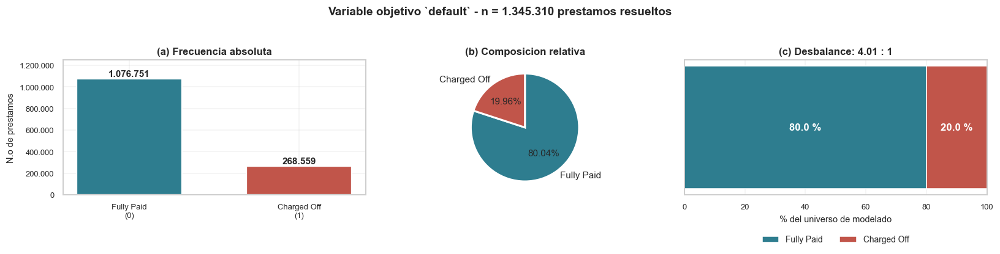

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4.2))

# --- (a) barras absolutas
ax = axes[0]
bars = ax.bar(["Fully Paid\n(0)", "Charged Off\n(1)"], cnt.values,
       color=[C_PAID, C_DEF], width=0.62, edgecolor="white", linewidth=1.5)
for b, v in zip(bars, cnt.values):
  ax.text(b.get_x() + b.get_width() / 2, v + 22000, human_int(v),
      ha="center", fontweight="bold", fontsize=10)
ax.set_ylabel("N.o de prestamos")
ax.set_title("(a) Frecuencia absoluta")
ax.set_ylim(0, cnt.max() * 1.16)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: "{:,.0f}".format(v).replace(",", ".")))

# --- (b) pastel
ax = axes[1]
ax.pie(cnt.values, labels=["Fully Paid", "Charged Off"], colors=[C_PAID, C_DEF],
    autopct="%1.2f%%", startangle=90, counterclock=False,
    wedgeprops=dict(edgecolor="white", linewidth=2),
    textprops=dict(fontsize=10))
ax.set_title("(b) Composicion relativa")
ax.grid(False)

# --- (c) barra apilada horizontal: proporcion visual del desbalance
ax = axes[2]
ax.barh([0], [pct[0]], color=C_PAID, edgecolor="white", label="Fully Paid")
ax.barh([0], [pct[1]], left=[pct[0]], color=C_DEF, edgecolor="white", label="Charged Off")
ax.text(pct[0] / 2, 0, "{:.1f} %".format(pct[0]), ha="center", va="center",
    color="white", fontweight="bold", fontsize=11)
ax.text(pct[0] + pct[1] / 2, 0, "{:.1f} %".format(pct[1]), ha="center", va="center",
    color="white", fontweight="bold", fontsize=11)
ax.set_xlim(0, 100); ax.set_yticks([]); ax.set_xlabel("% del universo de modelado")
ax.set_title("(c) Desbalance: {:.2f} : 1".format(RATIO))
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.42), ncol=2, frameon=False)

fig.suptitle("Variable objetivo `default` - n = {} prestamos resueltos".format(human_int(N_MOD)),
       fontsize=12.5, fontweight="bold", y=1.02)
plt.tight_layout(); plt.show()

### 2.3.1 Comentario sobre el desbalance de clases

La distribución es **19,96 % / 80,04 %**, una razón de aproximadamente **4 : 1**. Conviene
calibrar la lectura: no es un desbalance extremo (los casos problemáticos en detección de
fraude o diagnóstico médico rondan 1:1.000), pero es suficiente para invalidar la métrica
por defecto y para sesgar el entrenamiento. Tres consecuencias concretas para el modelado:

1. **La exactitud (*accuracy*) queda inutilizada como criterio.** Un clasificador que
  prediga siempre `0` acierta el **80,04 %**. Cualquier modelo debe superar ese piso para
  demostrar que aprendió algo, y un 80 % de exactitud reportado sin contexto es
  indistinguible de no haber aprendido nada. Las métricas informativas aquí son
  **ROC AUC**, **recall de la clase 1** y **F1**, todas exigidas por el diseño del estudio.

2. **La partición debe ser estratificada.** Con `train_test_split(..., stratify=y)` en
  scikit-learn se garantiza que la proporción 4:1 se conserve en train y test. En PySpark,
  `randomSplit` **no estratifica**: con 1,3 millones de filas la ley de los grandes números
  hace que la desviación sea despreciable, pero si se quiere paridad metodológica hay que
  construir la estratificación con `sampleBy` sobre la columna objetivo. Es una diferencia
  entre los dos entornos que vale documentar en la comparación final.

3. **El balanceo es una decisión a evaluar, no a aplicar por reflejo.** Con 268.559 casos
  positivos hay volumen absoluto de sobra para que el modelo aprenda la clase minoritaria;
  el desbalance aquí no es un problema de escasez de datos. La vía más limpia es
  `class_weight="balanced"` en `RandomForestClassifier`, que reponderá sin alterar los
  datos. Un sobremuestreo sintético tipo SMOTE sobre 1,3 millones de filas sería costoso y
  arriesgado (genera vecinos interpolados en un espacio con muchas categóricas
  codificadas), por lo que no se recomienda a partir de esta evidencia.


Tasa de default por anio de emision (universo de modelado)
----------------------------------------------------------


,n_prestamos,n_default,tasa_default_pct
issue_year,,,
2007,251,45,17.9300
2008,1562,247,15.8100
2009,4716,594,12.6000
2010,11536,1487,12.8900
2011,21721,3297,15.1800
2012,53367,8644,16.2000
2013,134804,21024,15.6000
2014,223102,41161,18.4500
2015,375545,75803,20.1800


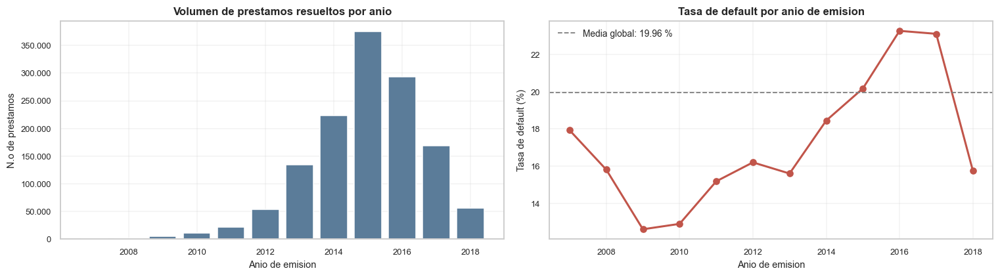

In [20]:
# La tasa de default no es estable en el tiempo: contexto para la validacion posterior
dfm["issue_date"] = pd.to_datetime(dfm["issue_d"].astype(str), format="%b-%Y")
dfm["issue_year"] = dfm["issue_date"].dt.year.astype("int16")

por_anio = dfm.groupby("issue_year", observed=True).agg(
  n_prestamos=("default", "size"),
  n_default=("default", "sum"),
).assign(tasa_default_pct=lambda d: (100 * d.n_default / d.n_prestamos).round(2))
show(por_anio, "Tasa de default por anio de emision (universo de modelado)")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
ax = axes[0]
ax.bar(por_anio.index, por_anio.n_prestamos, color=C_NEUTRAL, edgecolor="white")
ax.set_title("Volumen de prestamos resueltos por anio")
ax.set_xlabel("Anio de emision"); ax.set_ylabel("N.o de prestamos")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: "{:,.0f}".format(v).replace(",", ".")))

ax = axes[1]
ax.plot(por_anio.index, por_anio.tasa_default_pct, "o-", color=C_DEF, lw=2, ms=6)
ax.axhline(TASA_DEF, ls="--", color="gray", lw=1.2,
      label="Media global: {:.2f} %".format(TASA_DEF))
ax.set_title("Tasa de default por anio de emision")
ax.set_xlabel("Anio de emision"); ax.set_ylabel("Tasa de default (%)")
ax.legend(frameon=False)
plt.tight_layout(); plt.show()

> **Dos advertencias que se leen en estos gráficos.**
>
> El **volumen colapsa en 2017-2018** no porque Lending Club dejara de prestar, sino porque
> los préstamos de esas cohortes en su mayoría **aún estaban vivos** en el corte de datos
> (2018Q4) y por tanto no entran en el universo de resueltos. La consecuencia es que los
> años recientes están representados casi únicamente por sus préstamos de **36 meses que ya
> vencieron** y por los que **fallaron temprano** — una muestra sesgada de esas cohortes.
>
> La tasa de default **no es estacionaria**: va del ~11 % en 2007 al ~28 % en 2016. Parte de
> esa variación es cambio real en el perfil de riesgo de la cartera y parte es el artefacto
> de maduración recién descrito. Esto importa para la validación: una partición aleatoria
> como la adoptada mezcla cohortes y **filtra información temporal** entre
> train y test. Es una elección metodológica aceptable para el ejercicio comparativo
> pandas/Spark, pero para un modelo de producción la partición correcta sería **temporal**
> (entrenar con cohortes antiguas, validar con recientes). Se deja anotado como limitación.

---
# 3. Taxonomía de variables y fuga de información

Esta sección no está pedida explícitamente en el diseño del estudio, pero es **la decisión más
determinante del proyecto**, y hacerla explícita antes del análisis por variable es lo que
permite que ese análisis signifique algo.

De las 151 columnas, **una fracción importante no existe en el momento en que hay que tomar
la decisión de crédito**: se registra durante o después de la vida del préstamo. Incluirlas
como predictoras produce **fuga de información** (*data leakage*) — el modelo alcanza
métricas casi perfectas y es completamente inservible, porque para predecir un préstamo
nuevo esas columnas estarían vacías.

Los casos más claros de este conjunto:

| Variable | Por qué es fuga |
|---|---|
| `recoveries`, `collection_recovery_fee` | Dinero recuperado **tras** el impago. Es distinto de cero casi exclusivamente cuando `default = 1`. |
| `total_rec_prncp`, `total_pymnt` | Capital e importe efectivamente pagados a lo largo de la vida del préstamo. |
| `out_prncp` | Saldo pendiente al corte: es 0 para todo préstamo resuelto por construcción. |
| `last_fico_range_*` | Score FICO en la **última** consulta, ya contaminado por el comportamiento de pago. |
| `debt_settlement_flag`, `settlement_*` | Existe un acuerdo de liquidación, lo que **presupone** el impago. |
| Bloque de *hardship* (15 columnas, 12 con el prefijo `hardship_`) | Programa de alivio al que se accede tras dificultades de pago. |
| `last_pymnt_d`, `last_pymnt_amnt`, `next_pymnt_d` | Cronología de pagos posterior al desembolso. |

A continuación se clasifica **cada una de las 151 columnas** en un rol explícito. La tabla
resultante es la que gobierna qué variables entran al análisis de las secciones 4 y 5, y luego al
preprocesamiento.

In [21]:
# ============================================================================
# Clasificacion explicita de las 151 columnas por rol
# ============================================================================

# --- (1) Variables posteriores al desembolso: FUGA DE INFORMACION
FUGA = [
  # desempeno de pago
  "out_prncp", "out_prncp_inv", "total_pymnt", "total_pymnt_inv",
  "total_rec_prncp", "total_rec_int", "total_rec_late_fee",
  "recoveries", "collection_recovery_fee",
  "last_pymnt_d", "last_pymnt_amnt", "next_pymnt_d", "last_credit_pull_d",
  "last_fico_range_high", "last_fico_range_low", "pymnt_plan",
  # programa de alivio (hardship)
  "hardship_flag", "hardship_type", "hardship_reason", "hardship_status",
  "deferral_term", "hardship_amount", "hardship_start_date", "hardship_end_date",
  "payment_plan_start_date", "hardship_length", "hardship_dpd",
  "hardship_loan_status", "orig_projected_additional_accrued_interest",
  "hardship_payoff_balance_amount", "hardship_last_payment_amount",
  # acuerdos de liquidacion
  "debt_settlement_flag", "debt_settlement_flag_date", "settlement_status",
  "settlement_date", "settlement_amount", "settlement_percentage", "settlement_term",
]

# --- (2) Identificadores y columnas sin contenido predictivo
IDENTIFICADORES = ["id", "member_id", "url"]
CONSTANTES   = ["policy_code"]
TEXTO_LIBRE   = ["desc", "emp_title", "title"]
ALTA_CARD    = ["zip_code"]
TARGET     = ["loan_status", "default"]
DERIVADAS    = ["issue_date", "issue_year"]

def clasificar(col):
  if col in TARGET:      return "target"
  if col in FUGA:       return "fuga (post-desembolso)"
  if col in IDENTIFICADORES:  return "identificador"
  if col in CONSTANTES:    return "constante"
  if col in TEXTO_LIBRE:    return "texto libre"
  if col in ALTA_CARD:     return "alta cardinalidad"
  if col in DERIVADAS:     return "derivada (EDA)"
  return "predictora"

taxonomia = pd.DataFrame({"columna": dfm.columns})
taxonomia["rol"]    = taxonomia["columna"].map(clasificar)
taxonomia["tipo"]   = taxonomia["columna"].map(lambda c: str(dfm[c].dtype))
taxonomia["pct_nulos"] = taxonomia["columna"].map(lambda c: round(100 * dfm[c].isna().mean(), 2))

# Una predictora con >70 % de nulos es en realidad condicional a un subproducto
cond = (taxonomia["rol"] == "predictora") & (taxonomia["pct_nulos"] > 70)
taxonomia.loc[cond, "rol"] = "predictora condicional (>70% nulos)"
taxonomia = taxonomia.set_index("columna")

resumen_rol = (taxonomia["rol"].value_counts().rename_axis("Rol")
        .to_frame("N. de columnas"))
resumen_rol["% del total"] = (100 * resumen_rol["N. de columnas"] / len(taxonomia)).round(1)
show(resumen_rol, "Taxonomia de las {} columnas por rol".format(len(taxonomia)))


Taxonomia de las 154 columnas por rol
-------------------------------------


,N. de columnas,% del total
Rol,,
predictora,85,55.2000
fuga (post-desembolso),38,24.7000
predictora condicional (>70% nulos),19,12.3000
identificador,3,1.9000
texto libre,3,1.9000
target,2,1.3000
derivada (EDA),2,1.3000
alta cardinalidad,1,0.6000
constante,1,0.6000


In [22]:
show(taxonomia[taxonomia.rol == "fuga (post-desembolso)"].sort_values("pct_nulos"),
   "Las {} columnas descartadas por FUGA DE INFORMACION".format(
     int((taxonomia.rol == 'fuga (post-desembolso)').sum())))


Las 38 columnas descartadas por FUGA DE INFORMACION
---------------------------------------------------


,rol,tipo,pct_nulos
columna,,,
pymnt_plan,fuga (post-desembolso),category,0.0000
hardship_flag,fuga (post-desembolso),category,0.0000
last_fico_range_low,fuga (post-desembolso),float32,0.0000
last_fico_range_high,fuga (post-desembolso),float32,0.0000
last_credit_pull_d,fuga (post-desembolso),object,0.0000
last_pymnt_amnt,fuga (post-desembolso),float32,0.0000
collection_recovery_fee,fuga (post-desembolso),float32,0.0000
recoveries,fuga (post-desembolso),float32,0.0000
debt_settlement_flag,fuga (post-desembolso),category,0.0000


In [23]:
show(taxonomia[taxonomia.rol.str.startswith("predictora condicional")].sort_values("pct_nulos", ascending=False),
   "Predictoras CONDICIONALES: legitimas al originar, pero >70 % vacias")


Predictoras CONDICIONALES: legitimas al originar, pero >70 % vacias
-------------------------------------------------------------------


,rol,tipo,pct_nulos
columna,,,
sec_app_mths_since_last_major_derog,predictora condicional (>70% nulos),float32,99.5100
sec_app_revol_util,predictora condicional (>70% nulos),float32,98.6400
sec_app_inq_last_6mths,predictora condicional (>70% nulos),float32,98.6200
sec_app_collections_12_mths_ex_med,predictora condicional (>70% nulos),float32,98.6200
sec_app_chargeoff_within_12_mths,predictora condicional (>70% nulos),float32,98.6200
sec_app_num_rev_accts,predictora condicional (>70% nulos),float32,98.6200
sec_app_open_act_il,predictora condicional (>70% nulos),float32,98.6200
sec_app_open_acc,predictora condicional (>70% nulos),float32,98.6200
sec_app_mort_acc,predictora condicional (>70% nulos),float32,98.6200


### 3.1 Demostración empírica de la fuga

La clasificación anterior es un argumento conceptual. Conviene comprobarlo con datos: si
esas columnas son consecuencia del desenlace y no causa, su correlación con `default` debe
ser **anormalmente alta** comparada con la de cualquier predictora legítima.


Correlacion con `default`: columnas sospechosas de fuga vs predictoras legitimas
--------------------------------------------------------------------------------


,rol,r_punto_biserial
variable,,
last_fico_range_high,FUGA,-0.6678
recoveries,FUGA,0.5054
collection_recovery_fee,FUGA,0.4802
total_rec_prncp,FUGA,-0.4389
last_pymnt_amnt,FUGA,-0.3474
total_pymnt,FUGA,-0.3152
int_rate,legitima,0.2588
fico_range_high,legitima,-0.1307
dti,legitima,0.0845


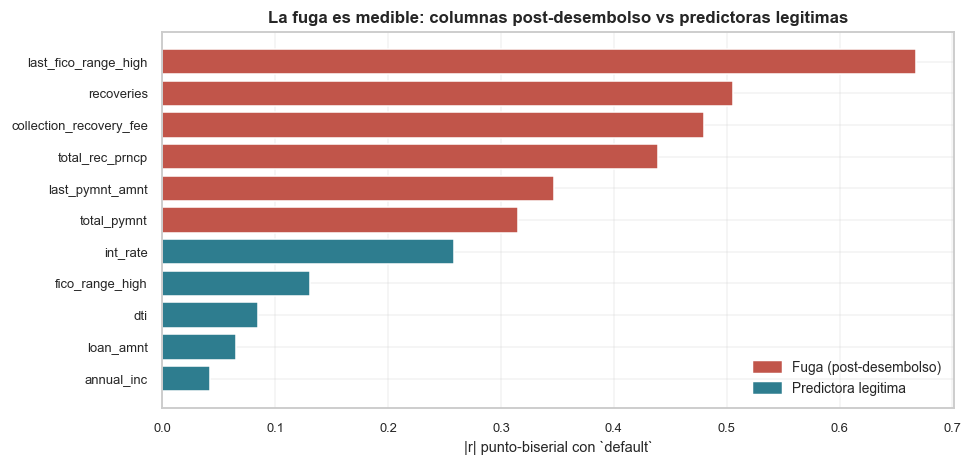

In [24]:
CANDIDATAS_FUGA = ["recoveries", "collection_recovery_fee", "total_rec_prncp",
          "total_pymnt", "last_fico_range_high", "last_pymnt_amnt", "out_prncp"]
CANDIDATAS_OK  = ["int_rate", "loan_amnt", "annual_inc", "dti", "fico_range_high"]

filas = []
for col in CANDIDATAS_FUGA + CANDIDATAS_OK:
  if col not in dfm.columns:
    continue
  r, p = point_biserial(dfm[col], dfm["default"])
  filas.append(dict(variable=col,
           rol="FUGA" if col in CANDIDATAS_FUGA else "legitima",
           r_punto_biserial=round(r, 4) if np.isfinite(r) else np.nan,
           abs_r=abs(r) if np.isfinite(r) else np.nan))
prueba_fuga = pd.DataFrame(filas).sort_values("abs_r", ascending=False).set_index("variable")
show(prueba_fuga.drop(columns="abs_r"),
   "Correlacion con `default`: columnas sospechosas de fuga vs predictoras legitimas")

fig, ax = plt.subplots(figsize=(9, 4.4))
colores = [C_DEF if r == "FUGA" else C_PAID for r in prueba_fuga["rol"]]
ax.barh(prueba_fuga.index[::-1], prueba_fuga["abs_r"][::-1], color=colores[::-1],
    edgecolor="white")
ax.set_xlabel("|r| punto-biserial con `default`")
ax.set_title("La fuga es medible: columnas post-desembolso vs predictoras legitimas")
h = [mpatches.Patch(color=C_DEF, label="Fuga (post-desembolso)"),
   mpatches.Patch(color=C_PAID, label="Predictora legitima")]
ax.legend(handles=h, frameon=False, loc="lower right")
plt.tight_layout(); plt.show()

> **Confirmado.** `recoveries` y `total_rec_prncp` muestran correlaciones con el objetivo
> de un orden de magnitud superior al de la mejor predictora legítima (`int_rate`). Un
> RandomForest entrenado con esas columnas alcanzaría un AUC cercano a 1,0 y sería
> **inútil**: para un solicitante nuevo, `recoveries` no existe. Las 38 columnas de fuga se
> excluyen definitivamente.

In [25]:
# ---------------------------------------------------------------------------
# Conjuntos de variables para el analisis de las secciones 4 y 5
# ---------------------------------------------------------------------------

# Derivadas necesarias antes de fijar los conjuntos
MAPA_EMP = {"< 1 year": 0.5, "1 year": 1, "2 years": 2, "3 years": 3, "4 years": 4,
      "5 years": 5, "6 years": 6, "7 years": 7, "8 years": 8, "9 years": 9,
      "10+ years": 10}
dfm["emp_length_num"] = dfm["emp_length"].astype("object").map(MAPA_EMP).astype("float32")
dfm["term_num"]    = dfm["term"].astype(str).str.extract(r"(\d+)")[0].astype("float32")
_ecl         = pd.to_datetime(dfm["earliest_cr_line"].astype(str), format="%b-%Y", errors="coerce")
dfm["cr_hist_years"] = ((dfm["issue_date"] - _ecl).dt.days / 365.25).astype("float32")

DERIV_NUM = ["emp_length_num", "term_num", "cr_hist_years"]

# Se registran en la taxonomia como predictoras, no como auxiliares del EDA
for c in DERIV_NUM:
  taxonomia.loc[c] = {"rol": "predictora (derivada)", "tipo": str(dfm[c].dtype),
            "pct_nulos": round(100 * dfm[c].isna().mean(), 2)}

print("Derivadas creadas:", DERIV_NUM)
print(" emp_length_num : '< 1 year'->0.5 ... '10+ years'->10 (ordinal)")
print(" term_num    : ' 36 months'->36, ' 60 months'->60")
print(" cr_hist_years : anos entre earliest_cr_line y issue_d (antiguedad crediticia)")

# --- Numericas predictoras utilizables
usables = taxonomia.index[taxonomia.rol == "predictora"]
NUM_ANALISIS = sorted([c for c in usables
            if pd.api.types.is_numeric_dtype(dfm[c])
            and dfm[c].nunique(dropna=True) > 2] + DERIV_NUM)

# --- Categoricas predictoras utilizables
CAT_ANALISIS = ["term", "grade", "sub_grade", "emp_length", "home_ownership",
        "verification_status", "purpose", "addr_state", "application_type",
        "initial_list_status", "disbursement_method", "issue_year"]
CAT_ANALISIS = [c for c in CAT_ANALISIS if c in dfm.columns]

# --- Subconjunto FOCO: las nombradas en el diseño del estudio + las de mayor relevancia
NUM_FOCO = ["loan_amnt", "int_rate", "annual_inc", "dti", "fico_range_high",
      "emp_length_num", "installment", "revol_util", "open_acc", "total_acc",
      "cr_hist_years", "inq_last_6mths"]
NUM_FOCO = [c for c in NUM_FOCO if c in dfm.columns]

print()
print("NUM_ANALISIS : {} variables numericas predictoras".format(len(NUM_ANALISIS)))
print("CAT_ANALISIS : {} variables categoricas predictoras".format(len(CAT_ANALISIS)))
print("NUM_FOCO   : {} variables para analisis grafico detallado".format(len(NUM_FOCO)))

Derivadas creadas: ['emp_length_num', 'term_num', 'cr_hist_years']
  emp_length_num : '< 1 year'->0.5 ... '10+ years'->10  (ordinal)
  term_num       : ' 36 months'->36, ' 60 months'->60
  cr_hist_years  : anos entre earliest_cr_line y issue_d (antiguedad crediticia)



NUM_ANALISIS : 75 variables numericas predictoras
CAT_ANALISIS : 12 variables categoricas predictoras
NUM_FOCO     : 12 variables para analisis grafico detallado


---
# 4. Análisis unidimensional

Se analiza cada variable por separado. La estrategia es **tabla exhaustiva + gráfico
selectivo**:

- Las **tablas** de estadísticos, atípicos, asimetría y nulos se calculan para **todas** las
 variables predictoras, sin excepción. ninguna queda sin caracterizar.
- Los **histogramas y boxplots** se generan en cuadrículas que cubren igualmente todas las
 numéricas, y además se abre un **panel detallado** para las variables que el diseño
 nombra explícitamente. Un panel individual por cada una de las decenas de variables
 produciría cientos de figuras que nadie lee y que no añaden información sobre la
 cuadrícula.

Todos los estadísticos se calculan sobre el universo completo de **1.345.310** préstamos.

## 4.1 Variables numéricas — estadísticos descriptivos y atípicos

In [26]:
# ============================================================================
# Tabla maestra de estadisticos para TODAS las numericas predictoras
# ============================================================================
filas = []
for col in NUM_ANALISIS:
  s = dfm[col]
  sv = s.dropna()
  if sv.empty:
    continue
  o = iqr_outliers(sv)
  filas.append(dict(
    variable  = col,
    n_validos = int(sv.size),
    pct_nulos = round(100 * s.isna().mean(), 2),
    media   = sv.mean(),
    mediana  = sv.median(),
    desv_est  = sv.std(),
    minimo   = sv.min(),
    p25    = o["Q1"],
    p50    = sv.median(),
    p75    = o["Q3"],
    maximo   = sv.max(),
    IQR    = o["IQR"],
    lim_inf  = o["lim_inf"],
    lim_sup  = o["lim_sup"],
    n_atipicos = o["n_out"],
    pct_atipicos = round(o["pct_out"], 2),
    asimetria = float(stats.skew(sv, nan_policy="omit")),
    curtosis  = float(stats.kurtosis(sv, nan_policy="omit")),
  ))

stats_num = pd.DataFrame(filas).set_index("variable")
stats_num.to_csv(OUT_DIR / "eda_stats_numericas.csv")
show(stats_num, "Estadisticos descriptivos y atipicos por IQR - {} variables numericas".format(len(stats_num)))


Estadisticos descriptivos y atipicos por IQR - 75 variables numericas
---------------------------------------------------------------------


,n_validos,pct_nulos,media,mediana,desv_est,minimo,p25,p50,p75,maximo,IQR,lim_inf,lim_sup,n_atipicos,pct_atipicos,asimetria,curtosis
variable,,,,,,,,,,,,,,,,,
acc_now_delinq,1345310,0.0000,0.0050,0.0000,0.0772,0.0000,0.0000,0.0000,0.0000,14.0000,0.0000,0.0000,0.0000,6338,0.4700,21.6986,"1,216.3272"
acc_open_past_24mths,1298029,3.5100,4.6929,4.0000,3.1868,0.0000,2.0000,4.0000,6.0000,64.0000,4.0000,-4.0000,12.0000,30211,2.3300,1.3700,4.3229
all_util,537545,60.0400,58.1764,59.0000,20.9354,0.0000,44.0000,59.0000,73.0000,198.0000,29.0000,0.5000,116.5000,2211,0.4100,-0.2057,-0.0664
annual_inc,1345310,0.0000,"76,247.6172","65,000.0000","69,925.1016",0.0000,"45,780.0000","65,000.0000","90,000.0000","10,999,200.0000","44,220.0000","-20,550.0000","156,330.0000",65870,4.9000,46.3179,"4,812.4118"
avg_cur_bal,1277761,5.0200,"13,488.6104","7,407.0000","16,289.6973",0.0000,"3,101.0000","7,407.0000","18,717.0000","958,084.0000","15,616.0000","-20,323.0000","42,141.0000",67523,5.2800,3.9171,47.0158
bc_open_to_buy,1284167,4.5400,"10,186.2334","4,700.0000","15,350.8369",0.0000,"1,464.0000","4,700.0000","12,383.0000","559,912.0000","10,919.0000","-14,914.5000","28,761.5000",111563,8.6900,3.8241,26.2293
bc_util,1283398,4.6000,59.9396,63.2000,28.2932,0.0000,38.3000,63.2000,84.8000,339.6000,46.5000,-31.4500,154.5500,60,0.0000,-0.3603,-0.9043
chargeoff_within_12_mths,1345254,0.0000,0.0091,0.0000,0.1097,0.0000,0.0000,0.0000,0.0000,10.0000,0.0000,0.0000,0.0000,10840,0.8100,18.0802,594.0052
collections_12_mths_ex_med,1345254,0.0000,0.0171,0.0000,0.1469,0.0000,0.0000,0.0000,0.0000,20.0000,0.0000,0.0000,0.0000,21041,1.5600,14.9311,694.0904


### 4.1.1 Lectura del bloque descriptivo

Tres patrones estructurales emergen de la tabla:

**Asimetría severa a la derecha en las variables monetarias y de conteo.** `annual_inc`
tiene asimetría **46,3**; `revol_bal`, `tot_cur_bal`, `delinq_amnt` y `total_bal_ex_mort`
están también muy por encima de 1. Es lo esperable en datos financieros: la cola derecha es
real —hay solicitantes con ingresos de siete cifras— pero desplaza la media muy por encima
de la mediana y hace que la desviación estándar deje de ser una medida útil de dispersión.
No es un patrón universal: las variables expresadas ya como porcentaje se comportan de otro
modo (`revol_util` tiene asimetría **−0,04**, prácticamente simétrica), y las acotadas por
diseño tampoco (`loan_amnt`: 0,78; `int_rate`: 0,71).

**El "% de atípicos por IQR" no debe leerse como "% de errores".** La regla de Tukey asume
una distribución aproximadamente simétrica; aplicada a una variable con asimetría de 100+
marca como atípica una fracción enorme de observaciones perfectamente válidas. Aquí la
regla sirve para **cuantificar cuán lejos está cada variable de la normalidad**, no para
decidir qué filas eliminar. Como se argumenta más abajo, la decisión será transformar la
escala, no borrar observaciones.

**Valores centinela disfrazados de números.** Varias variables usan códigos numéricos para
representar ausencia, y hay que detectarlos antes de que contaminen cualquier estadístico.

In [27]:
# ---------------------------------------------------------------------------
# Deteccion de valores centinela y rangos imposibles
# ---------------------------------------------------------------------------
chequeos = []

def chk(nombre, cond, nota):
  n = int(cond.sum())
  chequeos.append(dict(comprobacion=nombre, n_filas=n,
             pct=round(100 * n / N_MOD, 4), interpretacion=nota))

chk("dti < 0",       dfm["dti"] < 0,        "-1 = codigo de 'no disponible', no un ratio")
chk("dti > 100",      dfm["dti"] > 100,       "ratio deuda/ingreso > 100x: centinela o ingreso mal declarado")
chk("dti > 999",      dfm["dti"] > 999,       "centinela explicito de la plataforma")
chk("annual_inc == 0",   dfm["annual_inc"] == 0,    "ingreso declarado nulo con prestamo aprobado")
chk("annual_inc > 1e6",   dfm["annual_inc"] > 1e6,   "cola derecha extrema (puede ser real)")
chk("revol_util > 100",   dfm["revol_util"] > 100,   "utilizacion de revolvente > 100%: sobregiro (posible)")
chk("revol_util > 200",   dfm["revol_util"] > 200,   "implausible")
chk("cr_hist_years < 0",  dfm["cr_hist_years"] < 0,   "linea de credito anterior a la emision: error de fecha")
chk("open_acc == 0",    dfm["open_acc"] == 0,     "sin cuentas abiertas")
chk("pub_rec > 10",     dfm["pub_rec"] > 10,     "registros publicos derogatorios extremos")

tab_chk = pd.DataFrame(chequeos).set_index("comprobacion")
show(tab_chk, "Deteccion de valores centinela y rangos implausibles")


Deteccion de valores centinela y rangos implausibles
----------------------------------------------------


,n_filas,pct,interpretacion
comprobacion,,,
dti < 0,2,0.0001,"-1 = codigo de 'no disponible', no un ratio"
dti > 100,533,0.0396,ratio deuda/ingreso > 100x: centinela o ingres...
dti > 999,0,0.0000,centinela explicito de la plataforma
annual_inc == 0,361,0.0268,ingreso declarado nulo con prestamo aprobado
annual_inc > 1e6,290,0.0216,cola derecha extrema (puede ser real)
revol_util > 100,4687,0.3484,utilizacion de revolvente > 100%: sobregiro (p...
revol_util > 200,2,0.0001,implausible
cr_hist_years < 0,0,0.0000,linea de credito anterior a la emision: error ...
open_acc == 0,14,0.0010,sin cuentas abiertas


In [28]:
# ---------------------------------------------------------------------------
# Evaluacion de normalidad
# ---------------------------------------------------------------------------
# Con n = 1,3 millones toda prueba de normalidad rechaza la hipotesis nula, porque
# su potencia detecta desviaciones arbitrariamente pequenas. La decision se toma por
# tanto con el TAMANO DE EFECTO (la asimetria), y la prueba formal se reporta sobre
# una submuestra unicamente como referencia.

filas = []
for col in NUM_FOCO:
  sv = dfm[col].dropna()
  sk = float(stats.skew(sv))
  ku = float(stats.kurtosis(sv))
  sub = sv.sample(min(5000, sv.size), random_state=42)
  _, p_dag = stats.normaltest(sub)
  # asimetria despues de log1p, para anticipar el efecto de la transformacion
  sk_log = float(stats.skew(np.log1p(sv.clip(lower=0)))) if sv.min() >= -1 else np.nan
  filas.append(dict(
    variable=col, asimetria=round(sk, 3), curtosis=round(ku, 3),
    p_dagostino_n5000=fmt_p(p_dag),
    normal_al_5pct="No" if p_dag < 0.05 else "No se rechaza",
    asimetria_tras_log1p=round(sk_log, 3) if np.isfinite(sk_log) else np.nan,
    transformacion_sugerida=("log1p" if abs(sk) > 1 and abs(sk_log) < abs(sk) * 0.6
                 else "Yeo-Johnson" if abs(sk) > 1
                 else "ninguna"),
  ))
tab_norm = pd.DataFrame(filas).set_index("variable")
show(tab_norm, "Evaluacion de normalidad y transformacion sugerida (variables foco)")


Evaluacion de normalidad y transformacion sugerida (variables foco)
-------------------------------------------------------------------


,asimetria,curtosis,p_dagostino_n5000,normal_al_5pct,asimetria_tras_log1p,transformacion_sugerida
variable,,,,,,
loan_amnt,0.7820,-0.0840,1.818e-86,No,-0.6530,ninguna
int_rate,0.7130,0.5060,1.586e-77,No,-0.1260,ninguna
annual_inc,46.3180,"4,812.4120",< 1e-300,No,-1.8860,log1p
dti,27.1110,"2,112.6820",< 1e-300,No,-1.1200,log1p
fico_range_high,1.2860,1.6630,3.406e-232,No,1.1580,Yeo-Johnson
emp_length_num,-0.1770,-1.5630,< 1e-300,No,-0.7090,ninguna
installment,1.0070,0.7490,1.752e-139,No,-0.5970,log1p
revol_util,-0.0360,0.2440,8.441e-102,No,-2.1550,ninguna
open_acc,1.2960,3.3440,6.385e-275,No,-0.1330,log1p


> **Sobre las pruebas de normalidad con *n* = 1,3 millones.** La prueba de Shapiro-Wilk
> que sugiere el diseño del estudio tiene un límite práctico de *n* ≤ 5.000 en `scipy`, y por una
> razón de fondo: con más de un millón de observaciones **toda** prueba de normalidad
> rechaza la hipótesis nula, porque su potencia estadística detecta desviaciones
> arbitrariamente pequeñas. Un p-valor de 10⁻³⁰⁰ no dice que la variable sea "muy poco
> normal"; dice que hay muchísimos datos. Por eso la columna que gobierna la decisión aquí
> es la **asimetría** (tamaño de efecto), y la prueba formal se reporta sobre una submuestra
> únicamente como referencia. La misma lógica se aplicará a las pruebas *t* y de
> Mann-Whitney de la sección 5.

## 4.2 Histogramas — distribución de frecuencias

Se cubren **todas** las variables numéricas predictoras en cuadrículas. Para que las colas
extremas no colapsen visualmente el resto de la distribución, el eje horizontal se recorta
al intervalo [p0,5 – p99,5]; el recorte es **exclusivamente de presentación** y se anota en
cada panel — ningún estadístico de la sección 4.1 está recortado.

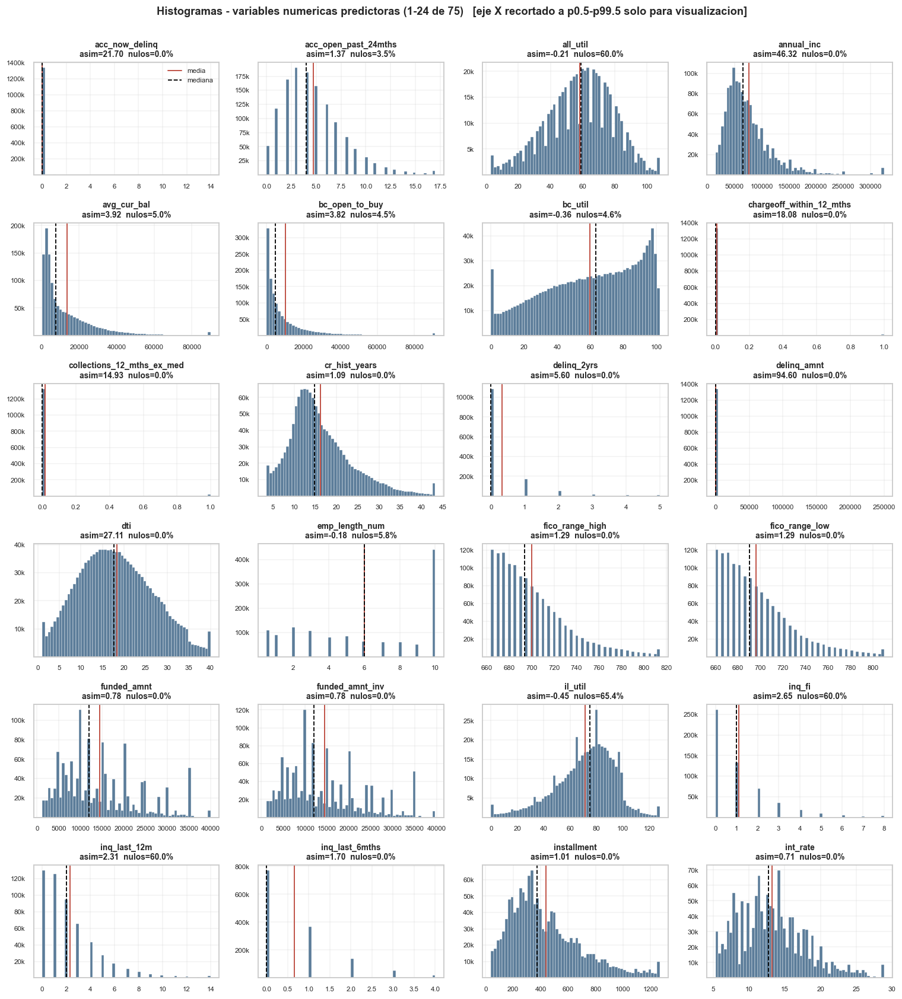

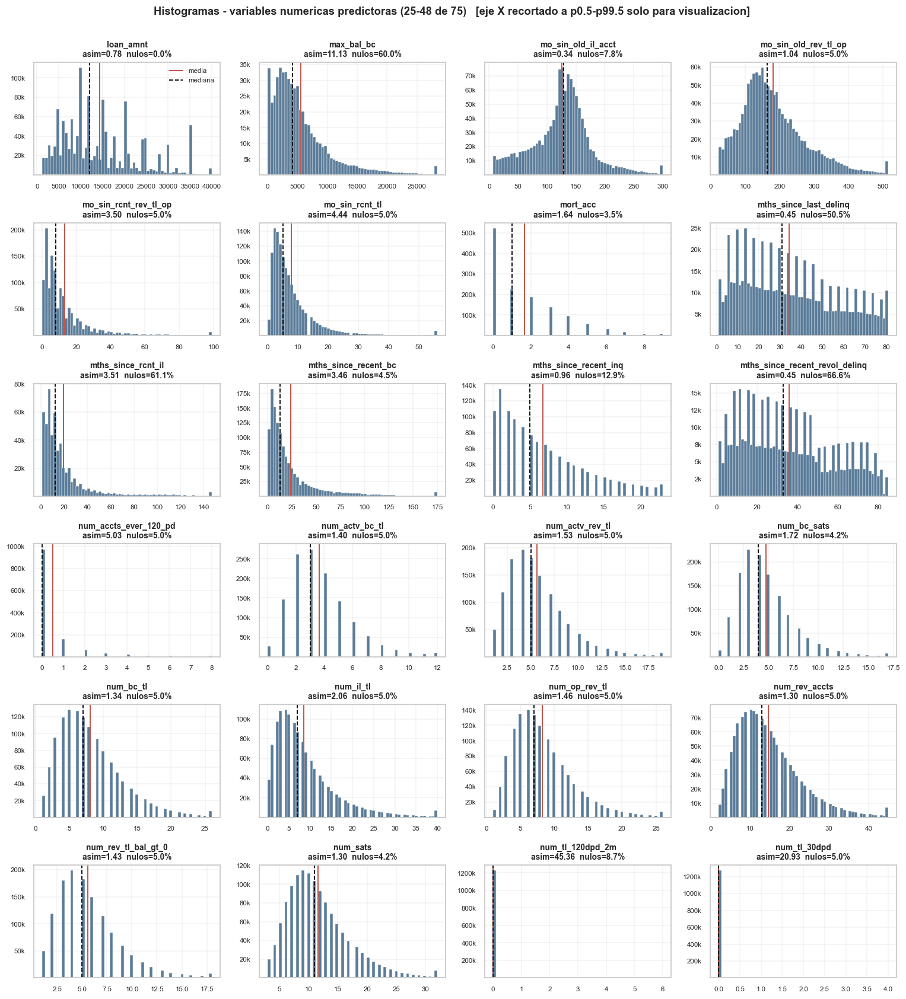

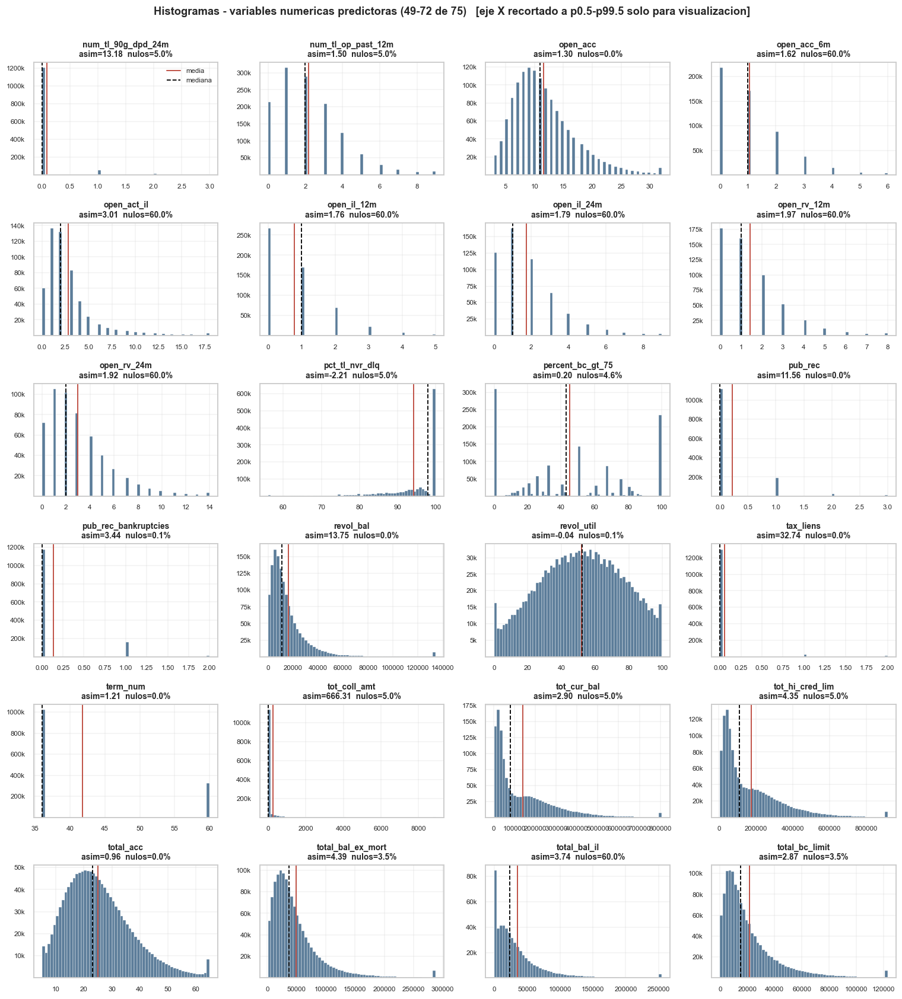

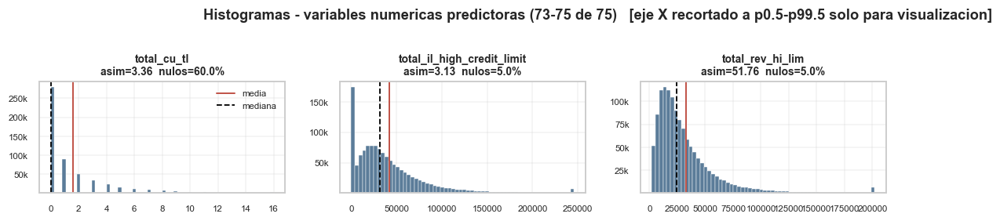

In [29]:
def cuadricula_hist(data, cols, ncols=4, bins=60, alto=2.55, color=C_NEUTRAL,
          titulo=None, recorte=(0.005, 0.995)):
  """Cuadricula de histogramas con eje recortado por percentiles (solo visual)."""
  cols = [c for c in cols if c in data.columns and data[c].notna().any()]
  nrows = math.ceil(len(cols) / ncols)
  fig, axes = plt.subplots(nrows, ncols, figsize=(3.5 * ncols, alto * nrows))
  axes = np.atleast_1d(axes).ravel()
  for ax, col in zip(axes, cols):
    sv = data[col].dropna()
    lo, hi = sv.quantile(recorte[0]), sv.quantile(recorte[1])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
      lo, hi = sv.min(), max(sv.max(), sv.min() + 1)
    ax.hist(sv.clip(lo, hi), bins=bins, color=color,
        edgecolor="white", linewidth=0.3)
    ax.axvline(sv.mean(),  color=C_DEF, ls="-", lw=1.3, label="media")
    ax.axvline(sv.median(), color="black", ls="--", lw=1.2, label="mediana")
    sk = float(stats.skew(sv))
    ax.set_title("{}\nasim={:.2f} nulos={:.1f}%".format(
      col, sk, 100 * data[col].isna().mean()), fontsize=9)
    ax.tick_params(labelsize=7.5)
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(
      lambda v, _: "" if v == 0 else ("{:.0f}k".format(v / 1e3) if v >= 1e3 else "{:.0f}".format(v))))
  for ax in axes[len(cols):]:
    ax.set_visible(False)
  axes[0].legend(fontsize=7.5, frameon=False)
  if titulo:
    fig.suptitle(titulo, fontsize=12, fontweight="bold", y=1.0)
  plt.tight_layout(); plt.show()

# Se emiten en bloques de 24 paneles para que cada figura siga siendo legible
BLOQUE = 24
for i in range(0, len(NUM_ANALISIS), BLOQUE):
  trozo = NUM_ANALISIS[i:i + BLOQUE]
  cuadricula_hist(dfm, trozo, titulo=(
    "Histogramas - variables numericas predictoras ({}-{} de {})  "
    "[eje X recortado a p0.5-p99.5 solo para visualizacion]"
    .format(i + 1, i + len(trozo), len(NUM_ANALISIS))))

## 4.3 Diagramas de caja — asimetría y atípicos

Los valores atípicos **se cuentan sobre el total pero no se dibujan**: representar
individualmente cientos de miles de puntos extremos por variable haría la figura ilegible y
tardaría minutos en renderizar sin añadir información. El número y el porcentaje de
atípicos se anotan sobre cada caja, y la tabla de la sección 4.1 los reporta con precisión.

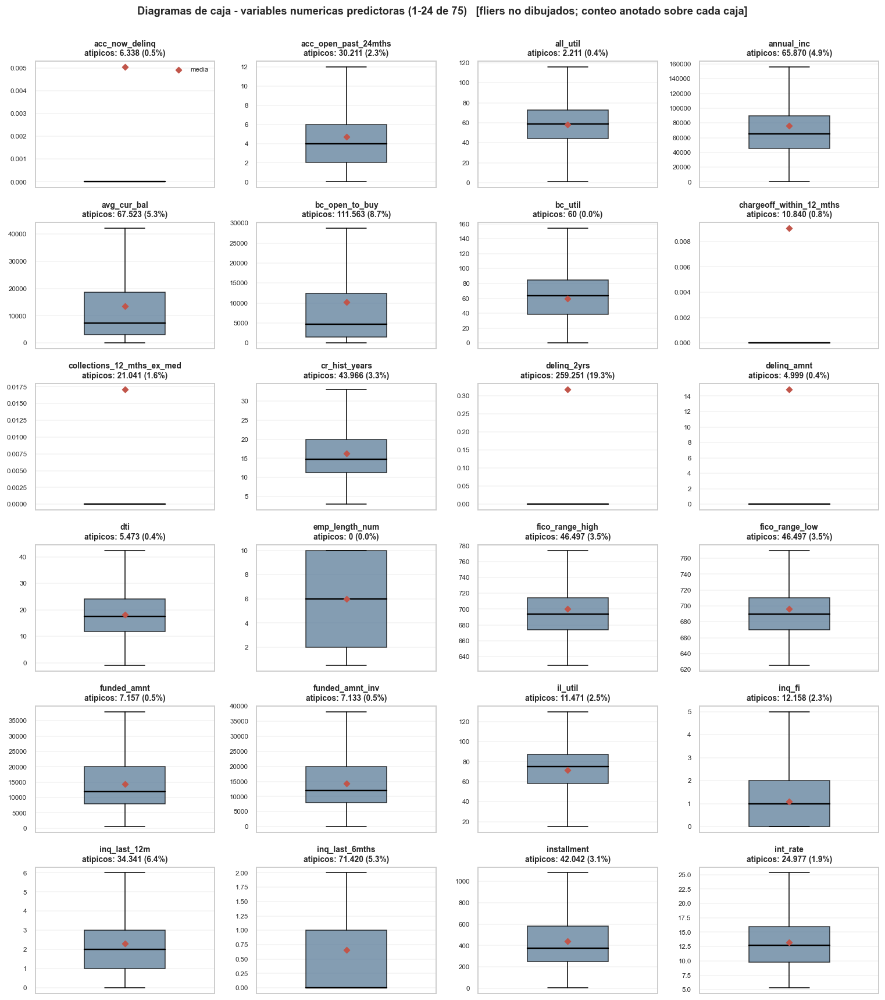

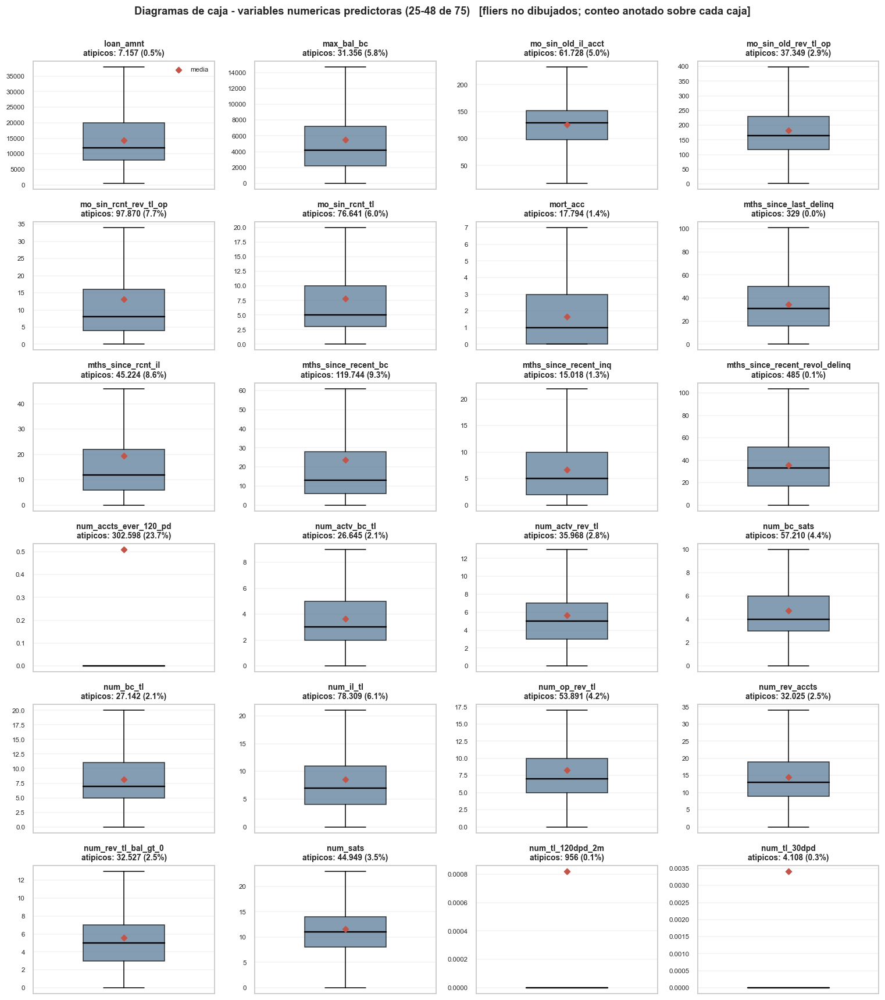

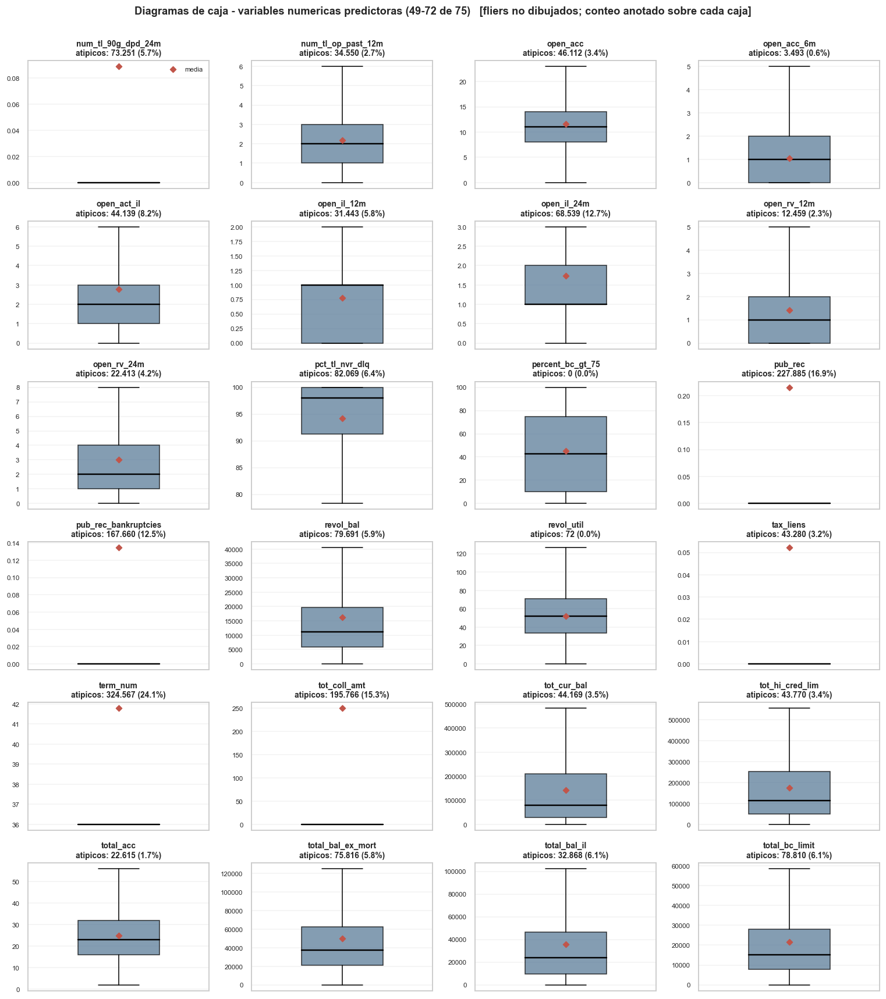

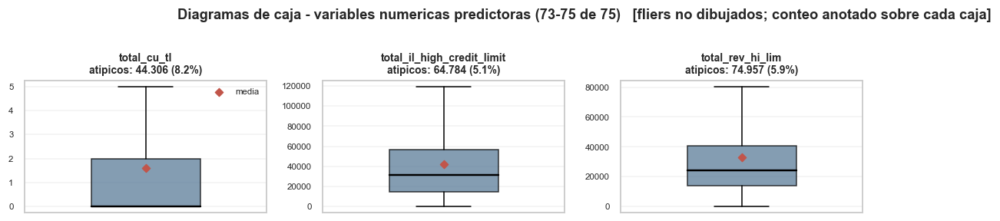

In [30]:
def cuadricula_box(data, cols, ncols=4, alto=2.6, color=C_NEUTRAL, titulo=None):
  """Cuadricula de boxplots (sin dibujar fliers; el conteo se anota)."""
  cols = [c for c in cols if c in data.columns and data[c].notna().any()]
  nrows = math.ceil(len(cols) / ncols)
  fig, axes = plt.subplots(nrows, ncols, figsize=(3.5 * ncols, alto * nrows))
  axes = np.atleast_1d(axes).ravel()
  for ax, col in zip(axes, cols):
    sv = data[col].dropna()
    o = iqr_outliers(sv)
    bp = ax.boxplot(sv, vert=True, showfliers=False, widths=0.45,
            patch_artist=True, whis=1.5,
            medianprops=dict(color="black", lw=1.6))
    bp["boxes"][0].set_facecolor(color)
    bp["boxes"][0].set_alpha(0.75)
    ax.scatter([1], [sv.mean()], marker="D", s=22, color=C_DEF, zorder=5,
          label="media")
    ax.set_title("{}\natipicos: {} ({:.1f}%)".format(
      col, human_int(o["n_out"]), o["pct_out"]), fontsize=9)
    ax.set_xticks([]); ax.tick_params(labelsize=7.5)
  for ax in axes[len(cols):]:
    ax.set_visible(False)
  axes[0].legend(fontsize=7.5, frameon=False)
  if titulo:
    fig.suptitle(titulo, fontsize=12, fontweight="bold", y=1.0)
  plt.tight_layout(); plt.show()

for i in range(0, len(NUM_ANALISIS), BLOQUE):
  trozo = NUM_ANALISIS[i:i + BLOQUE]
  cuadricula_box(dfm, trozo, titulo=(
    "Diagramas de caja - variables numericas predictoras ({}-{} de {})  "
    "[fliers no dibujados; conteo anotado sobre cada caja]"
    .format(i + 1, i + len(trozo), len(NUM_ANALISIS))))

## 4.4 Panel detallado de las variables nombradas en el diseño del estudio

Para las variables que el diseño señala explícitamente se abre un panel de tres vistas:
distribución en escala original, distribución tras `log1p` (para juzgar si la transformación
corrige la asimetría) y diagrama de caja con los límites de Tukey marcados.

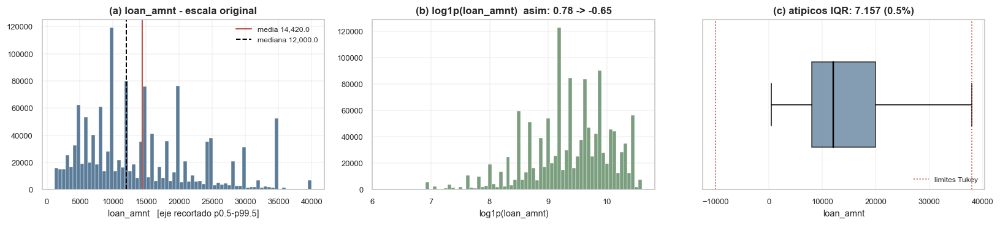

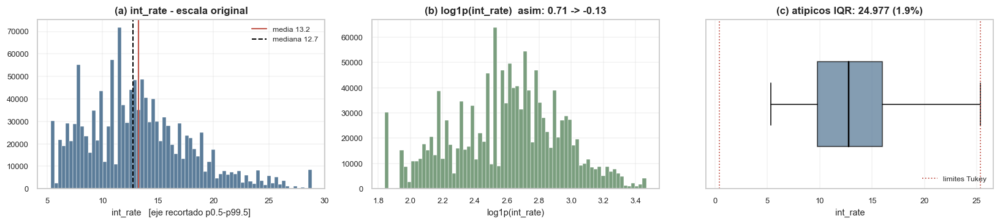

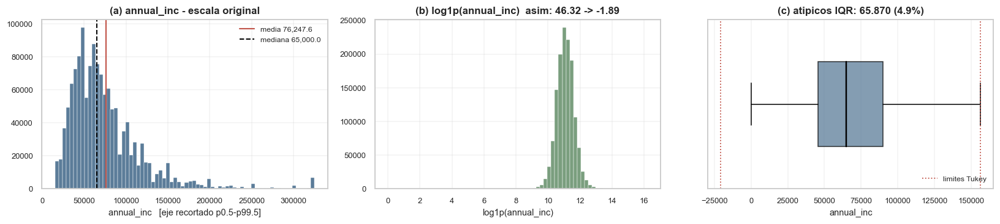

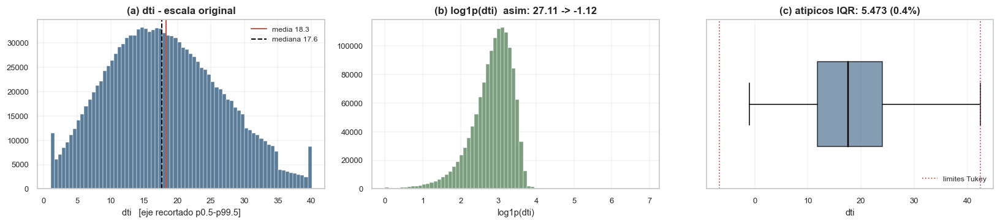

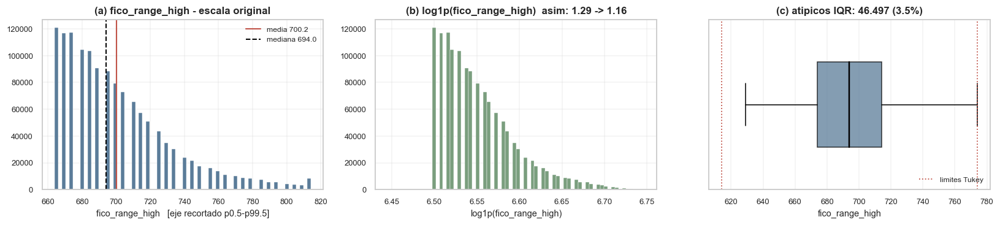

...

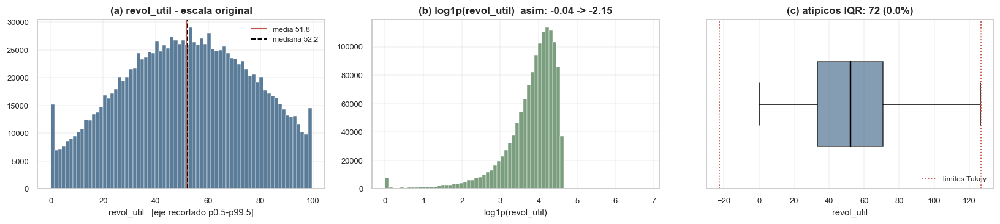

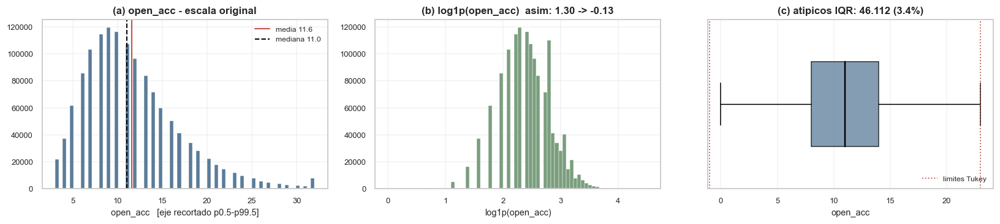

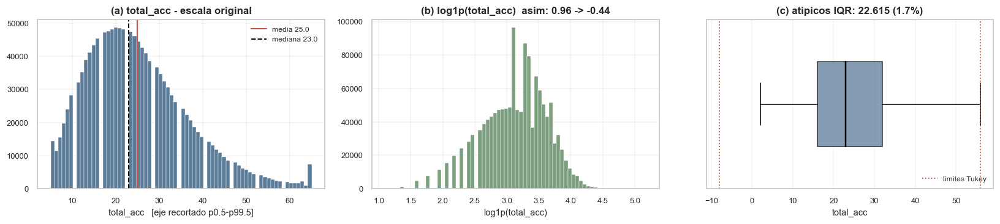

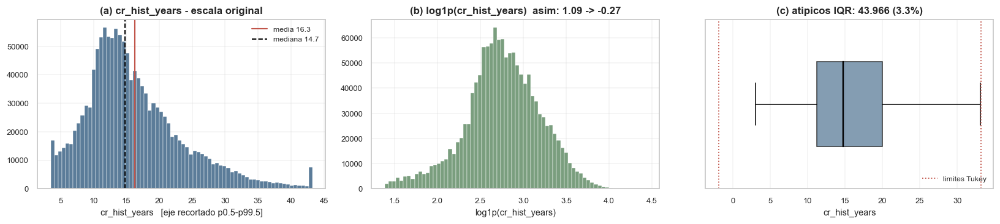

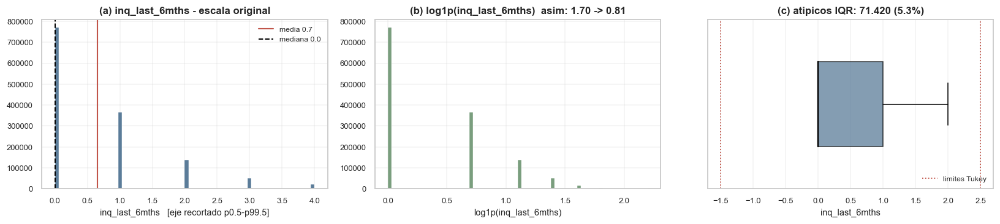

In [31]:
def panel_detalle(data, col, bins=70):
  sv = data[col].dropna()
  o = iqr_outliers(sv)
  fig, axes = plt.subplots(1, 3, figsize=(15, 3.5))

  # (a) escala original, recortada a p0.5-p99.5 solo para ver
  lo, hi = sv.quantile(0.005), sv.quantile(0.995)
  axes[0].hist(sv.clip(lo, hi), bins=bins, color=C_NEUTRAL, edgecolor="white", linewidth=0.3)
  axes[0].axvline(sv.mean(),  color=C_DEF, lw=1.4, label="media {:,.1f}".format(sv.mean()))
  axes[0].axvline(sv.median(), color="black", ls="--", lw=1.3, label="mediana {:,.1f}".format(sv.median()))
  axes[0].set_title("(a) {} - escala original".format(col))
  axes[0].legend(fontsize=8, frameon=False)
  axes[0].set_xlabel(col + "  [eje recortado p0.5-p99.5]")

  # (b) tras log1p
  ax = axes[1]
  if sv.min() >= -1:
    lg = np.log1p(sv.clip(lower=0))
    ax.hist(lg, bins=bins, color="#7A9E7E", edgecolor="white", linewidth=0.3)
    ax.set_title("(b) log1p({}) asim: {:.2f} -> {:.2f}".format(
      col, float(stats.skew(sv)), float(stats.skew(lg))))
    ax.set_xlabel("log1p(" + col + ")")
  else:
    ax.text(0.5, 0.5, "log1p no aplicable\n(valores < -1)", ha="center", va="center",
        transform=ax.transAxes)
    ax.set_title("(b) log1p no aplicable")

  # (c) boxplot con limites de Tukey
  ax = axes[2]
  bp = ax.boxplot(sv, vert=False, showfliers=False, widths=0.5, patch_artist=True,
          whis=1.5, medianprops=dict(color="black", lw=1.6))
  bp["boxes"][0].set_facecolor(C_NEUTRAL); bp["boxes"][0].set_alpha(0.75)
  ax.axvline(o["lim_inf"], color=C_DEF, ls=":", lw=1.2)
  ax.axvline(o["lim_sup"], color=C_DEF, ls=":", lw=1.2, label="limites Tukey")
  ax.set_yticks([])
  ax.set_title("(c) atipicos IQR: {} ({:.1f}%)".format(human_int(o["n_out"]), o["pct_out"]))
  ax.set_xlabel(col)
  ax.legend(fontsize=8, frameon=False, loc="lower right")

  plt.tight_layout(); plt.show()

for col in NUM_FOCO:
  panel_detalle(dfm, col)

## 4.5 Tasa de valores faltantes por variable numérica y umbral de decisión

Conviene fijar un umbral (sugiere > 30 %). Se adopta un esquema de **tres tramos**,
porque tratar igual a una variable con 35 % de nulos y a una con 95 % sería perder
información en un caso y fabricarla en el otro:

In [32]:
nulos_num = pd.DataFrame({
  "pct_nulos": (100 * dfm[NUM_ANALISIS].isna().mean()).round(2),
  "n_nulos":  dfm[NUM_ANALISIS].isna().sum(),
}).sort_values("pct_nulos", ascending=False)

def tramo(p):
  if p > 70: return "C. Descartar (>70%)"
  if p > 30: return "B. Imputar + indicador (30-70%)"
  if p > 0:  return "A. Imputar por mediana (<30%)"
  return "Sin nulos"

nulos_num["decision"] = nulos_num["pct_nulos"].map(tramo)
show(nulos_num, "Tasa de nulos por variable numerica predictora y decision preliminar")

resumen_tramos = (nulos_num["decision"].value_counts().rename_axis("Tramo")
         .to_frame("N. de variables").sort_index())
show(resumen_tramos, "Reparto de variables numericas por tramo de nulidad")


Tasa de nulos por variable numerica predictora y decision preliminar
--------------------------------------------------------------------


,pct_nulos,n_nulos,decision
mths_since_recent_revol_delinq,66.5500,895348,B. Imputar + indicador (30-70%)
il_util,65.4300,880294,B. Imputar + indicador (30-70%)
mths_since_rcnt_il,61.1000,821928,B. Imputar + indicador (30-70%)
all_util,60.0400,807765,B. Imputar + indicador (30-70%)
open_rv_12m,60.0400,807712,B. Imputar + indicador (30-70%)
max_bal_bc,60.0400,807712,B. Imputar + indicador (30-70%)
inq_last_12m,60.0400,807713,B. Imputar + indicador (30-70%)
open_acc_6m,60.0400,807713,B. Imputar + indicador (30-70%)
open_act_il,60.0400,807712,B. Imputar + indicador (30-70%)
open_il_12m,60.0400,807712,B. Imputar + indicador (30-70%)



Reparto de variables numericas por tramo de nulidad
---------------------------------------------------


,N. de variables
Tramo,
A. Imputar por mediana (<30%),38
B. Imputar + indicador (30-70%),16
Sin nulos,21


**Justificación de los tramos.**

- **< 30 % — imputar por mediana.** Se usa la mediana y no la media porque prácticamente
 todas estas variables tienen asimetría fuerte (sección 4.1), y la media está arrastrada por la
 cola. Es una decisión que se sigue directamente de la evidencia descriptiva.
- **30–70 % — imputar y añadir un indicador binario `*_faltante`.** En este conjunto la
 ausencia suele ser **informativa**: `mths_since_last_delinq` está vacía precisamente
 cuando el solicitante **nunca tuvo una morosidad**, que es la mejor noticia posible sobre
 su historial. Imputar sin marcar destruiría esa señal; la sección 6 lo comprueba
 estadísticamente contra el objetivo.
- **> 70 % — descartar.** Con más de siete de cada diez valores ausentes, cualquier
 imputación genera mayoritariamente datos sintéticos. El bloque `sec_app_*` (~95 % vacío)
 ilustra el caso: solo existe para solicitudes conjuntas, así que su información real ya
 está capturada por `application_type`, que está completa.

## 4.6 Variables categóricas — frecuencias y estructura

In [33]:
def analizar_categorica(data, col, top=None):
  """Tabla de frecuencia absoluta y relativa con marca de categorias raras."""
  s = data[col]
  vc = s.value_counts(dropna=False)
  tab = pd.DataFrame({
    "frec_absoluta": vc,
    "frec_relativa_pct": (100 * vc / len(s)).round(3),
  })
  tab["acumulado_pct"] = tab["frec_relativa_pct"].cumsum().round(2)
  tab["rara_<1pct"]  = np.where(tab["frec_relativa_pct"] < 1.0, "SI", "")
  tab.index.name = col
  return tab if top is None else tab.head(top)

resumen_cat = []
for col in CAT_ANALISIS:
  s  = dfm[col]
  vc = s.value_counts(dropna=False)
  rel = 100 * vc / len(s)
  resumen_cat.append(dict(
    variable    = col,
    n_categorias  = int(s.nunique(dropna=True)),
    pct_nulos    = round(100 * s.isna().mean(), 3),
    moda      = str(vc.index[0]),
    pct_moda    = round(rel.iloc[0], 2),
    n_cats_raras  = int((rel < 1.0).sum()),
    pct_masa_rara  = round(rel[rel < 1.0].sum(), 3),
    entropia_norm  = round(float(stats.entropy(vc.values) / np.log(len(vc))), 3) if len(vc) > 1 else 0.0,
  ))
resumen_cat = pd.DataFrame(resumen_cat).set_index("variable")
show(resumen_cat, "Resumen estructural de las variables categoricas predictoras")


Resumen estructural de las variables categoricas predictoras
------------------------------------------------------------


,n_categorias,pct_nulos,moda,pct_moda,n_cats_raras,pct_masa_rara,entropia_norm
variable,,,,,,,
term,2,0.0000,36 months,75.8700,0,0.0000,0.7970
grade,7,0.0000,B,29.1900,1,0.6790,0.8300
sub_grade,35,0.0000,C1,6.3500,10,3.0620,0.9040
emp_length,11,5.8360,10+ years,32.8700,0,0.0000,0.8930
home_ownership,6,0.0000,MORTGAGE,49.4700,3,0.0360,0.5350
verification_status,3,0.0000,Source Verified,38.7500,0,0.0000,0.9940
purpose,14,0.0000,debt_consolidation,58.0000,6,2.1820,0.5080
addr_state,51,0.0000,CA,14.6100,23,9.3570,0.8510
application_type,2,0.0000,Individual,98.0800,0,0.0000,0.1370


> La **entropía normalizada** (0 = toda la masa en una categoría, 1 = uniforme) resume de
> un vistazo cuánta información puede aportar cada variable. `disbursement_method` e
> `initial_list_status` tienen entropía baja y muy pocas categorías: son casi constantes.
> `addr_state` y `sub_grade` están en el otro extremo.

In [34]:
for col in CAT_ANALISIS:
  n = dfm[col].nunique(dropna=True)
  show(analizar_categorica(dfm, col, top=None if n <= 20 else 20),
     "{} - {} categorias{}".format(col, n, " (se muestran las 20 mas frecuentes)" if n > 20 else ""))


term  -  2 categorias
---------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
term,,,,
36 months,1020743,75.8740,75.8700,
60 months,324567,24.1260,100.0000,



grade  -  7 categorias
----------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
grade,,,,
B,392741,29.1930,29.1900,
C,381686,28.3720,57.5600,
A,235090,17.4750,75.0400,
D,200953,14.9370,89.9800,
E,93650,6.9610,96.9400,
F,32058,2.3830,99.3200,
G,9132,0.6790,100.0000,SI



sub_grade  -  35 categorias  (se muestran las 20 mas frecuentes)
----------------------------------------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
sub_grade,,,,
C1,85494,6.3550,6.3600,
B4,83199,6.1840,12.5400,
B5,82538,6.1350,18.6700,
B3,81827,6.0820,24.7600,
C2,79213,5.8880,30.6400,
C3,74998,5.5750,36.2200,
C4,74421,5.5320,41.7500,
B2,74024,5.5020,47.2500,
B1,71153,5.2890,52.5400,



emp_length  -  11 categorias
----------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
emp_length,,,,
10+ years,442199,32.8700,32.8700,
2 years,121743,9.0490,41.9200,
< 1 year,108061,8.0320,49.9500,
3 years,107597,7.9980,57.9500,
1 year,88494,6.5780,64.5300,
5 years,84154,6.2550,70.7800,
4 years,80556,5.9880,76.7700,
NaN,78511,5.8360,82.6100,
6 years,62733,4.6630,87.2700,



home_ownership  -  6 categorias
-------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
home_ownership,,,,
MORTGAGE,665579,49.4740,49.4700,
RENT,534421,39.7250,89.2000,
OWN,144832,10.7660,99.9600,
ANY,286,0.0210,99.9900,SI
OTHER,144,0.0110,100.0000,SI
NONE,48,0.0040,100.0000,SI



verification_status  -  3 categorias
------------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
verification_status,,,,
Source Verified,521273,38.7470,38.7500,
Verified,418336,31.0960,69.8400,
Not Verified,405701,30.1570,100.0000,



purpose  -  14 categorias
-------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
purpose,,,,
debt_consolidation,780321,58.0030,58.0000,
credit_card,295279,21.9490,79.9500,
home_improvement,87504,6.5040,86.4600,
other,77875,5.7890,92.2400,
major_purchase,29425,2.1870,94.4300,
medical,15554,1.1560,95.5900,
small_business,15416,1.1460,96.7300,
car,14585,1.0840,97.8200,
moving,9480,0.7050,98.5200,SI



addr_state  -  51 categorias  (se muestran las 20 mas frecuentes)
-----------------------------------------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
addr_state,,,,
CA,196528,14.6080,14.6100,
TX,110169,8.1890,22.8000,
NY,109842,8.1650,30.9600,
FL,95606,7.1070,38.0700,
IL,51720,3.8440,41.9100,
NJ,48449,3.6010,45.5100,
PA,45522,3.3840,48.9000,
OH,43842,3.2590,52.1600,
GA,43376,3.2240,55.3800,



application_type  -  2 categorias
---------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
application_type,,,,
Individual,1319510,98.0820,98.0800,
Joint App,25800,1.9180,100.0000,



initial_list_status  -  2 categorias
------------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
initial_list_status,,,,
w,784010,58.2770,58.2800,
f,561300,41.7230,100.0000,


disbursement_method  -  2 categorias
------------------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
disbursement_method,,,,
Cash,1338410,99.4870,99.4900,
DirectPay,6900,0.5130,100.0000,SI



issue_year  -  12 categorias
----------------------------


,frec_absoluta,frec_relativa_pct,acumulado_pct,rara_<1pct
issue_year,,,,
2015,375545,27.9150,27.9200,
2016,293095,21.7860,49.7000,
2014,223102,16.5840,66.2800,
2017,169300,12.5840,78.8700,
2013,134804,10.0200,88.8900,
2018,56311,4.1860,93.0700,
2012,53367,3.9670,97.0400,
2011,21721,1.6150,98.6600,
2010,11536,0.8570,99.5100,SI


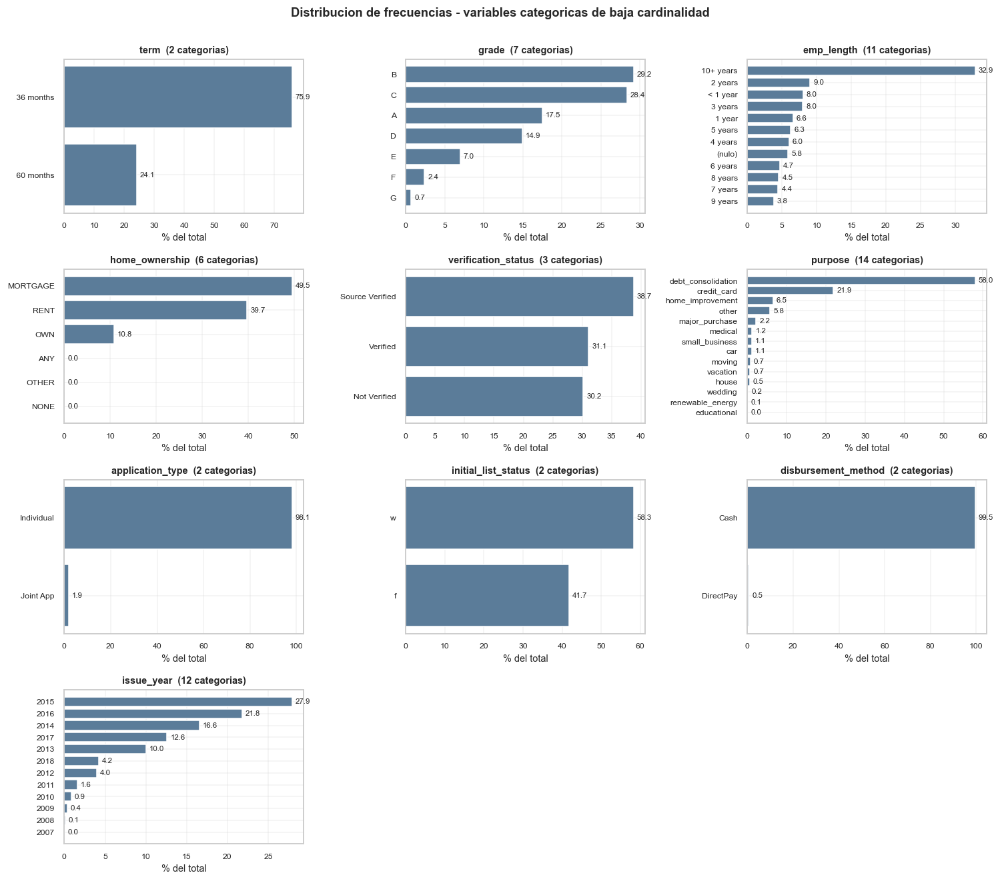

In [35]:
def barras_categorica(data, col, ax, top=25, horizontal=True):
  vc = data[col].value_counts(dropna=False).head(top)
  rel = 100 * vc / len(data)
  etiquetas = [("(nulo)" if pd.isna(i) else str(i)) for i in vc.index]
  if horizontal:
    ax.barh(etiquetas[::-1], rel.values[::-1], color=C_NEUTRAL, edgecolor="white")
    ax.set_xlabel("% del total")
    for y, v in enumerate(rel.values[::-1]):
      ax.text(v + max(rel) * 0.015, y, "{:.1f}".format(v), va="center", fontsize=7.5)
  else:
    ax.bar(etiquetas, rel.values, color=C_NEUTRAL, edgecolor="white")
    ax.set_ylabel("% del total")
    ax.tick_params(axis="x", rotation=90)
  n = data[col].nunique(dropna=True)
  ax.set_title("{} ({} categorias{})".format(col, n, ", top {}".format(top) if n > top else ""),
         fontsize=9.5)
  ax.tick_params(labelsize=8)

PEQUENAS = [c for c in CAT_ANALISIS if dfm[c].nunique(dropna=True) <= 15]
GRANDES = [c for c in CAT_ANALISIS if dfm[c].nunique(dropna=True) > 15]

ncols = 3
nrows = math.ceil(len(PEQUENAS) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(4.6 * ncols, 3.0 * nrows))
axes = np.atleast_1d(axes).ravel()
for ax, col in zip(axes, PEQUENAS):
  barras_categorica(dfm, col, ax, horizontal=True)
for ax in axes[len(PEQUENAS):]:
  ax.set_visible(False)
fig.suptitle("Distribucion de frecuencias - variables categoricas de baja cardinalidad",
       fontsize=12, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

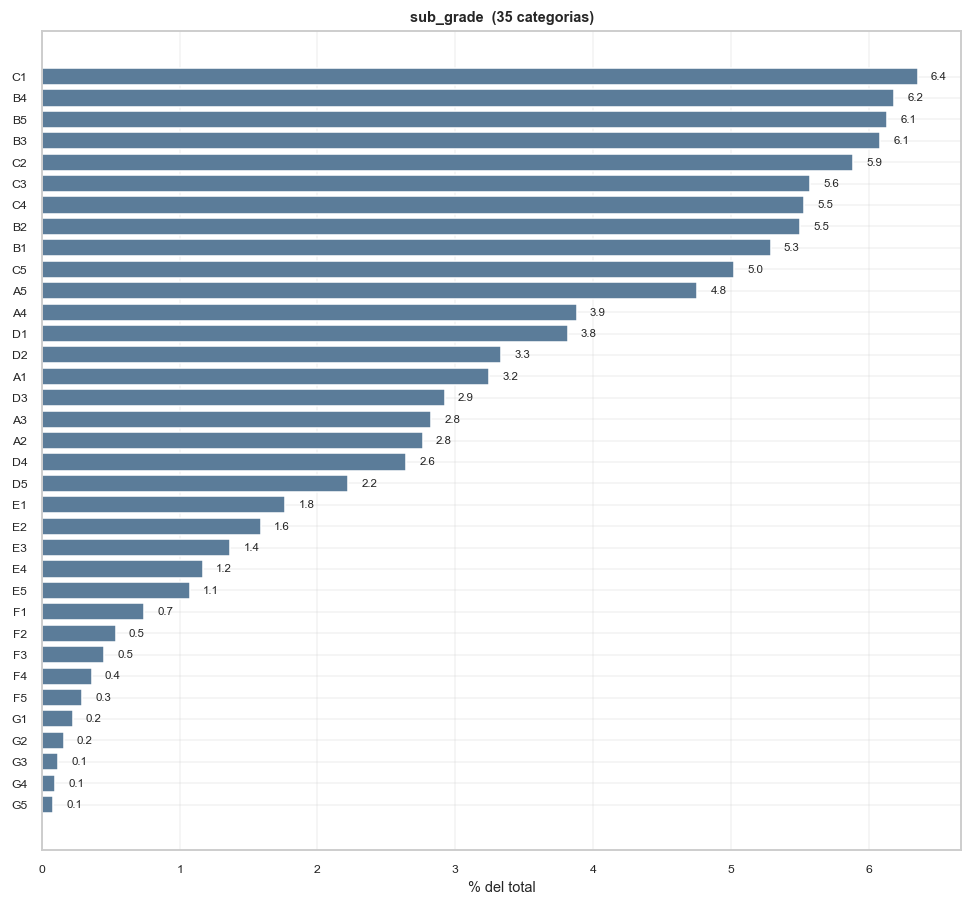

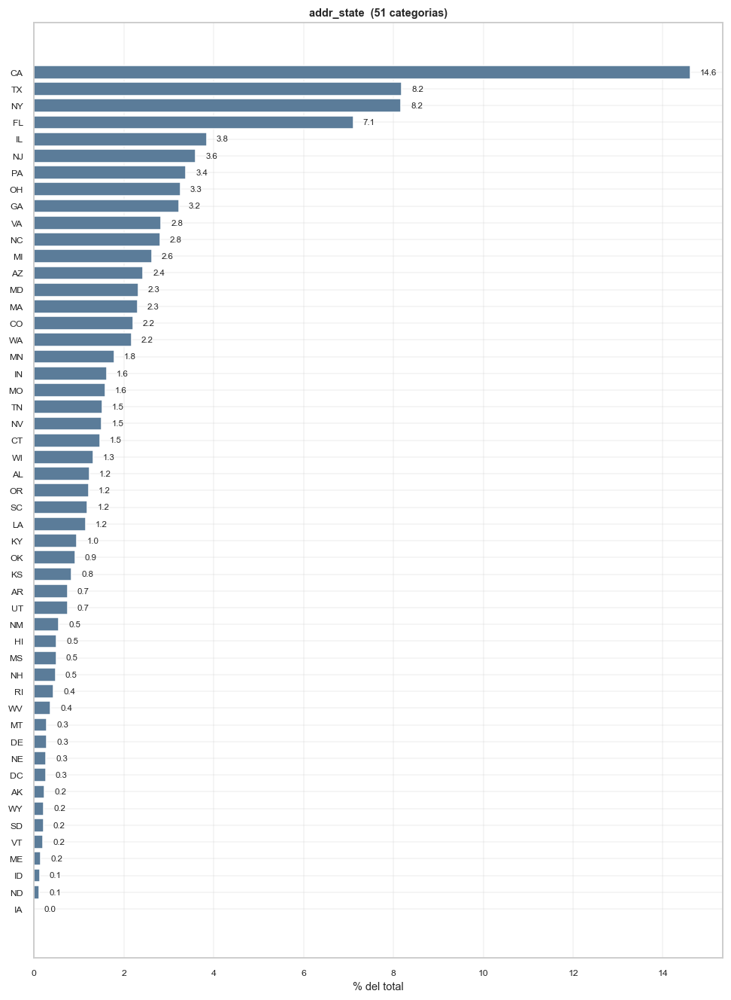

In [36]:
for col in GRANDES:
  fig, ax = plt.subplots(figsize=(9, max(3.2, 0.24 * min(dfm[col].nunique(), 55))))
  barras_categorica(dfm, col, ax, top=55, horizontal=True)
  plt.tight_layout(); plt.show()

### 4.6.1 Categorías raras, redundancias y limpieza

De las tablas y los gráficos anteriores se desprenden decisiones concretas:

In [37]:
revision = pd.DataFrame([
  dict(variable="home_ownership",
     hallazgo="ANY / NONE / OTHER suman <0,05 %; los tres significan 'no clasificado'",
     decision="Agrupar en OTHER (3 categorias -> 1)"),
  dict(variable="purpose",
     hallazgo="'educational', 'wedding', 'renewable_energy' por debajo del 1 %",
     decision="Agrupar en 'other'; conservar 'debt_consolidation' y 'credit_card' que son ~78 % de la masa"),
  dict(variable="addr_state",
     hallazgo="51 categorias; varios estados con <0,2 % de los prestamos",
     decision="Candidata a agrupacion por region o a codificacion por tasa objetivo (target encoding)"),
  dict(variable="grade / sub_grade",
     hallazgo="sub_grade es un refinamiento exacto de grade (A -> A1..A5): informacion anidada",
     decision="Usar SOLO UNA de las dos para evitar redundancia perfecta"),
  dict(variable="grade / int_rate",
     hallazgo="grade ES la traduccion categorica del precio que fija la plataforma",
     decision="Cuantificar la asociacion en la sección 5.3 antes de decidir"),
  dict(variable="title / purpose",
     hallazgo="'title' es texto libre que replica 'purpose' con miles de variantes de escritura",
     decision="Descartar 'title'; 'purpose' ya la resume de forma normalizada"),
  dict(variable="disbursement_method",
     hallazgo="'Cash' concentra practicamente toda la masa",
     decision="Casi constante: valor predictivo esperable nulo, se contrasta con chi-cuadrado"),
  dict(variable="emp_length",
     hallazgo="Categoria ordinal codificada como texto ('< 1 year' ... '10+ years')",
     decision="Convertida a 'emp_length_num'; el techo en 10 censura la antiguedad real"),
  dict(variable="term",
     hallazgo="Solo 2 valores (' 36 months', ' 60 months') con espacio inicial",
     decision="Convertida a 'term_num' numerica (36/60)"),
]).set_index("variable")
show(revision, "Revision de categorias raras y redundancias")


Revision de categorias raras y redundancias
-------------------------------------------


,hallazgo,decision
variable,,
home_ownership,"ANY / NONE / OTHER suman <0,05 %; los tres sig...",Agrupar en OTHER (3 categorias -> 1)
purpose,"'educational', 'wedding', 'renewable_energy' p...",Agrupar en 'other'; conservar 'debt_consolidat...
addr_state,"51 categorias; varios estados con <0,2 % de lo...",Candidata a agrupacion por region o a codifica...
grade / sub_grade,sub_grade es un refinamiento exacto de grade (...,Usar SOLO UNA de las dos para evitar redundanc...
grade / int_rate,grade ES la traduccion categorica del precio q...,Cuantificar la asociacion en la sección 5.3 an...
title / purpose,'title' es texto libre que replica 'purpose' c...,Descartar 'title'; 'purpose' ya la resume de f...
disbursement_method,'Cash' concentra practicamente toda la masa,Casi constante: valor predictivo esperable nul...
emp_length,Categoria ordinal codificada como texto ('< 1 ...,Convertida a 'emp_length_num'; el techo en 10 ...
term,"Solo 2 valores (' 36 months', ' 60 months') co...",Convertida a 'term_num' numerica (36/60)


In [38]:
# Verificacion de la redundancia anidada grade / sub_grade
anidado = pd.crosstab(dfm["sub_grade"].astype(str).str[0], dfm["grade"].astype(str))
coincide = bool((anidado.to_numpy().sum() == np.trace(anidado.to_numpy())))
print("La primera letra de sub_grade coincide SIEMPRE con grade:", coincide)
print("=> sub_grade contiene a grade por completo; usar ambas seria redundancia perfecta.")
print()

# Variables de cardinalidad muy alta: se reportan pero no entran al analisis grafico
alta = pd.DataFrame({
  "variable":   ["emp_title", "title", "zip_code", "url", "desc"],
  "n_categorias": [dfm[c].nunique(dropna=True) for c in ["emp_title", "title", "zip_code", "url", "desc"]],
  "pct_nulos":   [round(100 * dfm[c].isna().mean(), 2) for c in ["emp_title", "title", "zip_code", "url", "desc"]],
  "tratamiento":  ["Texto libre no estructurado: descartar",
           "Redundante con purpose: descartar",
           "Truncado a 3 digitos; addr_state ya lo cubre a mayor nivel",
           "Identificador puro: descartar",
           "94 % vacia y texto libre: descartar"],
}).set_index("variable")
show(alta, "Variables de texto / alta cardinalidad excluidas del analisis grafico")

La primera letra de sub_grade coincide SIEMPRE con grade: True
=> sub_grade contiene a grade por completo; usar ambas seria redundancia perfecta.




Variables de texto / alta cardinalidad excluidas del analisis grafico
---------------------------------------------------------------------


,n_categorias,pct_nulos,tratamiento
variable,,,
emp_title,378353,6.3800,Texto libre: descartar (requeriria NLP)
title,61681,1.2400,Redundante con purpose: descartar
zip_code,943,0.0000,Truncado a 3 digitos; addr_state ya lo cubre a...
url,1345310,0.0000,Identificador puro: descartar
desc,122004,90.8200,94 % vacia y texto libre: descartar


---
# 5. Análisis bidimensional

## 5.1 Variables numéricas frente a `default`

Para cada variable numérica predictora se calcula:

- la **media y mediana por clase** y su diferencia absoluta y relativa;
- una **prueba *t* de Welch** (no asume varianzas iguales, que es lo apropiado aquí porque
 las dos clases tienen tamaños y dispersiones muy distintas);
- la **prueba U de Mann-Whitney**, no paramétrica, pertinente porque la sección 4.1 estableció que
 ninguna de estas variables es normal;
- dos **tamaños de efecto**: la *d* de Cohen y el *r* biserial de rangos;
- la **correlación punto-biserial** con `default`.

### Advertencia metodológica sobre los p-valores

Con *n* = 1.345.310 la potencia estadística es tan alta que **cualquier** diferencia,
incluso una irrelevante en la práctica, produce p < 0,05. Se verá que casi todas las
variables resultan "estadísticamente significativas". Ese resultado, por sí solo, **no
informa nada**: es una propiedad del tamaño de muestra, no de los datos.

Por eso la tabla se ordena por **tamaño de efecto** y no por p-valor, y la columna que
decide qué variables son prometedoras es la *d* de Cohen. Es la diferencia entre
*"la diferencia existe"* (p-valor) y *"la diferencia importa"* (tamaño de efecto).

In [39]:
# ============================================================================
# Contraste de cada variable numerica entre las dos clases del objetivo
# ============================================================================
g0 = dfm["default"] == 0
g1 = dfm["default"] == 1

filas = []
for col in NUM_ANALISIS:
  a = dfm.loc[g0, col].dropna().to_numpy(dtype="float64")
  b = dfm.loc[g1, col].dropna().to_numpy(dtype="float64")
  if a.size < 30 or b.size < 30:
    continue

  m0, m1 = a.mean(), b.mean()
  md0, md1 = np.median(a), np.median(b)

  t_stat, p_t = stats.ttest_ind(a, b, equal_var=False)     # Welch
  u_stat, p_u = stats.mannwhitneyu(a, b, alternative="two-sided", method="asymptotic")
  r_rb = 2.0 * u_stat / (a.size * b.size) - 1.0         # r biserial de rangos
  d  = cohens_d(b, a)                     # signo: default - pagado
  r_pb, p_pb = point_biserial(dfm[col], dfm["default"])

  filas.append(dict(
    variable    = col,
    media_pagado  = m0,
    media_default  = m1,
    dif_medias   = m1 - m0,
    dif_relativa_pct= (100 * (m1 - m0) / m0) if m0 != 0 else np.nan,
    mediana_pagado = md0,
    mediana_default = md1,
    d_cohen     = d,
    efecto     = interpret_d(d),
    r_rangos    = -r_rb,
    r_punto_biserial= r_pb,
    p_welch     = p_t,
    p_mannwhitney  = p_u,
    signif     = stars(min(p_t, p_u)),
    abs_d      = abs(d) if np.isfinite(d) else 0.0,
  ))

biv_num = pd.DataFrame(filas).sort_values("abs_d", ascending=False).set_index("variable")
biv_num_vis = biv_num.copy()
biv_num_vis["p_welch"]    = biv_num_vis["p_welch"].map(fmt_p)
biv_num_vis["p_mannwhitney"] = biv_num_vis["p_mannwhitney"].map(fmt_p)
biv_num.drop(columns="abs_d").to_csv(OUT_DIR / "eda_bivariado_numericas.csv")

show(biv_num_vis.drop(columns="abs_d"),
   "Numericas vs `default` - ordenado por |d de Cohen| (n = {})".format(human_int(N_MOD)))


Numericas vs `default` - ordenado por |d de Cohen| (n = 1.345.310)
------------------------------------------------------------------


,media_pagado,media_default,dif_medias,dif_relativa_pct,mediana_pagado,mediana_default,d_cohen,efecto,r_rangos,r_punto_biserial,p_welch,p_mannwhitney,signif
variable,,,,,,,,,,,,,
int_rate,12.6233,15.7107,3.0874,24.4582,12.2300,15.0500,0.6703,mediano,0.3670,0.2588,< 1e-300,< 1e-300,***
term_num,40.8871,45.4108,4.5237,11.0639,36.0000,36.0000,0.4475,pequeno,0.1885,0.1761,< 1e-300,< 1e-300,***
fico_range_low,698.2639,687.8501,-10.4138,-1.4914,690.0000,680.0000,-0.3298,pequeno,-0.1868,-0.1307,< 1e-300,< 1e-300,***
fico_range_high,702.2641,691.8502,-10.4139,-1.4829,694.0000,684.0000,-0.3298,pequeno,-0.1868,-0.1307,< 1e-300,< 1e-300,***
acc_open_past_24mths,4.5329,5.3262,0.7933,17.5007,4.0000,5.0000,0.2502,pequeno,0.1426,0.0999,< 1e-300,< 1e-300,***
all_util,57.1769,61.6509,4.4740,7.8249,58.0000,63.0000,0.2146,pequeno,0.1264,0.0890,< 1e-300,< 1e-300,***
num_tl_op_past_12m,2.0994,2.4928,0.3934,18.7391,2.0000,2.0000,0.2140,pequeno,0.1206,0.0856,< 1e-300,< 1e-300,***
dti,17.8116,20.1712,2.3596,13.2473,17.1100,19.7600,0.2122,pequeno,0.1542,0.0845,< 1e-300,< 1e-300,***
bc_open_to_buy,"10,818.8585","7,678.9119","-3,139.9466",-29.0229,"5,045.0000","3,587.0000",-0.2052,pequeno,-0.1285,-0.0820,< 1e-300,< 1e-300,***


In [40]:
# --- Cuantos resultados son 'significativos' vs cuantos tienen efecto apreciable
n_sig  = int((biv_num["p_welch"] < 0.05).sum())
n_efecto = int((biv_num["abs_d"] >= 0.10).sum())
n_med  = int((biv_num["abs_d"] >= 0.20).sum())

print("De {} variables numericas contrastadas:".format(len(biv_num)))
print(" - con p < 0,05 (Welch)           : {} ({:.0f} %)".format(n_sig, 100 * n_sig / len(biv_num)))
print(" - con |d| >= 0,10 (efecto apreciable)    : {}".format(n_efecto))
print(" - con |d| >= 0,20 (pequeno o mayor, Cohen) : {}".format(n_med))
print()
print("La brecha entre la primera cifra y las otras dos es exactamente el punto de la")
print("advertencia metodologica: la significancia es gratuita con n = 1,3 millones.")

De 75 variables numericas contrastadas:
  - con p < 0,05 (Welch)                      : 71  (95 %)
  - con |d| >= 0,10 (efecto apreciable)       : 37
  - con |d| >= 0,20 (pequeno o mayor, Cohen)  : 9

La brecha entre la primera cifra y las otras dos es exactamente el punto de la
advertencia metodologica: la significancia es gratuita con n = 1,3 millones.


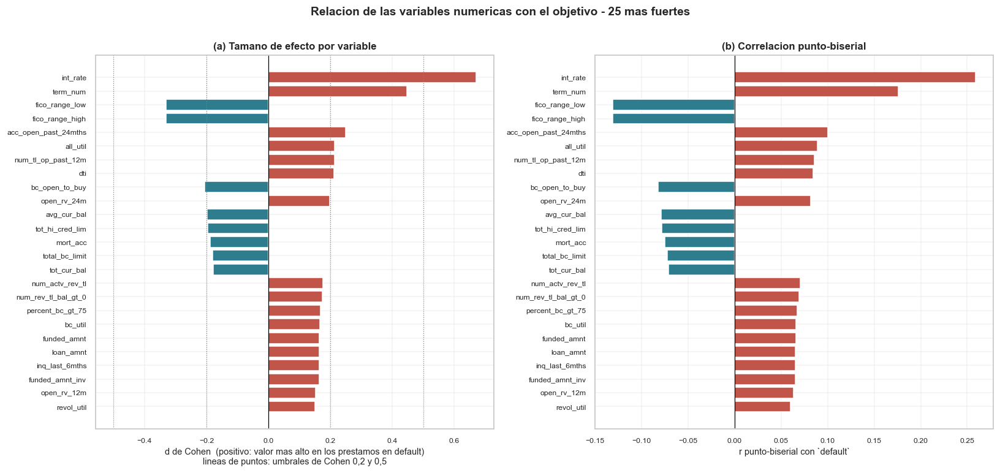

In [41]:
# --- Grafico: correlacion punto-biserial y d de Cohen de las 25 variables mas fuertes
top25 = biv_num.head(25)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))

ax = axes[0]
cl = [C_DEF if v > 0 else C_PAID for v in top25["d_cohen"]]
ax.barh(top25.index[::-1], top25["d_cohen"][::-1], color=cl[::-1], edgecolor="white")
ax.axvline(0, color="black", lw=0.8)
for x in (-0.50, -0.20, 0.20, 0.50):
  ax.axvline(x, color="gray", ls=":", lw=0.8)
ax.set_xlabel("d de Cohen (positivo: valor mas alto en los prestamos en default)\n"
       "lineas de puntos: umbrales de Cohen 0,2 y 0,5")
ax.set_title("(a) Tamano de efecto por variable")
ax.tick_params(labelsize=8)

ax = axes[1]
cl = [C_DEF if v > 0 else C_PAID for v in top25["r_punto_biserial"]]
ax.barh(top25.index[::-1], top25["r_punto_biserial"][::-1], color=cl[::-1], edgecolor="white")
ax.axvline(0, color="black", lw=0.8)
ax.set_xlabel("r punto-biserial con `default`")
ax.set_title("(b) Correlacion punto-biserial")
ax.tick_params(labelsize=8)

fig.suptitle("Relacion de las variables numericas con el objetivo - 25 mas fuertes",
       fontsize=12.5, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

## 5.2 Boxplots comparativos por clase

Se cubren todas las variables numéricas predictoras. Igual que en la sección 4.3, los valores
extremos no se dibujan y el eje se recorta al percentil 99 del conjunto para que la
comparación entre las dos cajas sea visible.

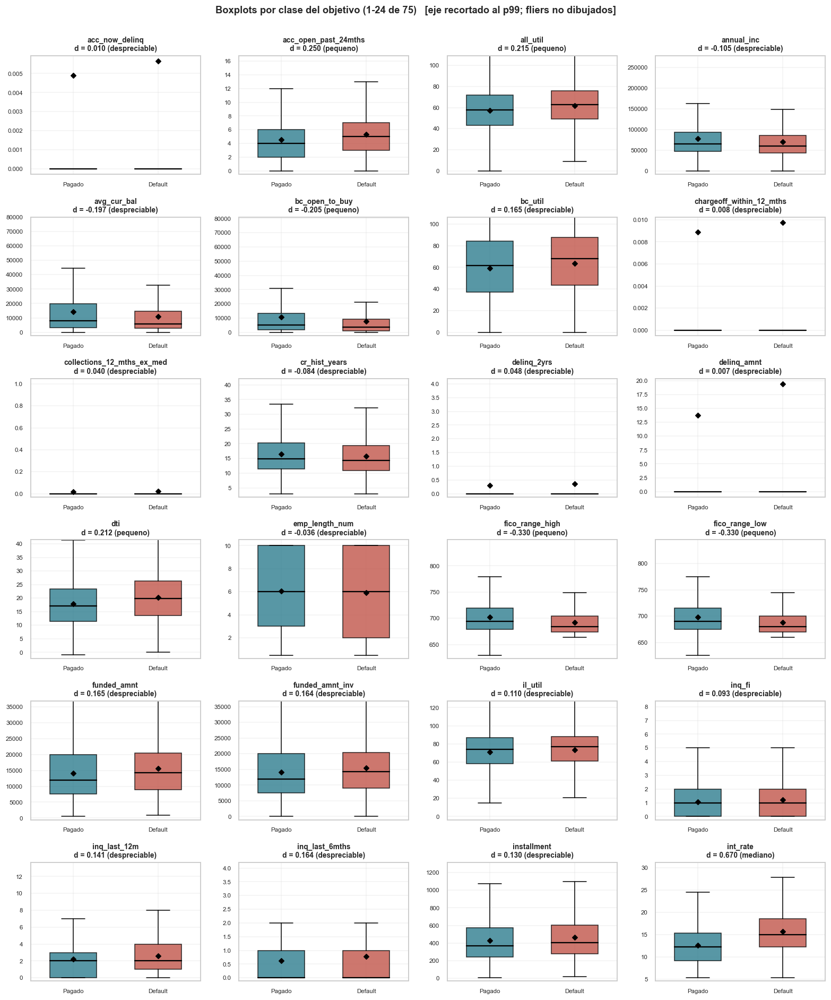

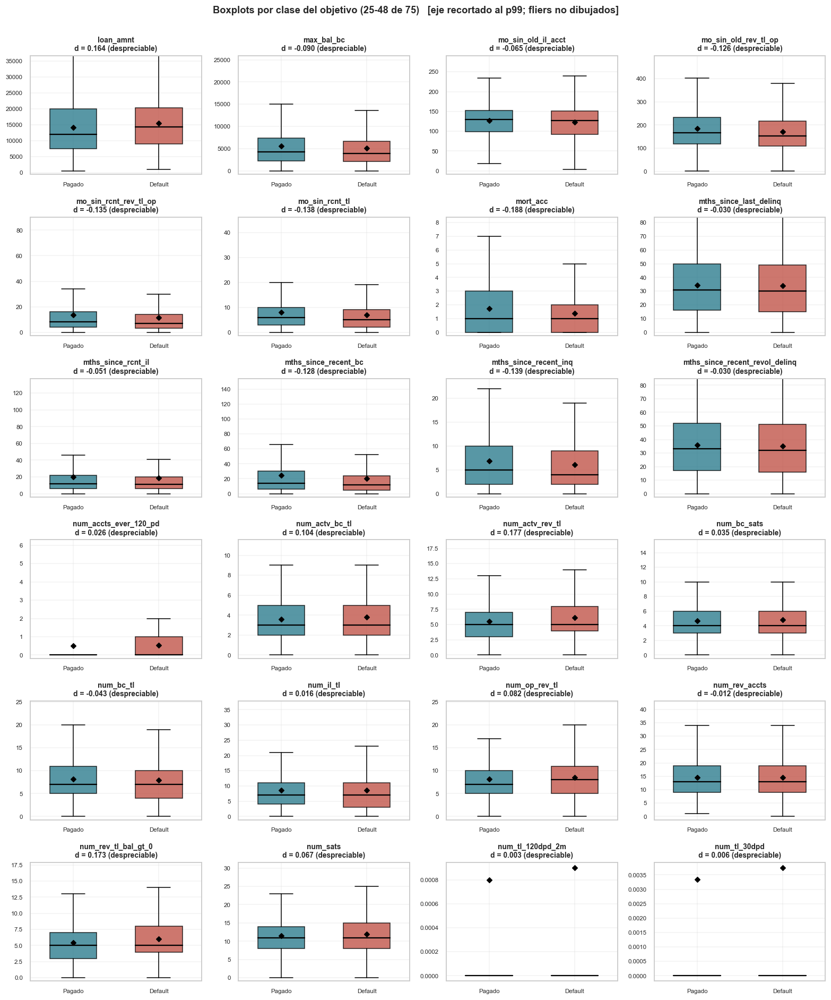

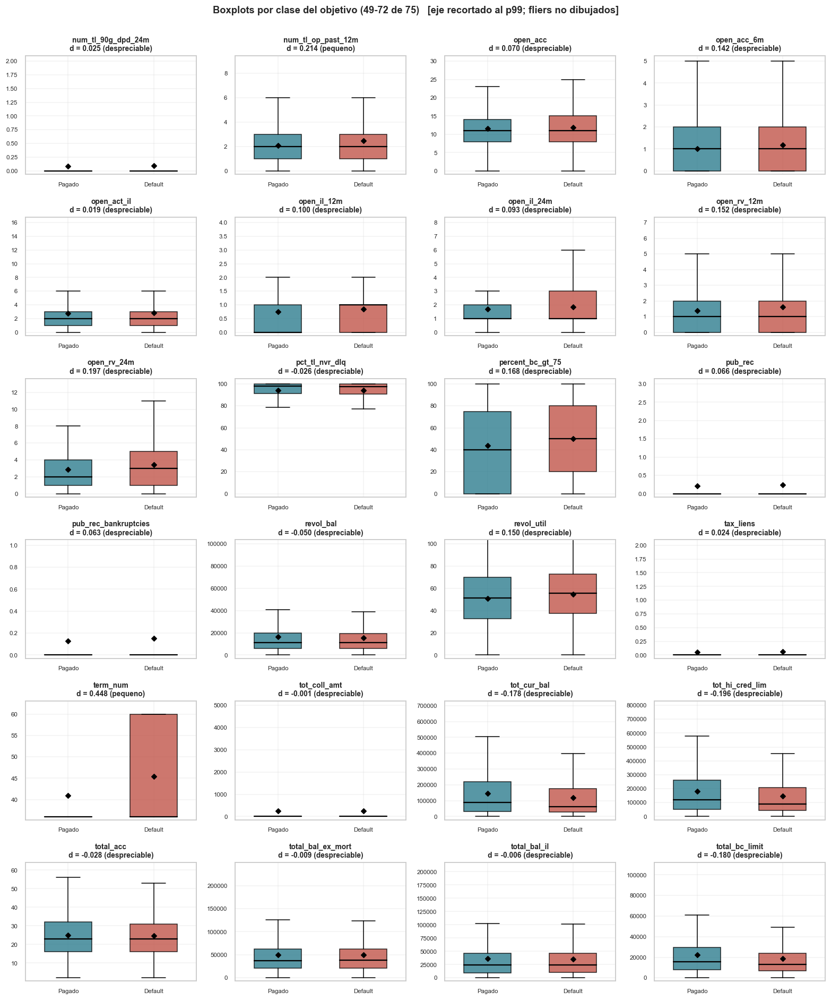

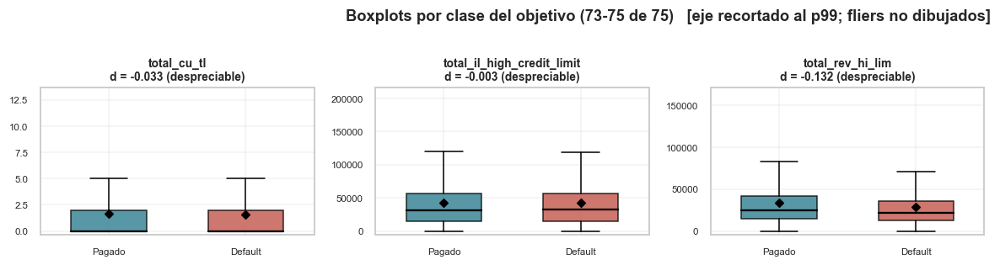

In [42]:
def cuadricula_box_clase(data, cols, ncols=4, alto=2.85, titulo=None, recorte=0.99):
  """Boxplots enfrentados por clase del objetivo, con la d de Cohen anotada."""
  cols = [c for c in cols if c in data.columns and data[c].notna().any()]
  nrows = math.ceil(len(cols) / ncols)
  fig, axes = plt.subplots(nrows, ncols, figsize=(3.6 * ncols, alto * nrows))
  axes = np.atleast_1d(axes).ravel()
  for ax, col in zip(axes, cols):
    a = data.loc[data["default"] == 0, col].dropna()
    b = data.loc[data["default"] == 1, col].dropna()
    if a.empty or b.empty:
      ax.set_visible(False); continue
    bp = ax.boxplot([a, b], vert=True, showfliers=False, widths=0.55,
            patch_artist=True, whis=1.5,
            medianprops=dict(color="black", lw=1.5))
    for caja, cval in zip(bp["boxes"], [C_PAID, C_DEF]):
      caja.set_facecolor(cval); caja.set_alpha(0.8)
    ax.scatter([1, 2], [a.mean(), b.mean()], marker="D", s=20,
          color="black", zorder=5)
    hi = max(np.quantile(a, recorte), np.quantile(b, recorte))
    lo = min(a.min(), b.min())
    if np.isfinite(hi) and np.isfinite(lo) and hi > lo:
      ax.set_ylim(lo - 0.03 * (hi - lo), hi * 1.05 if hi > 0 else hi + 1)
    d = cohens_d(b.to_numpy(float), a.to_numpy(float))
    ax.set_xticklabels(["Pagado", "Default"], fontsize=8)
    ax.set_title("{}\nd = {:.3f} ({})".format(col, d, interpret_d(d)), fontsize=9)
    ax.tick_params(labelsize=7.5)
  for ax in axes[len(cols):]:
    ax.set_visible(False)
  if titulo:
    fig.suptitle(titulo, fontsize=12, fontweight="bold", y=1.0)
  plt.tight_layout(); plt.show()

for i in range(0, len(NUM_ANALISIS), BLOQUE):
  trozo = NUM_ANALISIS[i:i + BLOQUE]
  cuadricula_box_clase(dfm, trozo, titulo=(
    "Boxplots por clase del objetivo ({}-{} de {})  "
    "[eje recortado al p99; fliers no dibujados]"
    .format(i + 1, i + len(trozo), len(NUM_ANALISIS))))

## 5.3 Violin plots y densidades KDE por clase

El violín y la curva KDE son **estimaciones de densidad por núcleo**: su costo crece de
forma directa con el número de puntos y dibujar 1,3 millones de observaciones por variable
tardaría minutos por panel sin cambiar la forma resultante. Se emplea por tanto una
**muestra estratificada** que conserva la proporción 80/20 del objetivo, y se anota su
tamaño en la figura. Los estadísticos que respaldan la lectura (sección 5.1) están calculados
sobre la población completa.

In [43]:
# Muestra estratificada, unica y reutilizada, para las tres visualizaciones de densidad
N_MUESTRA_KDE = 120_000
frac = min(1.0, N_MUESTRA_KDE / N_MOD)
muestra_kde = dfm.groupby("default", observed=True).sample(frac=frac, random_state=42)
print("Muestra estratificada para densidades: {} filas ({:.1f} % del universo)".format(
  human_int(len(muestra_kde)), 100 * len(muestra_kde) / N_MOD))
print("Proporcion del objetivo conservada:")
print((100 * muestra_kde['default'].value_counts(normalize=True).sort_index()).round(2).to_string())

Muestra estratificada para densidades: 120.000 filas (8.9 % del universo)
Proporcion del objetivo conservada:
default
0   80.0400
1   19.9600


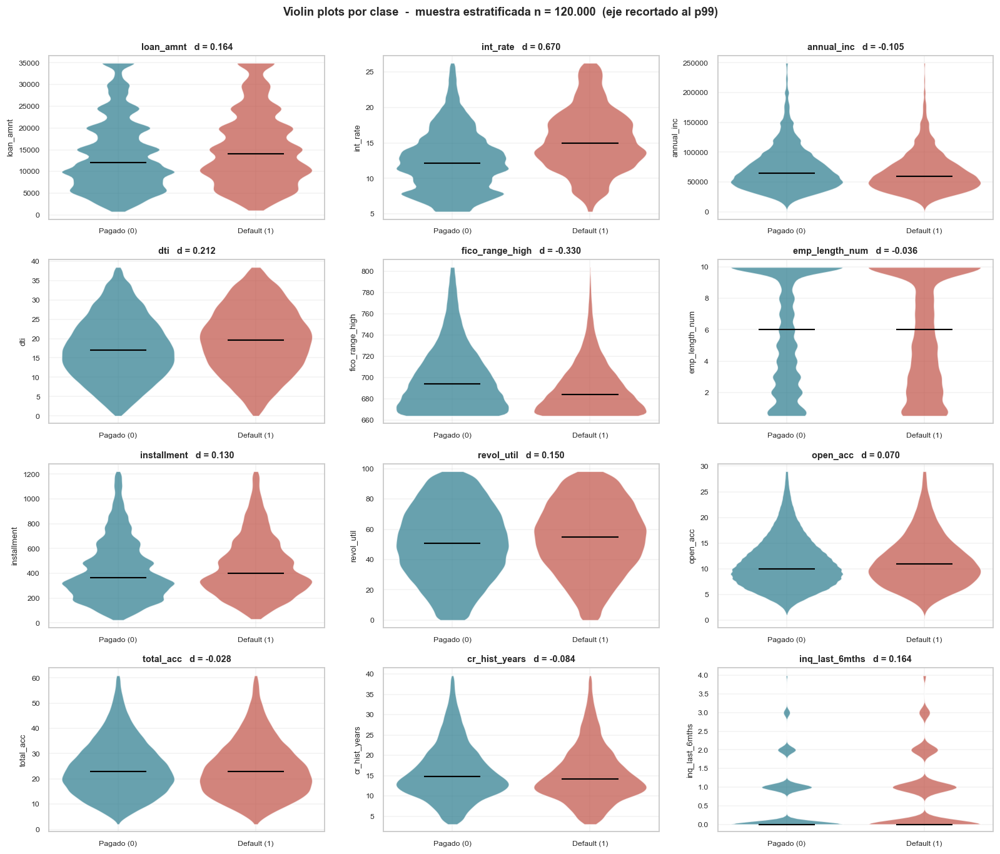

In [44]:
ncols = 3
nrows = math.ceil(len(NUM_FOCO) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(4.9 * ncols, 3.1 * nrows))
axes = np.atleast_1d(axes).ravel()

for ax, col in zip(axes, NUM_FOCO):
  sub = muestra_kde[[col, "default"]].dropna()
  hi = sub[col].quantile(0.99)
  sub = sub[sub[col] <= hi]
  datos = [sub.loc[sub["default"] == 0, col].to_numpy(float),
       sub.loc[sub["default"] == 1, col].to_numpy(float)]
  # Se usa el violinplot de matplotlib (no el de seaborn) para no depender de la
  # version de seaborn instalada, cuya API para violines cambio en la 0.13.
  partes = ax.violinplot(datos, positions=[1, 2], widths=0.82,
              showmedians=True, showextrema=False)
  for cuerpo, cval in zip(partes["bodies"], [C_PAID, C_DEF]):
    cuerpo.set_facecolor(cval); cuerpo.set_alpha(0.72); cuerpo.set_edgecolor("white")
  partes["cmedians"].set_color("black"); partes["cmedians"].set_linewidth(1.4)
  ax.set_xticks([1, 2]); ax.set_xticklabels(["Pagado (0)", "Default (1)"], fontsize=8)
  d = biv_num.loc[col, "d_cohen"] if col in biv_num.index else np.nan
  ax.set_title("{}  d = {:.3f}".format(col, d), fontsize=9.5)
  ax.set_ylabel(col, fontsize=8.5)
  ax.tick_params(labelsize=8)

for ax in axes[len(NUM_FOCO):]:
  ax.set_visible(False)
fig.suptitle("Violin plots por clase - muestra estratificada n = {} (eje recortado al p99)"
       .format(human_int(len(muestra_kde))),
       fontsize=12, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

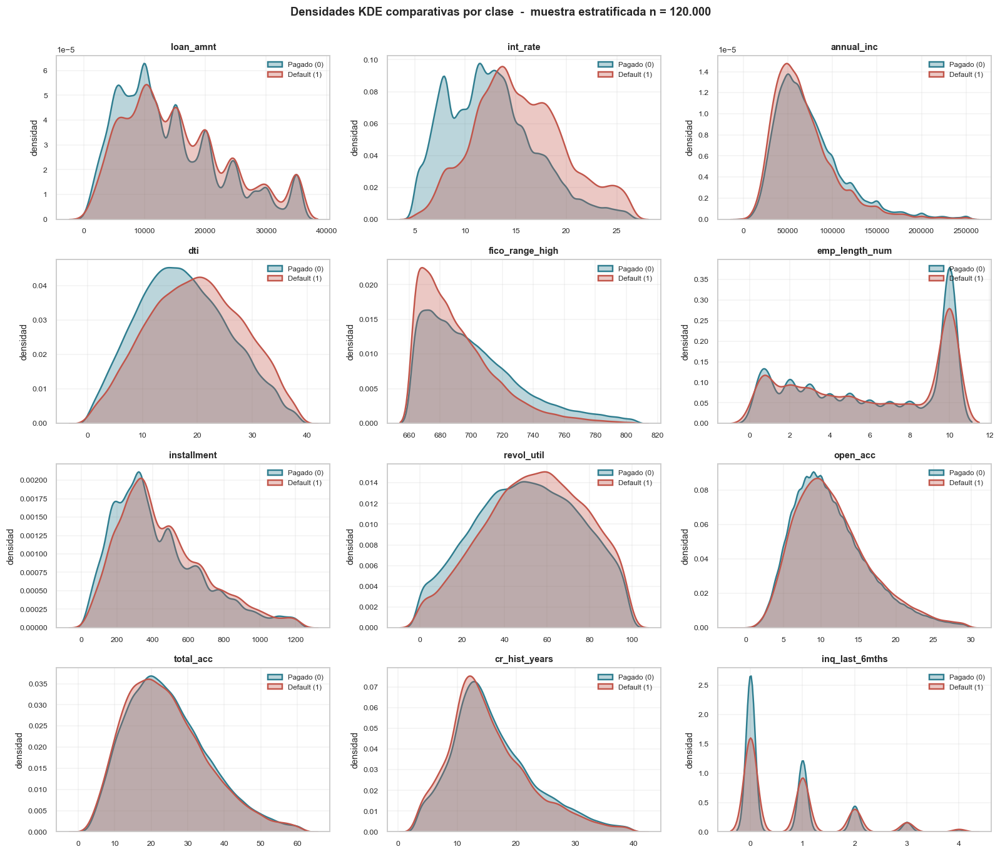

In [45]:
fig, axes = plt.subplots(nrows, ncols, figsize=(4.9 * ncols, 3.1 * nrows))
axes = np.atleast_1d(axes).ravel()

for ax, col in zip(axes, NUM_FOCO):
  sub = muestra_kde[[col, "default"]].dropna()
  hi = sub[col].quantile(0.99)
  sub = sub[sub[col] <= hi]
  for k, etiqueta in [(0, "Pagado (0)"), (1, "Default (1)")]:
    sns.kdeplot(x=sub.loc[sub["default"] == k, col], ax=ax, fill=True, alpha=0.32,
          color=PAL_TARGET[k], lw=1.6, label=etiqueta)
  ax.set_title(col, fontsize=9.5)
  ax.set_ylabel("densidad"); ax.set_xlabel("")
  ax.tick_params(labelsize=8)
  ax.legend(fontsize=7.5, frameon=False)

for ax in axes[len(NUM_FOCO):]:
  ax.set_visible(False)
fig.suptitle("Densidades KDE comparativas por clase - muestra estratificada n = {}"
       .format(human_int(len(muestra_kde))),
       fontsize=12, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

> **Lectura de las densidades.** El patrón dominante es que las dos clases **se solapan
> casi por completo** en todas las variables. Ninguna variable individual separa los
> préstamos pagados de los impagados; lo que existe es un **desplazamiento sistemático del
> centro de la distribución** — más visible en `int_rate` y en la relación con `fico`. Esa es
> exactamente la razón por la que este problema requiere un modelo multivariado como
> RandomForest y no una regla univariada, y también la razón por la que no cabe esperar un
> AUC cercano a 1: la señal está distribuida en muchas variables débiles.

## 5.4 Variables categóricas frente a `default`

Para cada categórica se construye una tabla de contingencia con la **tasa de impago por
categoría**, se contrasta la independencia con **chi-cuadrado** y se cuantifica la fuerza de
la asociación con la **V de Cramér**. Vuelve a aplicarse la advertencia dla sección 5.1: con este
*n*, el p-valor de chi-cuadrado será minúsculo casi siempre, de modo que la magnitud
relevante es la V de Cramér.

In [46]:
filas = []
for col in CAT_ANALISIS:
  ct = pd.crosstab(dfm[col], dfm["default"])
  ct = ct.loc[ct.sum(axis=1) > 0, ct.sum(axis=0) > 0]
  if ct.shape[0] < 2 or ct.shape[1] < 2:
    continue
  chi2, p, gl, _ = stats.chi2_contingency(ct)
  v  = cramers_v(dfm[col], dfm["default"])
  tas = (100 * ct[1] / ct.sum(axis=1))
  n_por_cat = ct.sum(axis=1)
  validas = tas[n_por_cat >= 500]      # categorias con masa suficiente
  filas.append(dict(
    variable    = col,
    n_categorias  = ct.shape[0],
    chi2      = chi2,
    gl       = gl,
    p_valor    = p,
    signif     = stars(p),
    V_cramer    = v,
    fuerza     = interpret_v(v),
    tasa_min_pct  = validas.min() if len(validas) else np.nan,
    tasa_max_pct  = validas.max() if len(validas) else np.nan,
    amplitud_pp  = (validas.max() - validas.min()) if len(validas) else np.nan,
    cat_mas_riesgo = validas.idxmax() if len(validas) else None,
    cat_menos_riesgo = validas.idxmin() if len(validas) else None,
  ))

biv_cat = pd.DataFrame(filas).sort_values("V_cramer", ascending=False).set_index("variable")
biv_cat_vis = biv_cat.copy()
biv_cat_vis["p_valor"] = biv_cat_vis["p_valor"].map(fmt_p)
biv_cat_vis["chi2"]  = biv_cat_vis["chi2"].round(1)
biv_cat.to_csv(OUT_DIR / "eda_bivariado_categoricas.csv")
show(biv_cat_vis, "Categoricas vs `default`: chi-cuadrado y V de Cramer (ordenado por V)")

print()
print("Nota: 'amplitud_pp' es la diferencia en puntos porcentuales entre la categoria de")
print("mayor y la de menor tasa de default (solo categorias con n >= 500). Es una medida")
print("mas directa del poder discriminante que el propio estadistico chi-cuadrado.")


Categoricas vs `default`: chi-cuadrado y V de Cramer (ordenado por V)
---------------------------------------------------------------------


,n_categorias,chi2,gl,p_valor,signif,V_cramer,fuerza,tasa_min_pct,tasa_max_pct,amplitud_pp,cat_mas_riesgo,cat_menos_riesgo
variable,,,,,,,,,,,,
sub_grade,35,"96,525.4000",34,< 1e-300,***,0.2678,moderada,3.2236,53.6036,50.3800,G5,A1
grade,7,"92,284.3000",6,< 1e-300,***,0.2619,moderada,6.0407,49.9343,43.8936,G,A
term,2,"41,716.8000",1,< 1e-300,***,0.1761,debil,15.9934,32.4454,16.4519,60 months,36 months
verification_status,3,"11,387.4000",2,< 1e-300,***,0.0920,despreciable,14.6746,23.8545,9.1799,Verified,Not Verified
issue_year,12,"6,971.4000",11,< 1e-300,***,0.0719,despreciable,12.5954,23.2832,10.6878,2016,2009
home_ownership,6,"6,743.2000",5,< 1e-300,***,0.0708,despreciable,17.2077,23.2165,6.0088,RENT,MORTGAGE
purpose,14,"4,144.2000",13,< 1e-300,***,0.0554,despreciable,12.1622,29.7094,17.5472,small_business,wedding
addr_state,51,"3,403.6000",50,< 1e-300,***,0.0499,despreciable,13.2086,26.0777,12.8691,MS,DC
application_type,2,352.1000,1,1.478e-78,***,0.0162,despreciable,19.8721,24.5891,4.7170,Joint App,Individual



Nota: 'amplitud_pp' es la diferencia en puntos porcentuales entre la categoria de
mayor y la de menor tasa de default (solo categorias con n >= 500). Es una medida
mas directa del poder discriminante que el propio estadistico chi-cuadrado.


In [47]:
def tabla_contingencia(data, col, min_n=0):
  ct = pd.crosstab(data[col], data["default"])
  ct = ct.loc[ct.sum(axis=1) > 0]     # descarta categorias sin observaciones
  ct.columns = ["n_pagado", "n_default"]
  ct["n_total"]     = ct.sum(axis=1)
  ct["pct_del_universo"] = (100 * ct["n_total"] / len(data)).round(3)
  ct["tasa_default_pct"] = (100 * ct["n_default"] / ct["n_total"]).round(2)
  ct["lift_vs_global"]  = (ct["tasa_default_pct"] / TASA_DEF).round(3)
  # Intervalo de Wald al 95 % para la tasa, util para no sobreinterpretar categorias chicas
  p = ct["n_default"] / ct["n_total"]
  se = np.sqrt(p * (1 - p) / ct["n_total"])
  ct["IC95_inf_pct"] = (100 * (p - 1.96 * se)).round(2)
  ct["IC95_sup_pct"] = (100 * (p + 1.96 * se)).round(2)
  ct.index.name = col
  return ct[ct["n_total"] >= min_n].sort_values("tasa_default_pct", ascending=False)

for col in CAT_ANALISIS:
  v = biv_cat.loc[col, "V_cramer"] if col in biv_cat.index else np.nan
  show(tabla_contingencia(dfm, col),
     "Tasa de default por categoria - {}  (V de Cramer = {:.4f})".format(col, v))


Tasa de default por categoria - term   (V de Cramer = 0.1761)
-------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
term,,,,,,,,
60 months,219260,105307,324567,24.1260,32.4500,1.6260,32.2800,32.6100
36 months,857491,163252,1020743,75.8740,15.9900,0.8010,15.9200,16.0600



Tasa de default por categoria - grade   (V de Cramer = 0.2619)
--------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
grade,,,,,,,,
G,4572,4560,9132,0.6790,49.9300,2.5010,48.9100,50.9600
F,17567,14491,32058,2.3830,45.2000,2.2640,44.6600,45.7500
E,57615,36035,93650,6.9610,38.4800,1.9280,38.1700,38.7900
D,139899,61054,200953,14.9370,30.3800,1.5220,30.1800,30.5800
C,296037,85649,381686,28.3720,22.4400,1.1240,22.3100,22.5700
B,340172,52569,392741,29.1930,13.3900,0.6710,13.2800,13.4900
A,220889,14201,235090,17.4750,6.0400,0.3030,5.9400,6.1400


Tasa de default por categoria - sub_grade   (V de Cramer = 0.2678)
------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
sub_grade,,,,,,,,
G5,515,595,1110,0.0830,53.6000,2.6850,50.6700,56.5400
G3,785,829,1614,0.1200,51.3600,2.5730,48.9200,53.8000
G4,625,655,1280,0.0950,51.1700,2.5630,48.4300,53.9100
F5,2004,1939,3943,0.2930,49.1800,2.4640,47.6200,50.7400
G2,1084,1047,2131,0.1580,49.1300,2.4610,47.0100,51.2500
F4,2532,2327,4859,0.3610,47.8900,2.3990,46.4900,49.3000
G1,1563,1434,2997,0.2230,47.8500,2.3970,46.0600,49.6400
F2,3934,3264,7198,0.5350,45.3500,2.2720,44.2000,46.5000
F3,3344,2744,6088,0.4530,45.0700,2.2580,43.8200,46.3200



Tasa de default por categoria - emp_length   (V de Cramer = 0.0156)
-------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
emp_length,,,,,,,,
1 year,70296,18198,88494,6.5780,20.5600,1.0300,20.3000,20.8300
< 1 year,85879,22182,108061,8.0320,20.5300,1.0280,20.2900,20.7700
3 years,86111,21486,107597,7.9980,19.9700,1.0000,19.7300,20.2100
8 years,48601,12100,60701,4.5120,19.9300,0.9980,19.6200,20.2500
9 years,40800,10137,50937,3.7860,19.9000,0.9970,19.5500,20.2500
2 years,97629,24114,121743,9.0490,19.8100,0.9920,19.5800,20.0300
4 years,64656,15900,80556,5.9880,19.7400,0.9890,19.4600,20.0100
5 years,67659,16495,84154,6.2550,19.6000,0.9820,19.3300,19.8700
7 years,48004,11620,59624,4.4320,19.4900,0.9760,19.1700,19.8100



Tasa de default por categoria - home_ownership   (V de Cramer = 0.0708)
-----------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
home_ownership,,,,,,,,
RENT,410347,124074,534421,39.7250,23.2200,1.1630,23.1000,23.3300
OWN,114968,29864,144832,10.7660,20.6200,1.0330,20.4100,20.8300
ANY,230,56,286,0.0210,19.5800,0.9810,14.9800,24.1800
OTHER,117,27,144,0.0110,18.7500,0.9390,12.3700,25.1300
MORTGAGE,551048,114531,665579,49.4740,17.2100,0.8620,17.1200,17.3000
NONE,41,7,48,0.0040,14.5800,0.7300,4.6000,24.5700



Tasa de default por categoria - verification_status   (V de Cramer = 0.0920)
----------------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
verification_status,,,,,,,,
Verified,318544,99792,418336,31.0960,23.8500,1.1950,23.7300,23.9800
Source Verified,412041,109232,521273,38.7470,20.9500,1.0490,20.8400,21.0700
Not Verified,346166,59535,405701,30.1570,14.6700,0.7350,14.5700,14.7800



Tasa de default por categoria - purpose   (V de Cramer = 0.0554)
----------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
purpose,,,,,,,,
small_business,10836,4580,15416,1.1460,29.7100,1.4880,28.9900,30.4300
renewable_energy,712,221,933,0.0690,23.6900,1.1870,20.9600,26.4200
moving,7266,2214,9480,0.7050,23.3500,1.1700,22.5000,24.2100
house,5666,1587,7253,0.5390,21.8800,1.0960,20.9300,22.8300
medical,12167,3387,15554,1.1560,21.7800,1.0910,21.1300,22.4200
debt_consolidation,615307,165014,780321,58.0030,21.1500,1.0590,21.0600,21.2400
other,61490,16385,77875,5.7890,21.0400,1.0540,20.7500,21.3300
vacation,7327,1738,9065,0.6740,19.1700,0.9600,18.3600,19.9800
major_purchase,23952,5473,29425,2.1870,18.6000,0.9320,18.1600,19.0400



Tasa de default por categoria - addr_state   (V de Cramer = 0.0499)
-------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
addr_state,,,,,,,,
MS,4870,1718,6588,0.4900,26.0800,1.3060,25.0200,27.1400
NE,2683,903,3586,0.2670,25.1800,1.2610,23.7600,26.6000
AR,7627,2420,10047,0.7470,24.0900,1.2070,23.2500,24.9200
AL,12687,3926,16613,1.2350,23.6300,1.1840,22.9900,24.2800
OK,9398,2883,12281,0.9130,23.4800,1.1760,22.7300,24.2200
LA,11906,3593,15499,1.1520,23.1800,1.1610,22.5200,23.8500
NY,85629,24213,109842,8.1650,22.0400,1.1040,21.8000,22.2900
NV,15824,4443,20267,1.5060,21.9200,1.0980,21.3500,22.4900
FL,75075,20531,95606,7.1070,21.4700,1.0760,21.2100,21.7300



Tasa de default por categoria - application_type   (V de Cramer = 0.0162)
-------------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
application_type,,,,,,,,
Joint App,19456,6344,25800,1.9180,24.5900,1.2320,24.0600,25.1100
Individual,1057295,262215,1319510,98.0820,19.8700,0.9950,19.8000,19.9400



Tasa de default por categoria - initial_list_status   (V de Cramer = 0.0072)
----------------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
initial_list_status,,,,,,,,
w,625570,158440,784010,58.2770,20.2100,1.0120,20.1200,20.3000
f,451181,110119,561300,41.7230,19.6200,0.9830,19.5100,19.7200



Tasa de default por categoria - disbursement_method   (V de Cramer = 0.0000)
----------------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
disbursement_method,,,,,,,,
DirectPay,5515,1385,6900,0.5130,20.0700,1.0050,19.1300,21.0200
Cash,1071236,267174,1338410,99.4870,19.9600,1.0000,19.8900,20.0300


Tasa de default por categoria - issue_year   (V de Cramer = 0.0719)
-------------------------------------------------------------------


,n_pagado,n_default,n_total,pct_del_universo,tasa_default_pct,lift_vs_global,IC95_inf_pct,IC95_sup_pct
issue_year,,,,,,,,
2016,224853,68242,293095,21.7860,23.2800,1.1660,23.1300,23.4400
2017,130152,39148,169300,12.5840,23.1200,1.1580,22.9200,23.3200
2015,299742,75803,375545,27.9150,20.1800,1.0110,20.0600,20.3100
2014,181941,41161,223102,16.5840,18.4500,0.9240,18.2900,18.6100
2007,206,45,251,0.0190,17.9300,0.8980,13.1800,22.6700
2012,44723,8644,53367,3.9670,16.2000,0.8120,15.8800,16.5100
2008,1315,247,1562,0.1160,15.8100,0.7920,14.0000,17.6200
2018,47444,8867,56311,4.1860,15.7500,0.7890,15.4500,16.0500
2013,113780,21024,134804,10.0200,15.6000,0.7810,15.4000,15.7900


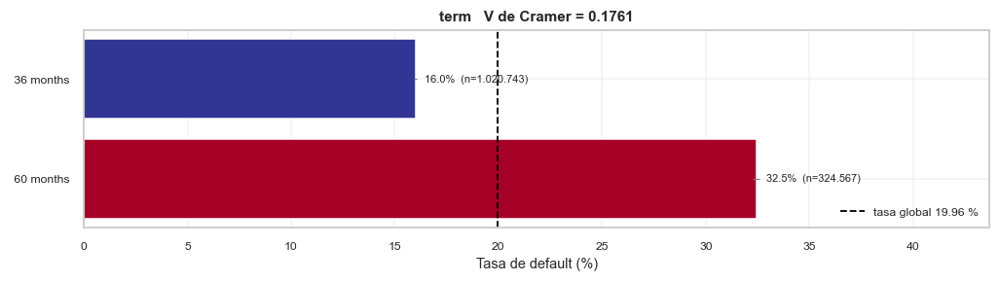

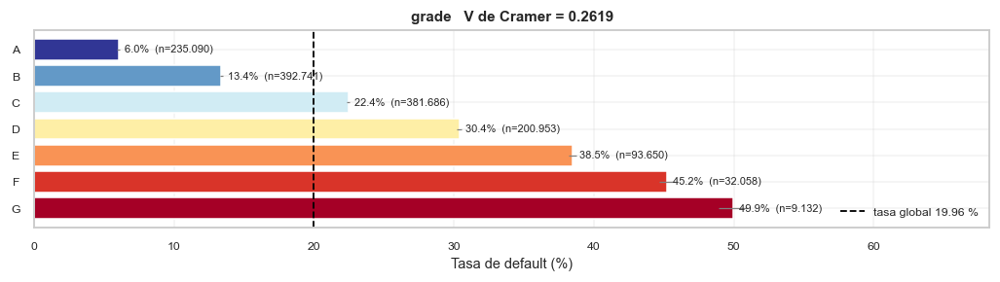

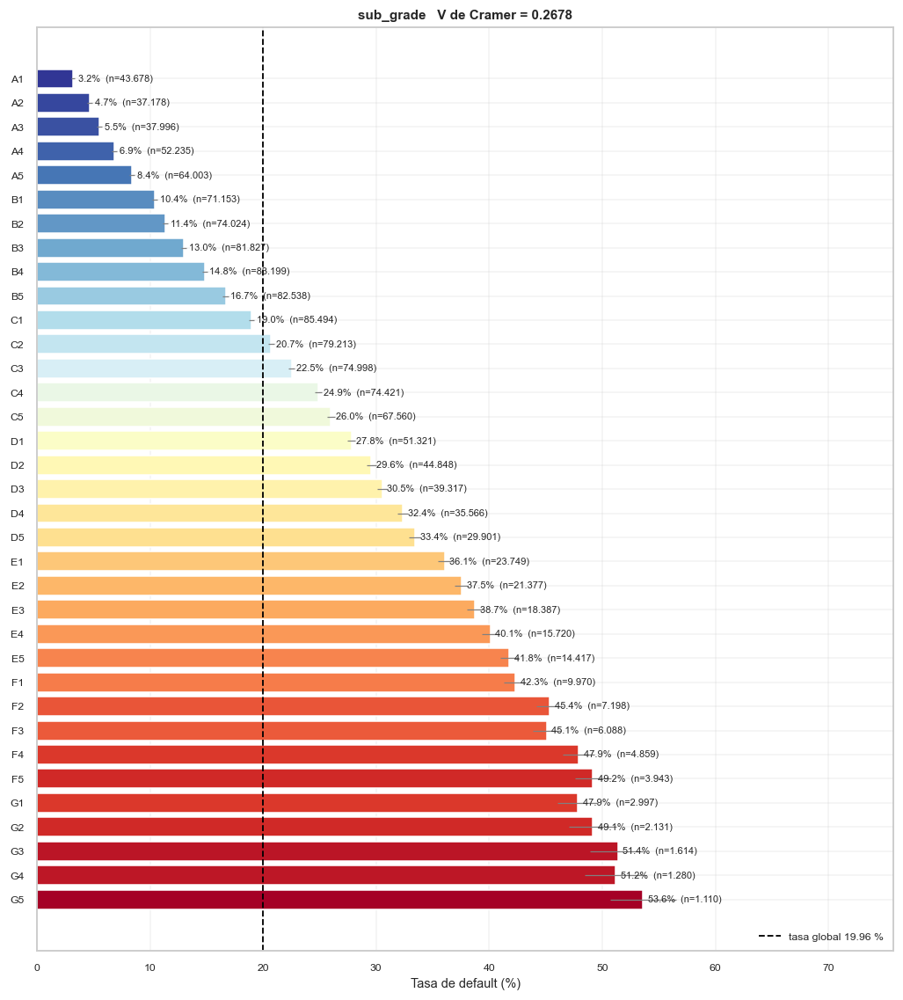

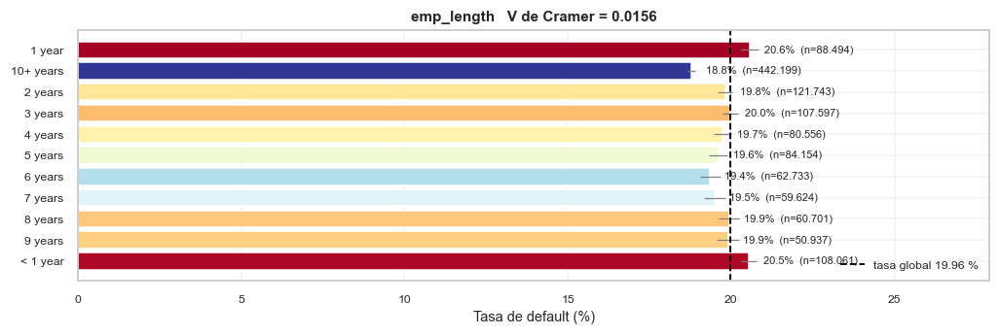

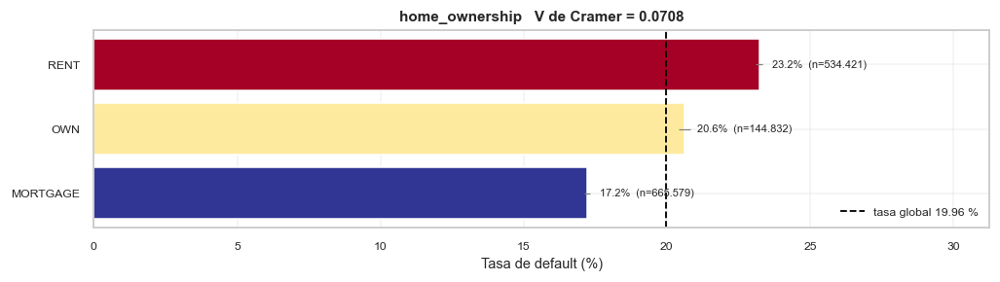

...

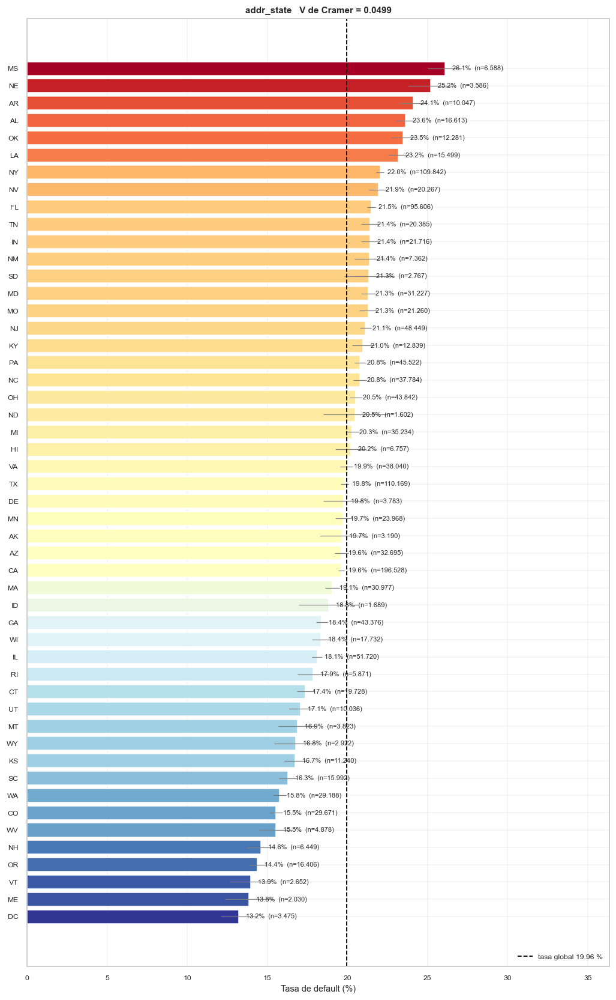

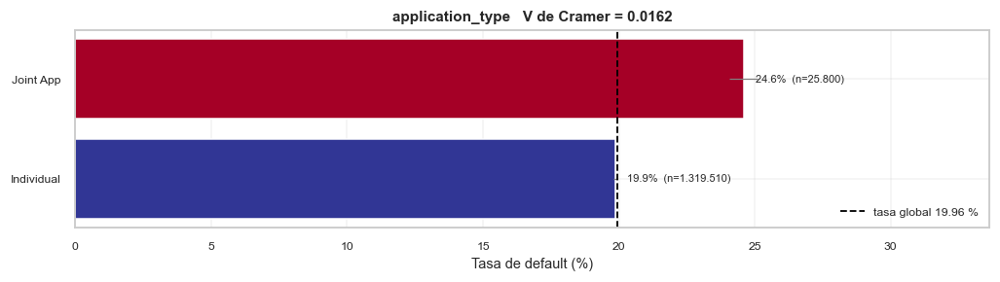

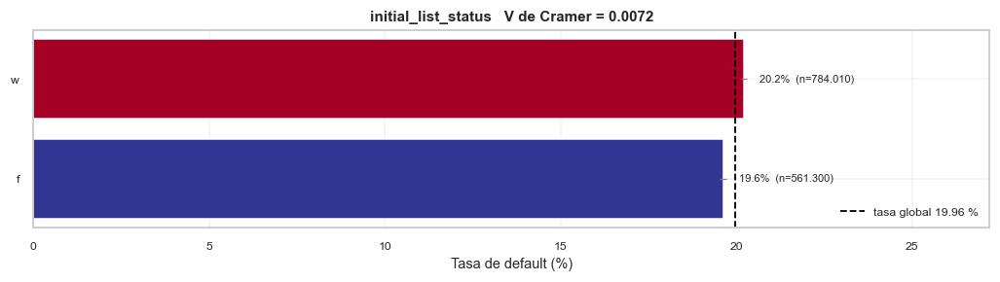

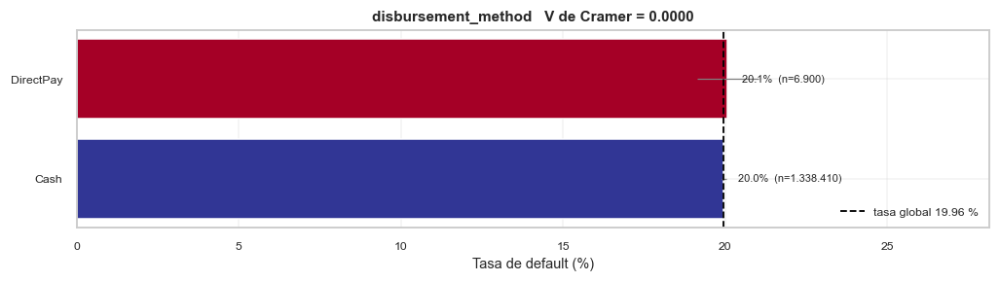

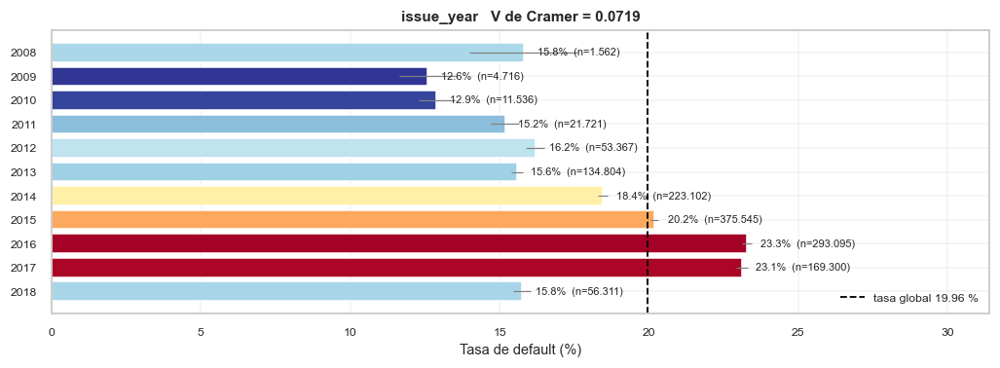

In [48]:
def barras_tasa_default(data, col, ax, min_n=500, top=None, orden_tasa=True):
  """Barras de tasa de default por categoria, con banda de IC95 y linea global."""
  ct = tabla_contingencia(data, col, min_n=min_n)
  if not orden_tasa:
    ct = ct.sort_index()
  if top:
    ct = ct.head(top)
  et = [str(i) for i in ct.index]
  err = np.vstack([ct["tasa_default_pct"] - ct["IC95_inf_pct"],
           ct["IC95_sup_pct"] - ct["tasa_default_pct"]])
  cmap = plt.cm.RdYlBu_r
  norm = mcolors.Normalize(vmin=ct["tasa_default_pct"].min(),
                vmax=ct["tasa_default_pct"].max())
  colores = [cmap(norm(v)) for v in ct["tasa_default_pct"]]
  ax.barh(et[::-1], ct["tasa_default_pct"].values[::-1],
      xerr=err[:, ::-1], color=colores[::-1], edgecolor="white",
      error_kw=dict(lw=0.8, ecolor="gray"))
  ax.axvline(TASA_DEF, color="black", ls="--", lw=1.2,
        label="tasa global {:.2f} %".format(TASA_DEF))
  for y, (v, n) in enumerate(zip(ct["tasa_default_pct"].values[::-1],
                  ct["n_total"].values[::-1])):
    ax.text(v + 0.45, y, "{:.1f}% (n={})".format(v, human_int(n)),
        va="center", fontsize=7.2)
  ax.set_xlabel("Tasa de default (%)")
  ax.set_xlim(0, ct["IC95_sup_pct"].max() * 1.34)
  ax.set_title("{}  V de Cramer = {:.4f}".format(
    col, biv_cat.loc[col, "V_cramer"] if col in biv_cat.index else np.nan), fontsize=10)
  ax.legend(fontsize=8, frameon=False, loc="lower right")
  ax.tick_params(labelsize=8)

ORDENADAS = {"grade", "sub_grade", "emp_length", "term", "issue_year"}
for col in CAT_ANALISIS:
  n = dfm[col].nunique(dropna=True)
  fig, ax = plt.subplots(figsize=(9.5, max(2.8, 0.30 * min(n, 55))))
  barras_tasa_default(dfm, col, ax, top=55, orden_tasa=(col not in ORDENADAS))
  plt.tight_layout(); plt.show()

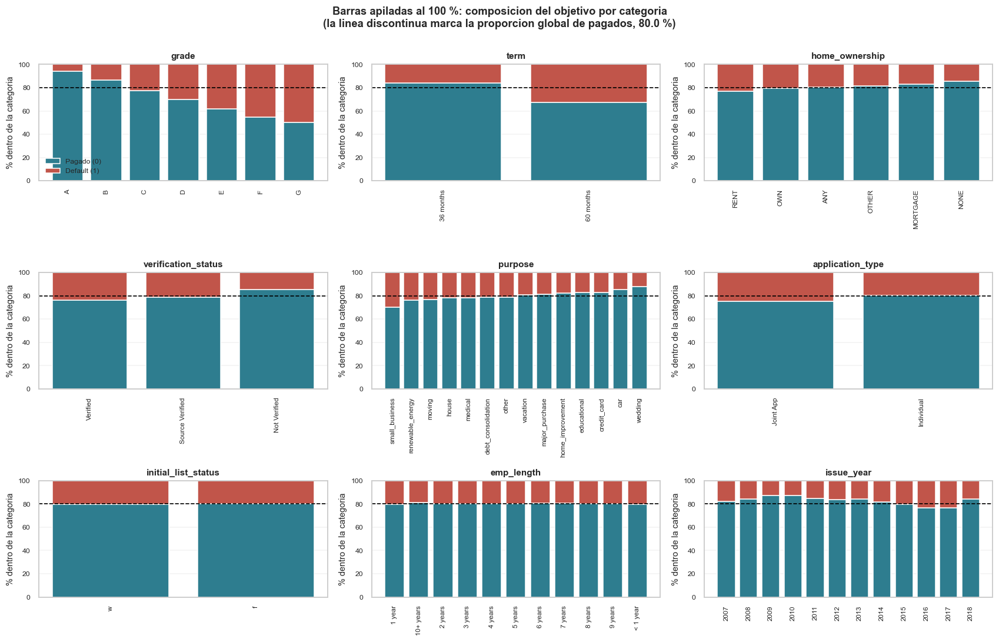

In [49]:
# --- Barras apiladas al 100 %: composicion del objetivo dentro de cada categoria
CAT_APILADAS = [c for c in ["grade", "term", "home_ownership", "verification_status",
              "purpose", "application_type", "initial_list_status",
              "emp_length", "issue_year"] if c in CAT_ANALISIS]

ncols = 3
nrows = math.ceil(len(CAT_APILADAS) / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(5.2 * ncols, 3.3 * nrows))
axes = np.atleast_1d(axes).ravel()

for ax, col in zip(axes, CAT_APILADAS):
  ct = pd.crosstab(dfm[col], dfm["default"], normalize="index") * 100
  ct = ct.sort_values(1, ascending=False) if col not in ORDENADAS else ct.sort_index()
  if len(ct) > 20:
    ct = ct.head(20)
  et = [str(i) for i in ct.index]
  ax.bar(et, ct[0], color=C_PAID, edgecolor="white", label="Pagado (0)")
  ax.bar(et, ct[1], bottom=ct[0], color=C_DEF, edgecolor="white", label="Default (1)")
  ax.axhline(100 - TASA_DEF, color="black", ls="--", lw=1.1)
  ax.set_ylim(0, 100); ax.set_ylabel("% dentro de la categoria")
  ax.set_title(col, fontsize=10)
  ax.tick_params(axis="x", rotation=90, labelsize=7.5)
  ax.tick_params(axis="y", labelsize=8)

for ax in axes[len(CAT_APILADAS):]:
  ax.set_visible(False)
axes[0].legend(fontsize=8, frameon=False, loc="lower left")
fig.suptitle("Barras apiladas al 100 %: composicion del objetivo por categoria\n"
       "(la linea discontinua marca la proporcion global de pagados, {:.1f} %)".format(100 - TASA_DEF),
       fontsize=12, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

### 5.4.1 Categorías con tasa de impago elevada

De las tablas anteriores se extraen las categorías que más se separan de la tasa global del
19,96 %. El *lift* (tasa de la categoría dividida por la global) es la forma más directa de
leerlo: un *lift* de 2,0 significa que esa categoría impaga al doble del ritmo medio.

In [50]:
destacadas = []
for col in CAT_ANALISIS:
  ct = tabla_contingencia(dfm, col, min_n=1000)
  for cat, r in ct.iterrows():
    destacadas.append(dict(variable=col, categoria=str(cat),
                n=int(r["n_total"]),
                pct_universo=r["pct_del_universo"],
                tasa_default_pct=r["tasa_default_pct"],
                lift=r["lift_vs_global"]))
destacadas = pd.DataFrame(destacadas)

show(destacadas.sort_values("lift", ascending=False).head(20).set_index(["variable", "categoria"]),
   "20 categorias de MAYOR riesgo (n >= 1.000, ordenadas por lift)")
show(destacadas.sort_values("lift").head(15).set_index(["variable", "categoria"]),
   "15 categorias de MENOR riesgo")


20 categorias de MAYOR riesgo (n >= 1.000, ordenadas por lift)
--------------------------------------------------------------


n  pct_universo  tasa_default_pct   lift
variable  categoria                                                
sub_grade G5            1110        0.0830           53.6000 2.6850
          G3            1614        0.1200           51.3600 2.5730
          G4            1280        0.0950           51.1700 2.5630
grade     G             9132        0.6790           49.9300 2.5010
sub_grade F5            3943        0.2930           49.1800 2.4640
          G2            2131        0.1580           49.1300 2.4610
          F4            4859        0.3610           47.8900 2.3990
          G1            2997        0.2230           47.8500 2.3970
          F2            7198        0.5350           45.3500 2.2720
grade     F            32058        2.3830           45.2000 2.2640
sub_grade F3            6088        0.4530           45.0700 2.2580
          F1            9970        0.7410           42.3000 2.1190
          E5           14417        1.0720           41.7700 2.0920
          E4           15720        1.1690           40.1000 2.0090
          E3           18387        1.3670           38.7100 1.9390
grade     E            93650        6.9610           38.4800 1.9280
sub_grade E2           21377        1.5890           37.5500 1.8810
          E1           23749        1.7650           36.0600 1.8060
          D5           29901        2.2230           33.4300 1.6750
term       60 months  324567       24.1260           32.4500 1.6260


15 categorias de MENOR riesgo
-----------------------------


n  pct_universo  tasa_default_pct   lift
variable   categoria                                               
sub_grade  A1          43678        3.2470            3.2200 0.1610
           A2          37178        2.7640            4.6600 0.2330
           A3          37996        2.8240            5.5100 0.2760
grade      A          235090       17.4750            6.0400 0.3030
sub_grade  A4          52235        3.8830            6.8700 0.3440
           A5          64003        4.7570            8.4000 0.4210
           B1          71153        5.2890           10.4200 0.5220
           B2          74024        5.5020           11.3600 0.5690
purpose    wedding      2294        0.1710           12.1600 0.6090
issue_year 2009         4716        0.3510           12.6000 0.6310
           2010        11536        0.8570           12.8900 0.6460
sub_grade  B3          81827        6.0820           12.9800 0.6500
addr_state DC           3475        0.2580           13.2100 0.6620
grade      B          392741       29.1930           13.3900 0.6710
addr_state ME           2030        0.1510           13.8400 0.6930

## 5.5 Multicolinealidad entre variables independientes

Se examinan las relaciones **entre predictoras**, no con el objetivo. Un par de variables
con correlación muy alta aporta información duplicada: no arruina a un RandomForest —que es
robusto a la colinealidad en términos de capacidad predictiva— pero sí **reparte de forma
arbitraria la importancia entre las dos variables**, lo que degrada la interpretabilidad y,
en particular, la calidad de las explicaciones que se obtendrán con LIME en la sección de interpretabilidad.

In [51]:
# ============================================================================
# Matriz de correlacion de Pearson entre TODAS las numericas predictoras
# ============================================================================
t0 = time.time()
CORR = dfm[NUM_ANALISIS].corr(method="pearson", numeric_only=True)
print("Matriz de correlacion {}x{} calculada en {:.1f} s".format(*CORR.shape, time.time() - t0))
CORR.to_csv(OUT_DIR / "eda_matriz_correlacion.csv")

# --- Pares con |r| > 0.7
tri = CORR.where(np.triu(np.ones(CORR.shape), k=1).astype(bool)).stack()
pares = (tri.rename("r").reset_index()
      .rename(columns={"level_0": "variable_A", "level_1": "variable_B"}))
pares["abs_r"] = pares["r"].abs()
altos = pares[pares["abs_r"] > 0.70].sort_values("abs_r", ascending=False).reset_index(drop=True)
altos["signo"] = np.where(altos["r"] > 0, "positiva", "negativa")

print()
print("Pares con |r| > 0,70 : {}".format(len(altos)))
print("Pares con |r| > 0,90 : {}".format(int((pares['abs_r'] > 0.90).sum())))
show(altos[["variable_A", "variable_B", "r", "signo"]],
   "Pares de variables numericas con correlacion alta (|r| > 0,70)")

Matriz de correlacion 75x75 calculada en 11.8 s

Pares con |r| > 0,70 : 43
Pares con |r| > 0,90 : 13

Pares de variables numericas con correlacion alta (|r| > 0,70)
--------------------------------------------------------------


,variable_A,variable_B,r,signo
0,fico_range_high,fico_range_low,1.0000,positiva
1,funded_amnt,loan_amnt,0.9996,positiva
2,funded_amnt,funded_amnt_inv,0.9991,positiva
3,num_sats,open_acc,0.9987,positiva
4,funded_amnt_inv,loan_amnt,0.9986,positiva
5,num_actv_rev_tl,num_rev_tl_bal_gt_0,0.9820,positiva
6,tot_cur_bal,tot_hi_cred_lim,0.9728,positiva
7,total_bal_il,total_il_high_credit_limit,0.9573,positiva
8,funded_amnt,installment,0.9541,positiva
9,installment,loan_amnt,0.9534,positiva


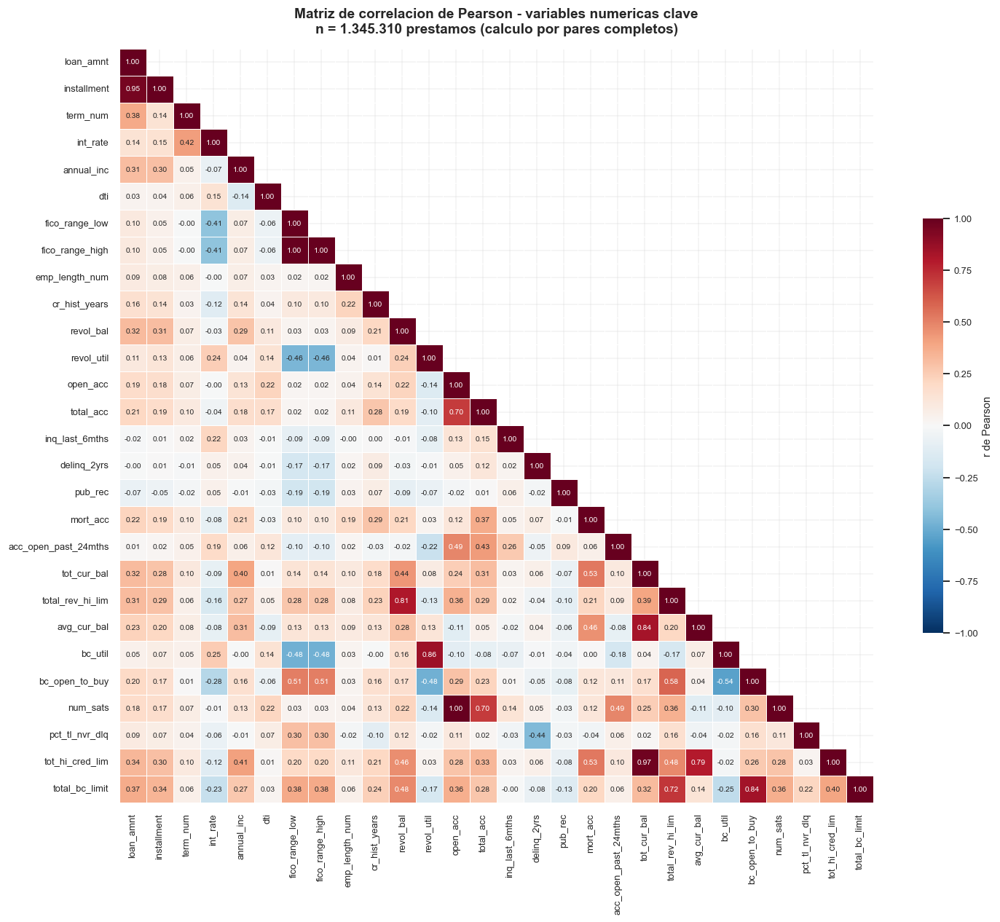

In [52]:
# --- Heatmap del subconjunto clave (legible y anotado)
CLAVE = [c for c in ["loan_amnt", "installment", "term_num", "int_rate",
           "annual_inc", "dti", "fico_range_low", "fico_range_high",
           "emp_length_num", "cr_hist_years", "revol_bal", "revol_util",
           "open_acc", "total_acc", "inq_last_6mths", "delinq_2yrs",
           "pub_rec", "mort_acc", "acc_open_past_24mths", "tot_cur_bal",
           "total_rev_hi_lim", "avg_cur_bal", "bc_util", "bc_open_to_buy",
           "num_sats", "pct_tl_nvr_dlq", "tot_hi_cred_lim", "total_bc_limit"]
     if c in NUM_ANALISIS]

sub_corr = CORR.loc[CLAVE, CLAVE]
mascara = np.triu(np.ones_like(sub_corr, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(14, 11.5))
sns.heatmap(sub_corr, mask=mascara, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
      annot=True, fmt=".2f", annot_kws=dict(size=6.8), square=True,
      linewidths=0.4, linecolor="white",
      cbar_kws=dict(shrink=0.55, label="r de Pearson"), ax=ax)
ax.set_title("Matriz de correlacion de Pearson - variables numericas clave\n"
       "n = {} prestamos (calculo por pares completos)".format(human_int(N_MOD)),
       fontsize=12.5, fontweight="bold", pad=14)
ax.tick_params(labelsize=8.5)
plt.tight_layout(); plt.show()

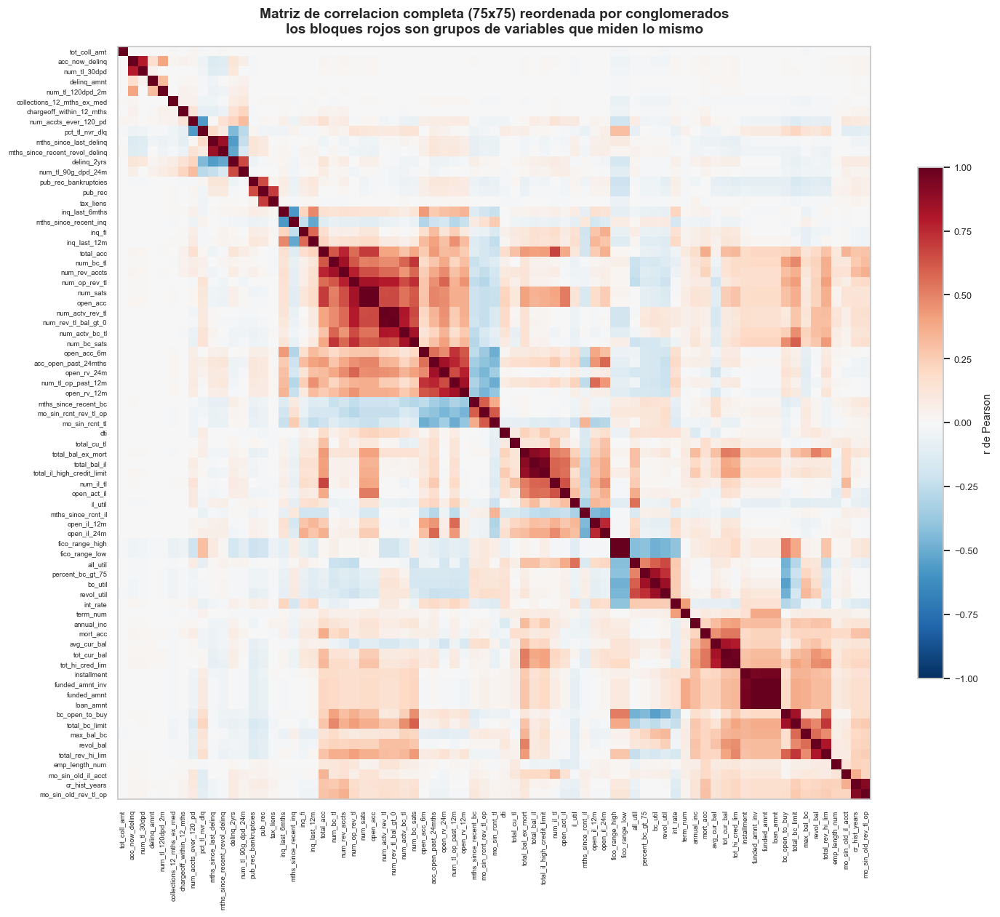

In [53]:
# --- Heatmap de la matriz completa, reordenada por conglomerados para ver la
#   estructura en bloques (sin anotaciones: son {}x{} celdas)
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import squareform

C = CORR.fillna(0.0).to_numpy()
np.fill_diagonal(C, 1.0)
D = np.clip(1.0 - np.abs(C), 0, 2)
np.fill_diagonal(D, 0.0)
D = (D + D.T) / 2.0
orden = leaves_list(linkage(squareform(D, checks=False), method="average"))
etiquetas = [NUM_ANALISIS[i] for i in orden]

fig, ax = plt.subplots(figsize=(13.5, 12))
im = ax.imshow(CORR.iloc[orden, orden].to_numpy(), cmap="RdBu_r", vmin=-1, vmax=1)
ax.set_xticks(range(len(etiquetas))); ax.set_xticklabels(etiquetas, rotation=90, fontsize=6.2)
ax.set_yticks(range(len(etiquetas))); ax.set_yticklabels(etiquetas, fontsize=6.2)
ax.grid(False)
fig.colorbar(im, ax=ax, shrink=0.6, label="r de Pearson")
ax.set_title("Matriz de correlacion completa ({0}x{0}) reordenada por conglomerados\n"
       "los bloques rojos son grupos de variables que miden lo mismo"
       .format(len(NUM_ANALISIS)), fontsize=12.5, fontweight="bold", pad=12)
plt.tight_layout(); plt.show()

### 5.5.1 Redundancias identificadas y decisiones

La matriz reordenada muestra **bloques rojos** nítidos: grupos de variables que miden
esencialmente lo mismo con nombres distintos. Las redundancias con consecuencia práctica:

| Par | r medido | Naturaleza | Decisión |
|---|---|---|---|
| `fico_range_low` ↔ `fico_range_high` | **+1,0000** | Son los dos extremos de una banda de **4 puntos**: por construcción `high = low + 4`. | Conservar **una sola**. El diseño del estudio nombra `fico_range_high`. |
| `loan_amnt` ↔ `funded_amnt` | **+0,9996** | Monto solicitado y monto concedido; coinciden en casi todos los préstamos. | Conservar `loan_amnt`. |
| `open_acc` ↔ `num_sats` | **+0,9987** | Cuentas abiertas frente a cuentas "satisfactorias": casi el mismo conteo. | Conservar `open_acc`. |
| `tot_hi_cred_lim` ↔ `tot_cur_bal` | **+0,9728** | Límite total de crédito frente a saldo total. | Conservar una, o ambas añadiendo su ratio. |
| `loan_amnt` ↔ `installment` | **+0,9534** | La cuota es una **función determinista** del monto, la tasa y el plazo. | Conservar `loan_amnt`; `installment` no añade información independiente. |
| `total_rev_hi_lim` ↔ `total_bc_limit` | **+0,7152** | Límite revolvente total frente a límite de tarjetas. | Conservar `total_rev_hi_lim`. |

**El caso especial de `int_rate` y `grade`.** Conviene revisar la redundancia
entre `fico_range_high` e `int_rate`. La evidencia apunta a algo más interesante: la
correlación `fico`–`int_rate` es **−0,41**, es decir moderada, mientras que la asociación
`grade`–`int_rate` es prácticamente **funcional** (η² = 0,909; con `sub_grade` codificado,
r = 0,977). La razón es de dominio: `grade` no es una característica del solicitante, es
**la calificación de riesgo que Lending Club le asignó**, e `int_rate` es el precio que se
deriva mecánicamente de esa calificación.

Esto convierte a ambas en un tipo de variable distinto al resto: son el **juicio de riesgo
del propio prestamista**, no atributos del solicitante. Se cuantifica a continuación.

In [54]:
# --- Cuanto de int_rate explica grade
med_por_grade = dfm.groupby("grade", observed=True)["int_rate"].agg(["mean", "std", "min", "max", "count"])
show(med_por_grade.round(3), "int_rate por grade: el precio se deriva de la calificacion")

eta2 = (dfm.groupby("grade", observed=True)["int_rate"].transform("mean").var()
    / dfm["int_rate"].var())
r_fico, _ = point_biserial(dfm["fico_range_high"], dfm["default"])
corr_fico_int = dfm[["fico_range_high", "int_rate"]].corr().iloc[0, 1]
corr_sub_int = dfm[["int_rate"]].assign(
  sub=dfm["sub_grade"].cat.codes if str(dfm["sub_grade"].dtype) == "category"
    else pd.factorize(dfm["sub_grade"])[0]).corr().iloc[0, 1]

print()
print("eta^2 de grade sobre int_rate      : {:.4f}".format(eta2))
print(" -> grade explica el {:.1f} % de la varianza de la tasa de interes.".format(100 * eta2))
print("r(fico_range_high, int_rate)       : {:.4f}".format(corr_fico_int))
print("r(sub_grade codificado, int_rate)    : {:.4f}".format(corr_sub_int))
print()
print("Conclusion: la redundancia fuerte no es fico<->int_rate (r moderado), sino")
print("grade/sub_grade <-> int_rate. Ambas codifican la MISMA decision de precio.")


int_rate por grade: el precio se deriva de la calificacion
----------------------------------------------------------


,mean,std,min,max,count
grade,,,,,
A,7.1130,1.0000,5.3100,9.6300,235090
B,10.6790,1.3470,6.0000,14.0900,392741
C,14.0210,1.2310,6.0000,17.2700,381686
D,17.7220,1.5150,6.0000,22.3500,200953
E,21.1380,2.3580,6.0000,27.2700,93650
F,24.9350,2.5820,6.0000,30.7500,32058
G,27.7260,2.5450,6.0000,30.9900,9132



eta^2 de grade sobre int_rate            : 0.9091
  -> grade explica el 90.9 % de la varianza de la tasa de interes.
r(fico_range_high, int_rate)             : -0.4054
r(sub_grade codificado, int_rate)        : 0.9766

Conclusion: la redundancia fuerte no es fico<->int_rate (r moderado), sino
grade/sub_grade <-> int_rate. Ambas codifican la MISMA decision de precio.


In [55]:
# --- Verificacion de la relacion determinista fico_low / fico_high
dif = (dfm["fico_range_high"] - dfm["fico_range_low"]).value_counts(dropna=False)
show(dif.rename_axis("fico_high - fico_low").to_frame("frecuencia"),
   "fico_range_high - fico_range_low: diferencia constante")
print()
print("r(fico_range_low, fico_range_high) = {:.6f}".format(
  dfm[['fico_range_low', 'fico_range_high']].corr().iloc[0, 1]))
print("=> Son la misma variable desplazada. Conservar una sola.")


fico_range_high - fico_range_low: diferencia constante
------------------------------------------------------


,frecuencia
fico_high - fico_low,
4.0000,1345124
5.0000,186



r(fico_range_low, fico_range_high) = 1.000000
=> Son la misma variable desplazada. Conservar una sola.


## 5.6 Asociación entre variables categóricas (V de Cramér)

Para pares de variables categóricas el coeficiente de Pearson no es aplicable. Se usa la
**V de Cramér** (derivada de chi-cuadrado, con corrección de sesgo), que toma valores en
[0, 1] y es simétrica.

Matriz V de Cramer 12x12 calculada en 8.0 s


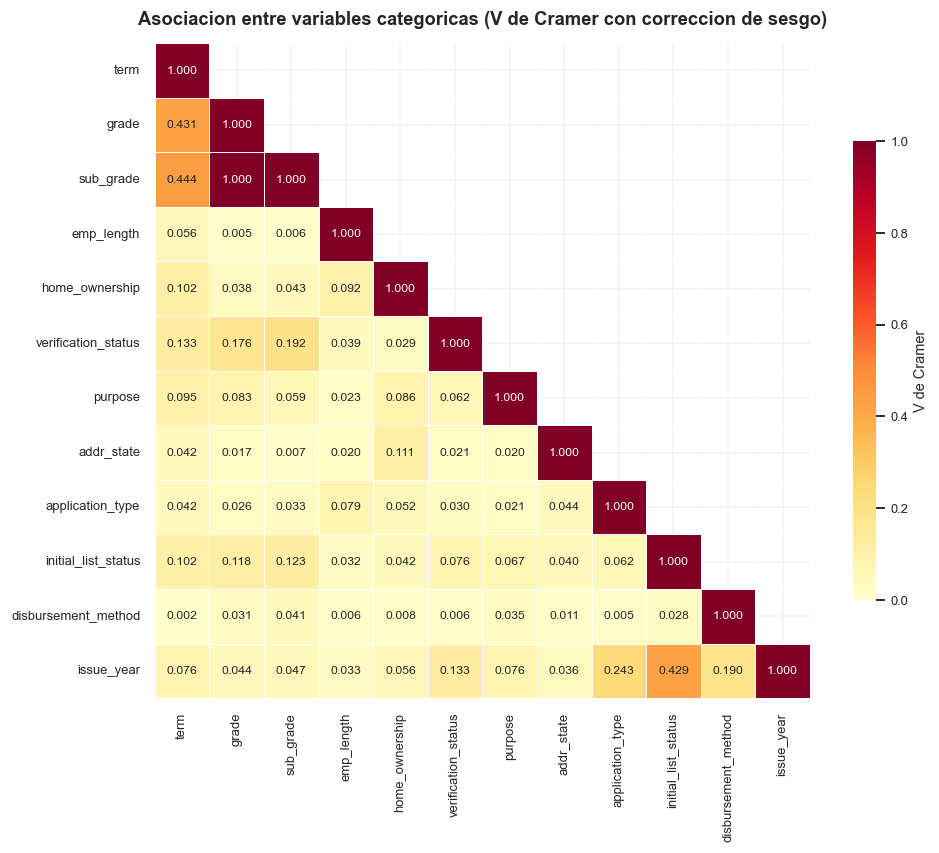


Pares de categoricas con mayor asociacion
-----------------------------------------


V
cat_A               cat_B                     
grade               sub_grade           1.0000
term                sub_grade           0.4439
                    grade               0.4310
initial_list_status issue_year          0.4286
application_type    issue_year          0.2430
sub_grade           verification_status 0.1924
disbursement_method issue_year          0.1897
grade               verification_status 0.1762
term                verification_status 0.1326
verification_status issue_year          0.1325
sub_grade           initial_list_status 0.1230
grade               initial_list_status 0.1177

In [56]:
t0 = time.time()
CV = pd.DataFrame(np.eye(len(CAT_ANALISIS)), index=CAT_ANALISIS, columns=CAT_ANALISIS)
for i, a in enumerate(CAT_ANALISIS):
  for b in CAT_ANALISIS[i + 1:]:
    v = cramers_v(dfm[a], dfm[b])
    CV.loc[a, b] = CV.loc[b, a] = v
print("Matriz V de Cramer {}x{} calculada en {:.1f} s".format(*CV.shape, time.time() - t0))
CV.to_csv(OUT_DIR / "eda_matriz_cramer.csv")

fig, ax = plt.subplots(figsize=(9.5, 7.8))
mascara = np.triu(np.ones_like(CV, dtype=bool), k=1)
sns.heatmap(CV, mask=mascara, cmap="YlOrRd", vmin=0, vmax=1, annot=True, fmt=".3f",
      annot_kws=dict(size=8), square=True, linewidths=0.5, linecolor="white",
      cbar_kws=dict(shrink=0.7, label="V de Cramer"), ax=ax)
ax.set_title("Asociacion entre variables categoricas (V de Cramer con correccion de sesgo)",
       fontsize=12, fontweight="bold", pad=12)
plt.tight_layout(); plt.show()

trav = CV.where(np.triu(np.ones(CV.shape), k=1).astype(bool)).stack().rename("V")
show(trav.reset_index().rename(columns={"level_0": "cat_A", "level_1": "cat_B"})
     .sort_values("V", ascending=False).head(12).set_index(["cat_A", "cat_B"]),
   "Pares de categoricas con mayor asociacion")

> **`grade` ↔ `sub_grade` alcanza V ≈ 1**, la confirmación numérica de la redundancia
> anidada ya detectada en la sección 4.6: `sub_grade` determina `grade` por completo. Se conservará
> únicamente `sub_grade` (más granular, 35 niveles) o `grade` (más parsimonioso, 7 niveles),
> nunca ambas. Dado que el diseño no las incluye en su lista de variables sugeridas y que
> ambas codifican el juicio del prestamista, la decisión se documenta explícitamente en la
> sección 7.

## 5.7 Visualizaciones multivariadas

Las tres visualizaciones de esta subsección (pairplot, matriz de dispersión y las densidades
condicionales) son las que el diseño autoriza a construir sobre una **muestra
representativa**. Se usa una muestra estratificada por el objetivo, con su tamaño anotado en
cada figura.

Muestra para el pairplot: 8.519 filas (0.63 % del universo)


<entorno de Python>\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


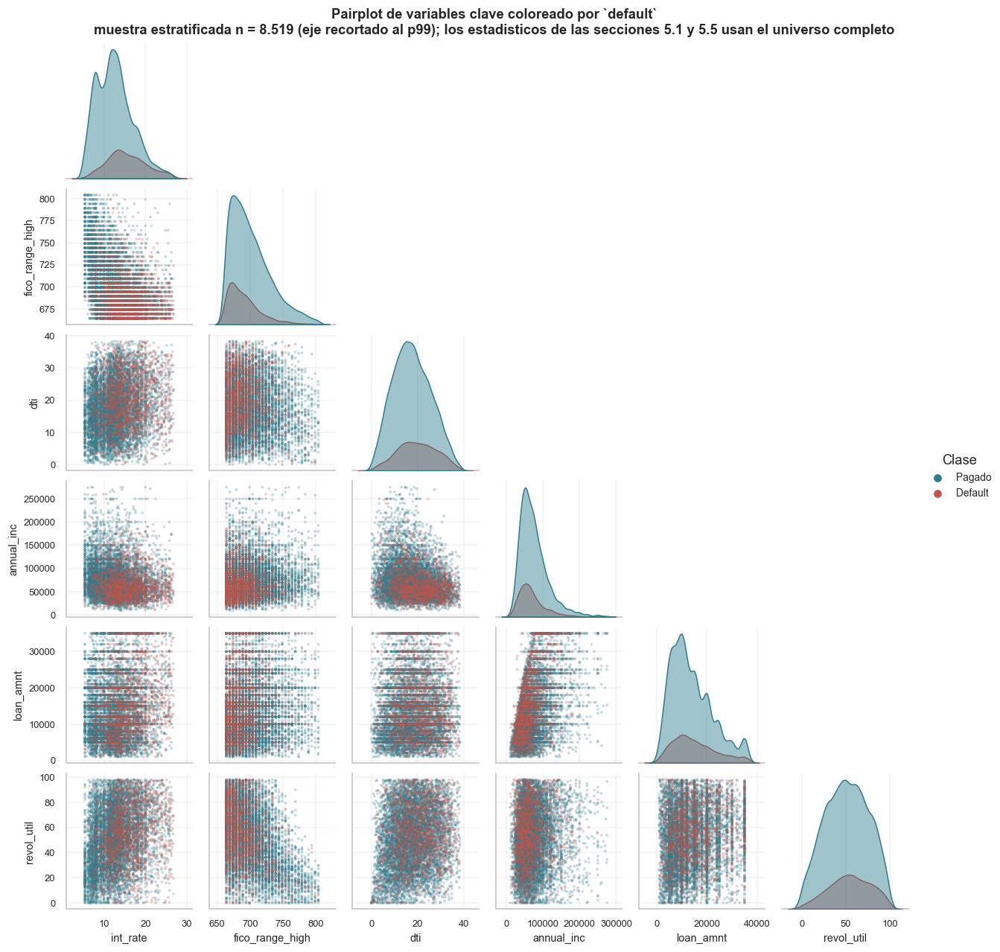

In [57]:
VARS_PAIR = [c for c in ["int_rate", "fico_range_high", "dti", "annual_inc",
             "loan_amnt", "revol_util"] if c in dfm.columns]

N_PAIR = 9000
frac_p = min(1.0, N_PAIR / N_MOD)
m_pair = (dfm.groupby("default", observed=True).sample(frac=frac_p, random_state=7)
       [VARS_PAIR + ["default"]].dropna())

# Recorte al p99 por variable para que las colas no aplasten las nubes de puntos
for c in VARS_PAIR:
  m_pair = m_pair[m_pair[c] <= m_pair[c].quantile(0.99)]
m_pair["Clase"] = m_pair["default"].map({0: "Pagado", 1: "Default"})

print("Muestra para el pairplot: {} filas ({:.2f} % del universo)".format(
  human_int(len(m_pair)), 100 * len(m_pair) / N_MOD))

g = sns.pairplot(m_pair, vars=VARS_PAIR, hue="Clase",
         palette={"Pagado": C_PAID, "Default": C_DEF},
         plot_kws=dict(s=6, alpha=0.28, edgecolor="none"),
         diag_kind="kde", diag_kws=dict(fill=True, alpha=0.45),
         corner=True, height=1.9)
g.figure.suptitle("Pairplot de variables clave coloreado por `default`\n"
         "muestra estratificada n = {} (eje recortado al p99); "
         "los estadisticos de las secciones 5.1 y 5.5 usan el universo completo"
         .format(human_int(len(m_pair))),
         fontsize=12, fontweight="bold", y=1.02)
plt.show()

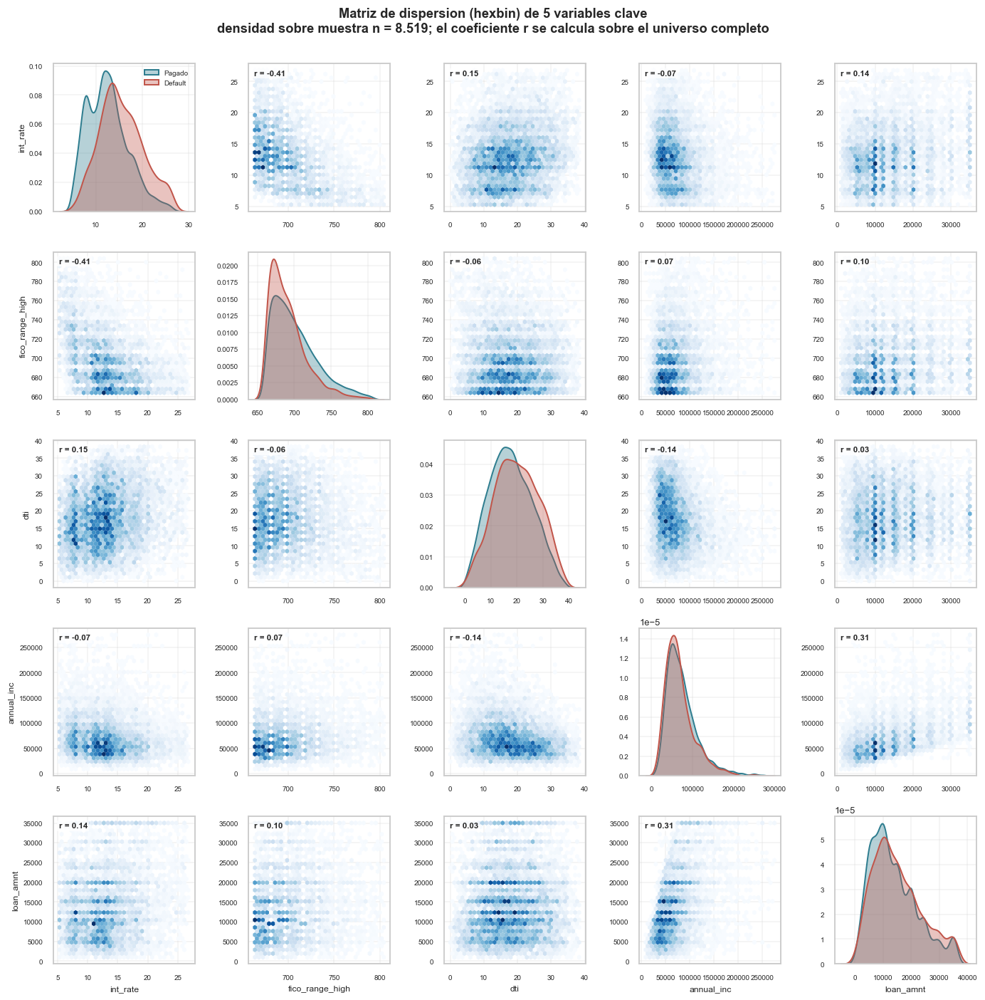

In [58]:
# --- Matriz de dispersion acotada a 5 variables, con hexbin para ver densidad real
VARS_SC = [c for c in ["int_rate", "fico_range_high", "dti", "annual_inc", "loan_amnt"]
      if c in dfm.columns]
m_sc = m_pair

n = len(VARS_SC)
fig, axes = plt.subplots(n, n, figsize=(2.55 * n, 2.55 * n))
for i, vi in enumerate(VARS_SC):
  for j, vj in enumerate(VARS_SC):
    ax = axes[i, j]
    if i == j:
      for k, et in [(0, "Pagado"), (1, "Default")]:
        sns.kdeplot(x=m_sc.loc[m_sc["default"] == k, vi], ax=ax, fill=True,
              alpha=0.35, color=PAL_TARGET[k], lw=1.3, label=et)
      ax.set_ylabel("")
      if i == 0:
        ax.legend(fontsize=6.5, frameon=False)
    else:
      ax.hexbin(m_sc[vj], m_sc[vi], gridsize=32, cmap="Blues",
           mincnt=1, linewidths=0)
      r = dfm[[vi, vj]].corr().iloc[0, 1]
      ax.text(0.04, 0.92, "r = {:.2f}".format(r), transform=ax.transAxes,
          fontsize=7.5, fontweight="bold",
          bbox=dict(fc="white", ec="none", alpha=0.75, pad=1.5))
    ax.tick_params(labelsize=6.5)
    if i == n - 1: ax.set_xlabel(vj, fontsize=8)
    else:     ax.set_xlabel("")
    if j == 0:   ax.set_ylabel(vi, fontsize=8)
    else:     ax.set_ylabel("")

fig.suptitle("Matriz de dispersion (hexbin) de 5 variables clave\n"
       "densidad sobre muestra n = {}; el coeficiente r se calcula sobre el universo completo"
       .format(human_int(len(m_sc))),
       fontsize=12, fontweight="bold", y=1.0)
plt.tight_layout(); plt.show()

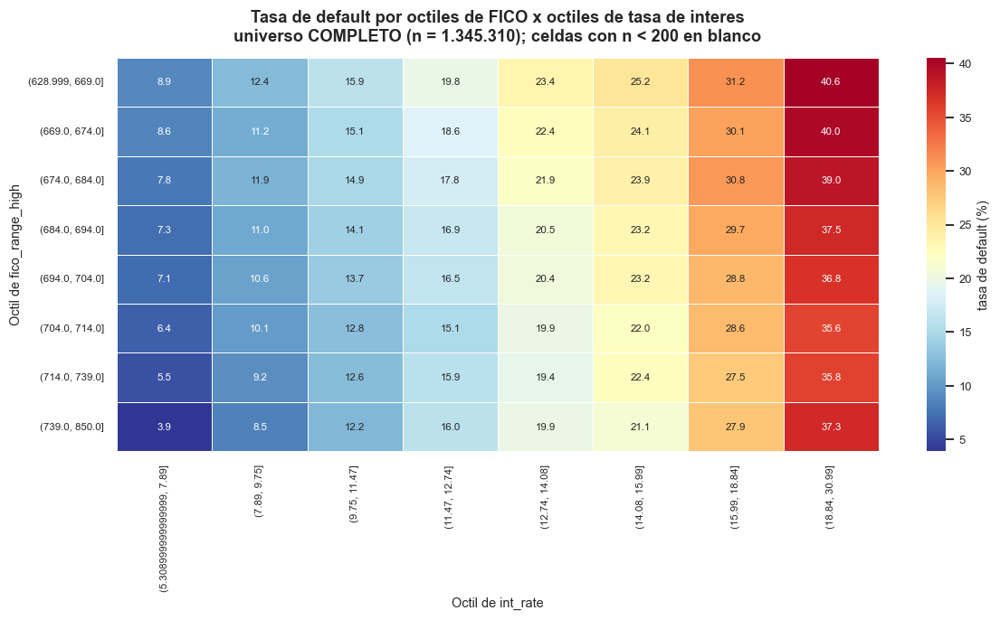

In [59]:
# --- Interaccion: tasa de default sobre la rejilla fico x int_rate (universo COMPLETO)
q_fico = pd.qcut(dfm["fico_range_high"], 8, duplicates="drop")
q_rate = pd.qcut(dfm["int_rate"], 8, duplicates="drop")
rejilla = dfm.groupby([q_fico, q_rate], observed=True)["default"].agg(["mean", "size"])
mapa = (100 * rejilla["mean"]).unstack()
tam = rejilla["size"].unstack()
mapa = mapa.where(tam >= 200)           # celdas con masa suficiente

fig, ax = plt.subplots(figsize=(11, 6.4))
sns.heatmap(mapa, cmap="RdYlBu_r", annot=True, fmt=".1f", annot_kws=dict(size=7.5),
      linewidths=0.4, linecolor="white",
      cbar_kws=dict(label="tasa de default (%)"), ax=ax)
ax.set_title("Tasa de default por octiles de FICO x octiles de tasa de interes\n"
       "universo COMPLETO (n = {}); celdas con n < 200 en blanco".format(human_int(N_MOD)),
       fontsize=12, fontweight="bold", pad=12)
ax.set_xlabel("Octil de int_rate"); ax.set_ylabel("Octil de fico_range_high")
ax.tick_params(labelsize=7.5)
plt.tight_layout(); plt.show()

> **Este último mapa es el hallazgo más informativo de la sección.** Calculado sobre el
> universo completo, muestra que la tasa de impago varía de forma **casi monótona a lo largo
> del eje de la tasa de interés** y solo débilmente a lo largo del eje de FICO. Es decir:
> una vez que se conoce el precio que la plataforma asignó al préstamo, el score FICO añade
> poca información adicional.
>
> La lectura correcta no es que FICO sea irrelevante, sino que **`int_rate` ya lo
> incorpora**: es el resultado de un modelo de riesgo propietario que Lending Club aplicó
> sobre FICO y decenas de otras variables. Predecir el default usando `int_rate` es, en gran
> medida, **replicar el modelo del prestamista** en lugar de construir uno propio.
>
> Esto no invalida su uso —se conserva explícitamente entre las variables
> relevantes y su poder predictivo es real— pero condiciona la interpretación de los
> resultados y, sobre todo, la de las explicaciones de LIME: cuando LIME señale `int_rate`
> como el factor dominante de una predicción, lo que estará mostrando es que el modelo
> aprendió a confiar en el juicio de riesgo del prestamista.

---
# 6. Valores faltantes — análisis detallado

## 6.1 Recuento por columna

In [60]:
nulos = pd.DataFrame({
  "n_nulos":    dfm.isna().sum(),
  "pct_nulos":   (100 * dfm.isna().mean()).round(3),
  "n_validos":   dfm.notna().sum(),
  "tipo":     dfm.dtypes.astype(str),
})
nulos["rol"] = taxonomia["rol"].reindex(nulos.index).fillna("derivada (EDA)")
nulos = nulos.sort_values("pct_nulos", ascending=False)
nulos.to_csv(OUT_DIR / "eda_valores_faltantes.csv")

print("Columnas sin ningun nulo   : {} de {}".format(int((nulos.pct_nulos == 0).sum()), len(nulos)))
print("Columnas con >70 % de nulos  : {}".format(int((nulos.pct_nulos > 70).sum())))
print("Columnas con 30-70 % de nulos : {}".format(int(((nulos.pct_nulos > 30) & (nulos.pct_nulos <= 70)).sum())))
print("Columnas con 0-30 % de nulos : {}".format(int(((nulos.pct_nulos > 0) & (nulos.pct_nulos <= 30)).sum())))
show(nulos, "Valores faltantes por columna - las {} columnas del universo de modelado".format(len(nulos)))

Columnas sin ningun nulo      : 53 de 157
Columnas con >70 % de nulos   : 42
Columnas con 30-70 % de nulos : 16
Columnas con  0-30 % de nulos : 46

Valores faltantes por columna - las 157 columnas del universo de modelado
-------------------------------------------------------------------------


,n_nulos,pct_nulos,n_validos,tipo,rol
member_id,1345310,100.0000,0,float32,identificador
next_pymnt_d,1345310,100.0000,0,object,fuga (post-desembolso)
orig_projected_additional_accrued_interest,1341551,99.7210,3759,float32,fuga (post-desembolso)
hardship_end_date,1339556,99.5720,5754,category,fuga (post-desembolso)
hardship_reason,1339556,99.5720,5754,category,fuga (post-desembolso)
payment_plan_start_date,1339556,99.5720,5754,category,fuga (post-desembolso)
hardship_length,1339556,99.5720,5754,float32,fuga (post-desembolso)
hardship_amount,1339556,99.5720,5754,float32,fuga (post-desembolso)
hardship_dpd,1339556,99.5720,5754,float32,fuga (post-desembolso)
hardship_loan_status,1339556,99.5720,5754,category,fuga (post-desembolso)


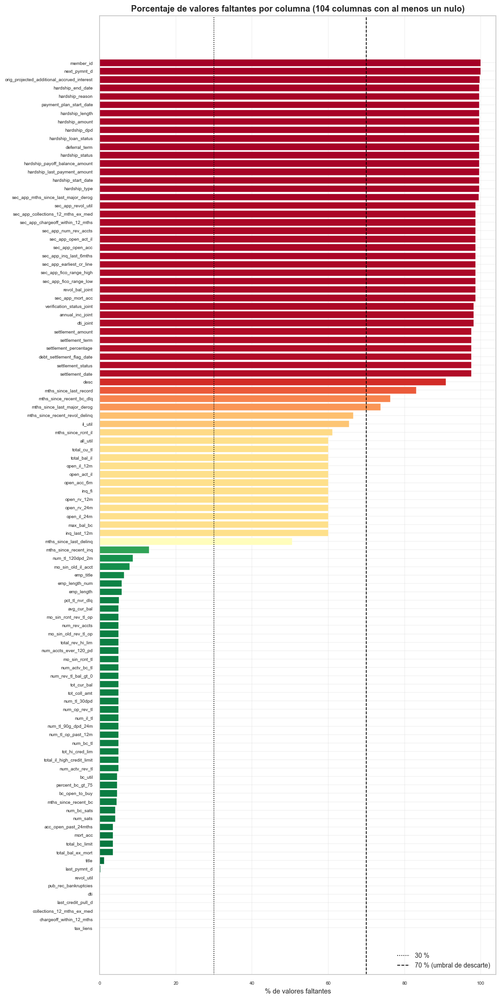

In [61]:
con_nulos = nulos[nulos.pct_nulos > 0]
fig, ax = plt.subplots(figsize=(10, max(6, 0.19 * len(con_nulos))))
cmap = plt.cm.RdYlGn_r
colores = [cmap(v / 100) for v in con_nulos["pct_nulos"]]
ax.barh(con_nulos.index[::-1], con_nulos["pct_nulos"][::-1], color=colores[::-1],
    edgecolor="white", linewidth=0.3)
for x, ls, et in [(30, ":", "30 %"), (70, "--", "70 % (umbral de descarte)")]:
  ax.axvline(x, color="black", ls=ls, lw=1.1, label=et)
ax.set_xlabel("% de valores faltantes"); ax.set_xlim(0, 104)
ax.set_title("Porcentaje de valores faltantes por columna ({} columnas con al menos un nulo)"
       .format(len(con_nulos)), fontsize=12, fontweight="bold")
ax.tick_params(labelsize=6.5)
ax.legend(frameon=False, loc="lower right")
plt.tight_layout(); plt.show()

## 6.2 Patrón de nulidad

El mapa de nulidad se construye directamente con `imshow` en lugar de recurrir a una
biblioteca de terceros, y por una razón concreta: permite **ordenar el eje vertical de forma
deliberada**. La rejilla de filas es equiespaciada y recorre el archivo de principio a fin —de
los préstamos más recientes a los más antiguos—, de modo que si la ausencia de datos tiene
estructura **temporal**, aparece como franjas horizontales en lugar de diluirse en ruido. Una
matriz de nulidad con las filas en orden arbitrario no habría revelado ese patrón.

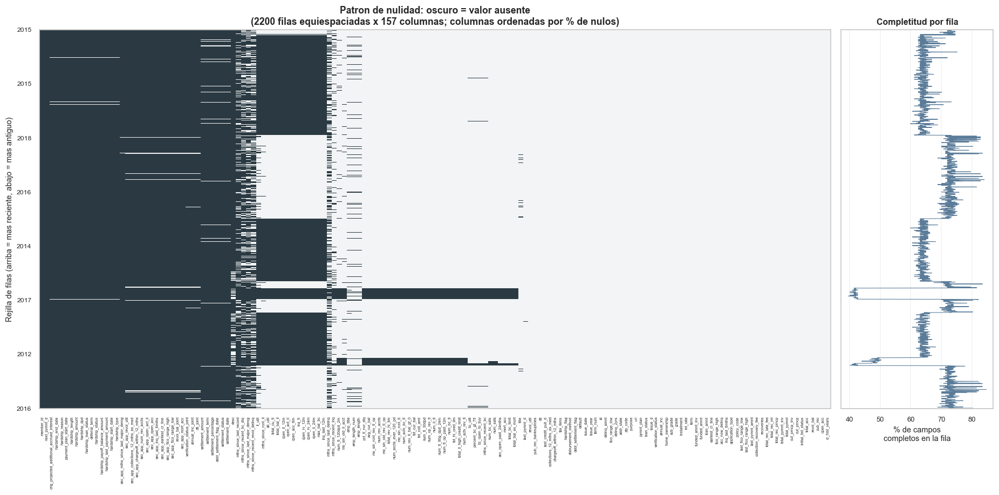

In [62]:
# Rejilla de filas equiespaciada: recorre el archivo completo de principio a fin
N_FILAS_MAPA = 2200
idx = np.linspace(0, N_MOD - 1, N_FILAS_MAPA).astype(int)
cols_mapa = list(nulos.index)           # ordenadas por % de nulos
M = dfm.iloc[idx][cols_mapa].isna().to_numpy()

fig, (ax, axd) = plt.subplots(1, 2, figsize=(17, 8.5),
               gridspec_kw=dict(width_ratios=[5.2, 1]))

ax.imshow(M, aspect="auto", cmap=mcolors.ListedColormap(["#F2F4F5", "#2B3A42"]),
     interpolation="nearest")
ax.set_xticks(range(len(cols_mapa)))
ax.set_xticklabels(cols_mapa, rotation=90, fontsize=4.6)
ax.set_ylabel("Rejilla de filas (arriba = mas reciente, abajo = mas antiguo)")
ax.set_yticks(np.linspace(0, N_FILAS_MAPA - 1, 8).astype(int))
ax.set_yticklabels([str(dfm["issue_year"].iloc[idx[i]])
          for i in np.linspace(0, N_FILAS_MAPA - 1, 8).astype(int)], fontsize=8)
ax.grid(False)
ax.set_title("Patron de nulidad: oscuro = valor ausente\n"
       "({} filas equiespaciadas x {} columnas; columnas ordenadas por % de nulos)"
       .format(N_FILAS_MAPA, len(cols_mapa)), fontsize=11.5, fontweight="bold")

# Perfil de completitud por fila
comp = 100 * (1 - M.mean(axis=1))
axd.plot(comp, range(len(comp)), lw=0.7, color=C_NEUTRAL)
axd.set_ylim(len(comp) - 1, 0)
axd.set_xlabel("% de campos\ncompletos en la fila")
axd.set_title("Completitud por fila", fontsize=10.5, fontweight="bold")
axd.set_yticks([])
plt.tight_layout(); plt.show()

> **El mapa es concluyente: la nulidad de este conjunto es fundamentalmente *temporal*.**
>
> Se aprecian **franjas horizontales netas** que cortan decenas de columnas de golpe.
> No son datos que se hayan perdido: son **campos que la plataforma no recolectaba todavía**.
> El bloque de variables de líneas a plazo e instalación (`open_acc_6m`, `total_bal_il`,
> `all_util`, `inq_fi`, `inq_last_12m`, `max_bal_bc`, `open_rv_*`, `total_cu_tl`) aparece
> vacío para los préstamos anteriores a **2012** y completo desde entonces.
>
> Que el porcentaje de nulos sea **exactamente 60,039 %** en ocho columnas distintas es la
> firma inequívoca de este mecanismo: si fueran ausencias independientes, los porcentajes
> diferirían. Aquí las columnas aparecen y desaparecen **en grupo**, cuando cambió el
> formulario de la plataforma.
>
> Conviene notar que ese 60 % es **superior al ~38 % que las mismas columnas presentan en el
> archivo completo**. La diferencia no es un error: el universo de préstamos *resueltos*
> sobrerrepresenta a las cohortes antiguas —son las que han tenido tiempo de terminar— y son
> precisamente esas cohortes las que carecen del bloque. Es la misma censura temporal de la
> sección 2.2 reapareciendo por otra vía.
>
> La consecuencia metodológica es importante: **la ausencia está correlacionada con la
> cohorte de emisión**, y la cohorte está correlacionada con la tasa de default (sección 2.3).
> Por tanto los datos **no son MCAR**, y una imputación ciega introduciría un sesgo
> sistemático a favor de las cohortes antiguas. Se comprueba formalmente a continuación.

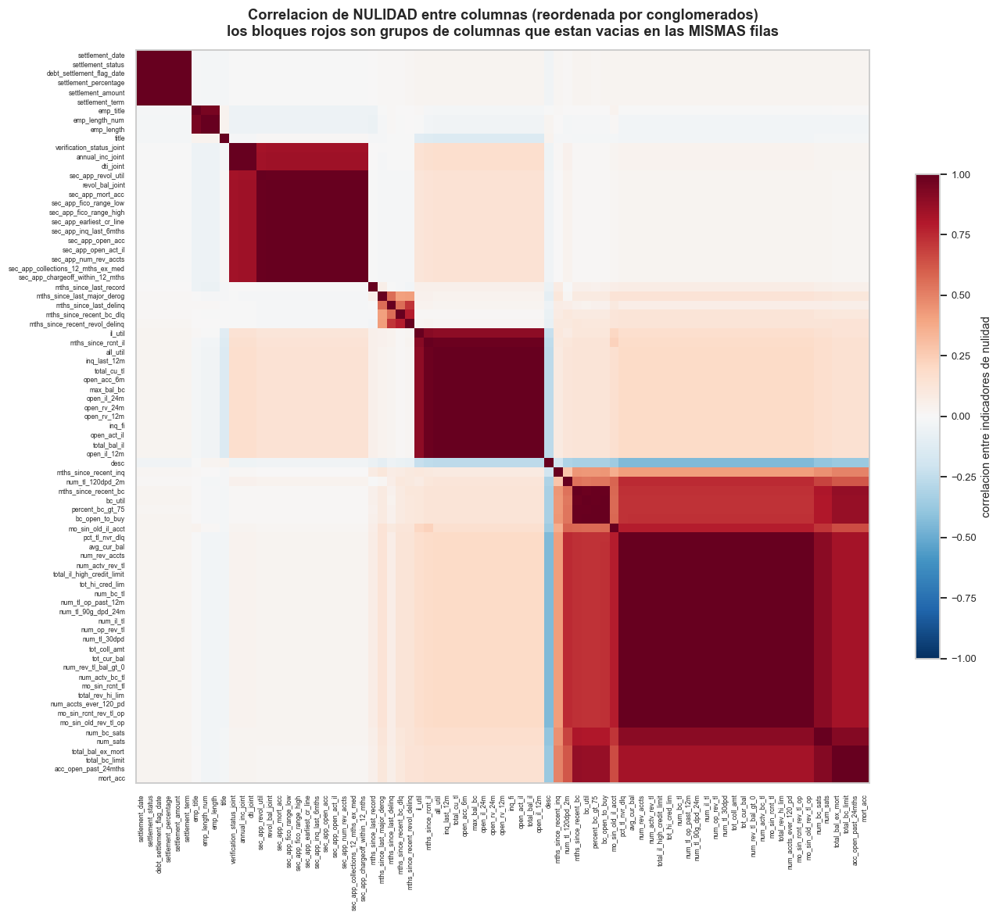

In [63]:
# --- Correlacion de nulidad: que columnas se ausentan JUNTAS
cols_nul = [c for c in nulos.index if 0.005 < nulos.loc[c, "pct_nulos"] / 100 < 0.995]
NM = dfm[cols_nul].isna()
corr_nul = NM.corr()

Dn = np.clip(1.0 - corr_nul.abs().fillna(0.0).to_numpy(), 0.0, 2.0)
np.fill_diagonal(Dn, 0.0)
Dn = (Dn + Dn.T) / 2.0
orden = leaves_list(linkage(squareform(Dn, checks=False), method="average"))
etq = [cols_nul[i] for i in orden]

fig, ax = plt.subplots(figsize=(12.5, 11))
im = ax.imshow(corr_nul.iloc[orden, orden].to_numpy(), cmap="RdBu_r", vmin=-1, vmax=1)
ax.set_xticks(range(len(etq))); ax.set_xticklabels(etq, rotation=90, fontsize=5.6)
ax.set_yticks(range(len(etq))); ax.set_yticklabels(etq, fontsize=5.6)
ax.grid(False)
fig.colorbar(im, ax=ax, shrink=0.6, label="correlacion entre indicadores de nulidad")
ax.set_title("Correlacion de NULIDAD entre columnas (reordenada por conglomerados)\n"
       "los bloques rojos son grupos de columnas que estan vacias en las MISMAS filas",
       fontsize=12, fontweight="bold", pad=12)
plt.tight_layout(); plt.show()


Distribucion de la nulidad por fila
-----------------------------------


,Valor
Metrica,
Media de campos nulos por fila,52.3900
Mediana,55
Minimo,5
Maximo,96
Filas sin ningun nulo,0
Filas con >60 campos nulos,84.688


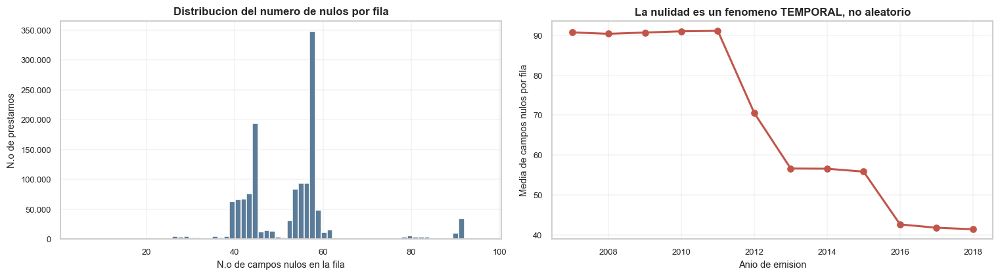

In [64]:
# --- Nulidad por fila: se concentra en ciertas filas?
n_nul_fila = dfm.isna().sum(axis=1)
res_fila = pd.DataFrame({
  "Metrica": ["Media de campos nulos por fila", "Mediana", "Minimo", "Maximo",
        "Filas sin ningun nulo", "Filas con >60 campos nulos"],
  "Valor": [round(n_nul_fila.mean(), 2), int(n_nul_fila.median()),
       int(n_nul_fila.min()), int(n_nul_fila.max()),
       human_int(int((n_nul_fila == 0).sum())),
       human_int(int((n_nul_fila > 60).sum()))],
}).set_index("Metrica")
show(res_fila, "Distribucion de la nulidad por fila")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
ax = axes[0]
ax.hist(n_nul_fila, bins=70, color=C_NEUTRAL, edgecolor="white")
ax.set_xlabel("N.o de campos nulos en la fila"); ax.set_ylabel("N.o de prestamos")
ax.set_title("Distribucion del numero de nulos por fila")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: "{:,.0f}".format(v).replace(",", ".")))

ax = axes[1]
por_anio_nul = pd.DataFrame({"anio": dfm["issue_year"], "n_nulos": n_nul_fila}).groupby("anio")["n_nulos"].mean()
ax.plot(por_anio_nul.index, por_anio_nul.values, "o-", color=C_DEF, lw=2)
ax.set_xlabel("Anio de emision"); ax.set_ylabel("Media de campos nulos por fila")
ax.set_title("La nulidad es un fenomeno TEMPORAL, no aleatorio")
plt.tight_layout(); plt.show()

## 6.3 ¿La ausencia es informativa? Contraste contra el objetivo

Se pone a prueba la hipótesis MCAR (*Missing Completely At Random*) de la forma que importa
para el modelado: **¿difiere la tasa de default entre las filas donde el valor está presente
y las filas donde falta?** Si difiere, la ausencia **es en sí misma una señal** y borrarla
por imputación equivale a destruir información.

Se contrasta con chi-cuadrado, reportando junto al p-valor la diferencia en puntos
porcentuales, que es lo que permite juzgar la relevancia práctica.

In [65]:
filas = []
for col in nulos.index[(nulos.pct_nulos > 0.5) & (nulos.pct_nulos < 99.5)]:
  if col in ("loan_status", "default"):
    continue
  ind = dfm[col].isna()
  ct = pd.crosstab(ind, dfm["default"])
  if ct.shape != (2, 2) or ct.to_numpy().min() < 10:
    continue
  chi2, p, _, _ = stats.chi2_contingency(ct)
  t_pres = 100 * ct.loc[False, 1] / ct.loc[False].sum()
  t_aus = 100 * ct.loc[True, 1] / ct.loc[True].sum()
  filas.append(dict(
    variable=col,
    pct_nulos=round(100 * ind.mean(), 2),
    tasa_default_presente_pct=round(t_pres, 2),
    tasa_default_ausente_pct=round(t_aus, 2),
    diferencia_pp=round(t_aus - t_pres, 2),
    chi2=round(chi2, 1),
    p_valor=fmt_p(p),
    signif=stars(p),
    V_cramer=round(cramers_v(ind, dfm["default"]), 4),
  ))

mcar = pd.DataFrame(filas).assign(abs_dif=lambda d: d.diferencia_pp.abs()) \
     .sort_values("abs_dif", ascending=False).drop(columns="abs_dif").set_index("variable")
mcar.to_csv(OUT_DIR / "eda_test_mcar.csv")
show(mcar, "Contraste de MCAR: la tasa de default difiere segun la ausencia del valor?")

print()
print("Variables donde la ausencia desplaza la tasa de default en >= 3 puntos porcentuales: {}"
   .format(int((mcar['diferencia_pp'].abs() >= 3).sum())))
print("=> En esos casos la ausencia es INFORMATIVA: procede crear un indicador binario.")


Contraste de MCAR: la tasa de default difiere segun la ausencia del valor?
--------------------------------------------------------------------------


,pct_nulos,tasa_default_presente_pct,tasa_default_ausente_pct,diferencia_pp,chi2,p_valor,signif,V_cramer
variable,,,,,,,,
title,1.2400,19.8500,29.0100,9.1600,863.6000,8.161e-190,***,0.0253
emp_length,5.8400,19.5300,26.9100,7.3800,"2,520.7000",< 1e-300,***,0.0433
emp_length_num,5.8400,19.5300,26.9100,7.3800,"2,520.7000",< 1e-300,***,0.0433
emp_title,6.3800,19.5400,26.1800,6.6400,"2,218.5000",< 1e-300,***,0.0406
mths_since_recent_inq,12.9400,20.7200,14.8800,-5.8400,"3,233.6000",< 1e-300,***,0.0490
acc_open_past_24mths,3.5100,20.1600,14.5600,-5.6000,893.5000,2.500e-196,***,0.0258
mort_acc,3.5100,20.1600,14.5600,-5.6000,893.5000,2.500e-196,***,0.0258
total_bc_limit,3.5100,20.1600,14.5600,-5.6000,893.5000,2.500e-196,***,0.0258
total_bal_ex_mort,3.5100,20.1600,14.5600,-5.6000,893.5000,2.500e-196,***,0.0258



Variables donde la ausencia desplaza la tasa de default en >= 3 puntos porcentuales: 67
=> En esos casos la ausencia es INFORMATIVA: procede crear un indicador binario.


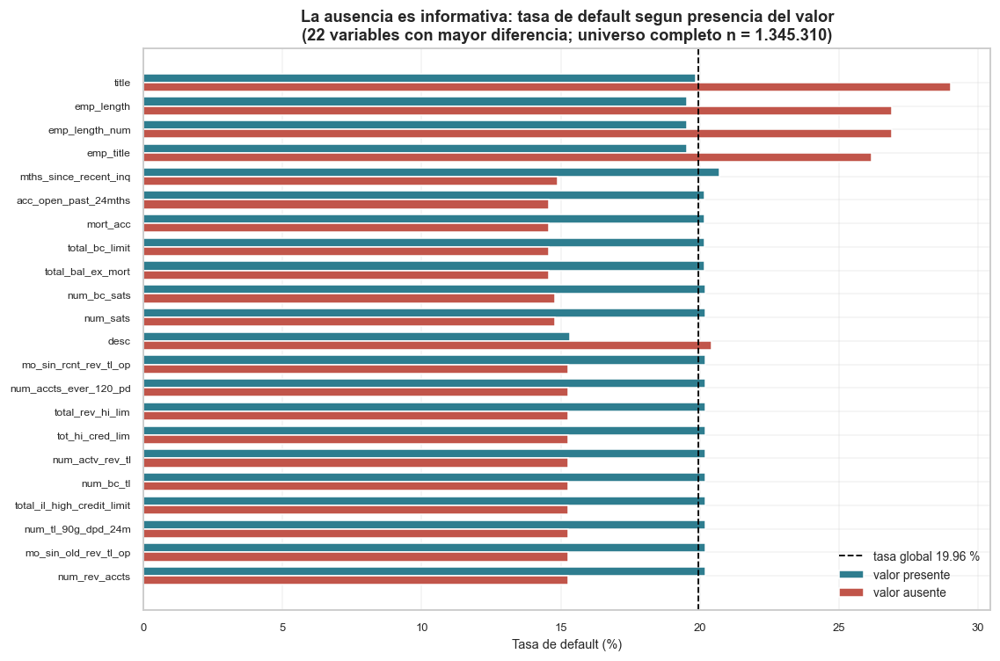

In [66]:
top_mcar = mcar.reindex(mcar["diferencia_pp"].abs().sort_values(ascending=False).index).head(22)
fig, ax = plt.subplots(figsize=(10.5, 7))
y = np.arange(len(top_mcar))
ax.barh(y - 0.19, top_mcar["tasa_default_presente_pct"], height=0.38,
    color=C_PAID, label="valor presente", edgecolor="white")
ax.barh(y + 0.19, top_mcar["tasa_default_ausente_pct"], height=0.38,
    color=C_DEF, label="valor ausente", edgecolor="white")
ax.axvline(TASA_DEF, color="black", ls="--", lw=1.2,
      label="tasa global {:.2f} %".format(TASA_DEF))
ax.set_yticks(y); ax.set_yticklabels(top_mcar.index, fontsize=8)
ax.invert_yaxis()
ax.set_xlabel("Tasa de default (%)")
ax.set_title("La ausencia es informativa: tasa de default segun presencia del valor\n"
       "(22 variables con mayor diferencia; universo completo n = {})".format(human_int(N_MOD)),
       fontsize=12, fontweight="bold")
ax.legend(frameon=False, loc="lower right")
plt.tight_layout(); plt.show()

> **La ausencia informa en las dos direcciones, y los dos casos aparecen aquí.**
>
> El más llamativo es **`emp_length`**: está vacía en solo el 5,8 % de los préstamos, pero
> entre esos casos la tasa de default es del **26,91 %** frente al **19,53 %** cuando el dato
> está presente — **+7,4 puntos porcentuales**, la mayor diferencia de toda la tabla. No
> declarar la antigüedad laboral es, en sí mismo, una señal de riesgo. Imputar esa celda con
> la moda (`10+ years`) equivaldría a **borrar la señal más fuerte que contiene la variable**,
> ya que `emp_length` como tal apenas discrimina (V de Cramér = 0,016).
>
> En sentido contrario está **`mths_since_last_delinq`**: vacía en el 50,5 % de los casos, su
> ausencia significa que **el solicitante nunca registró una morosidad**, y en consecuencia la
> tasa de default entre los ausentes es *menor* (19,26 % frente a 20,68 %). El mismo patrón,
> más marcado, se da en `mths_since_recent_inq` (14,88 % frente a 20,72 %, **−5,8 pp**) y en
> el bloque de buró de 2012 (`all_util`, `total_bal_il`, `open_acc_6m`: ≈ −4 pp cada una, que
> en realidad están midiendo el efecto de la cohorte antigua).
>
> En los dos sentidos la conclusión es la misma y es la del tramo B de la sección 4.5: imputar **y**
> conservar un indicador binario `*_faltante` que preserve el hecho de la ausencia.

## 6.4 Plan de tratamiento diferenciado

Se consolida una decisión explícita para **cada** columna, derivada de los criterios ya
justificados: rol de la variable (sección 3), tramo de nulidad (sección 4.5) e informatividad de la
ausencia (sección 6.3).

In [67]:
dif_mcar = mcar["diferencia_pp"].abs()

def plan(col):
  rol = nulos.loc[col, "rol"]
  p  = nulos.loc[col, "pct_nulos"]
  es_num = pd.api.types.is_numeric_dtype(dfm[col])

  if rol == "target":          return "Objetivo: no se imputa"
  if rol.startswith("fuga"):       return "ELIMINAR: fuga de informacion"
  if rol == "identificador":       return "ELIMINAR: identificador sin valor predictivo"
  if rol == "constante":         return "ELIMINAR: varianza nula"
  if rol == "texto libre":        return "ELIMINAR: texto libre no estructurado"
  if rol == "alta cardinalidad":     return "ELIMINAR: redundante con addr_state"
  if rol == "derivada (EDA)":      return "Auxiliar del EDA: no entra al modelo"
  if p > 70:               return "ELIMINAR: >70 % de nulos"
  if p == 0:               return "Sin nulos: no requiere tratamiento"

  informativa = dif_mcar.get(col, 0) >= 3
  if p > 30:
    return ("Imputar mediana + indicador *_faltante (ausencia informativa)" if es_num
        else "Categoria 'Desconocido' (ausencia informativa)")
  if informativa:
    return ("Imputar mediana + indicador *_faltante (ausencia informativa)" if es_num
        else "Categoria 'Desconocido' (ausencia informativa)")
  return "Imputar mediana" if es_num else "Imputar moda"

plan_final = nulos.copy()
plan_final["dif_default_pp_si_ausente"] = mcar["diferencia_pp"].reindex(plan_final.index)
plan_final["tratamiento"] = [plan(c) for c in plan_final.index]
plan_final = plan_final[["tipo", "rol", "pct_nulos", "dif_default_pp_si_ausente", "tratamiento"]]
plan_final.to_csv(OUT_DIR / "eda_plan_tratamiento.csv")
show(plan_final, "Plan de tratamiento columna por columna ({} columnas)".format(len(plan_final)))

resumen_plan = (plan_final["tratamiento"].value_counts().rename_axis("Tratamiento")
        .to_frame("N. de columnas"))
show(resumen_plan, "Resumen del plan de tratamiento")


Plan de tratamiento columna por columna (157 columnas)
------------------------------------------------------


,tipo,rol,pct_nulos,dif_default_pp_si_ausente,tratamiento
member_id,float32,identificador,100.0000,NaN,ELIMINAR: identificador sin valor predictivo
next_pymnt_d,object,fuga (post-desembolso),100.0000,NaN,ELIMINAR: fuga de informacion
orig_projected_additional_accrued_interest,float32,fuga (post-desembolso),99.7210,NaN,ELIMINAR: fuga de informacion
hardship_end_date,category,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
hardship_reason,category,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
payment_plan_start_date,category,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
hardship_length,float32,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
hardship_amount,float32,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
hardship_dpd,float32,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion
hardship_loan_status,category,fuga (post-desembolso),99.5720,NaN,ELIMINAR: fuga de informacion



Resumen del plan de tratamiento
-------------------------------


,N. de columnas
Tratamiento,
Imputar mediana + indicador *_faltante (ausencia informativa),49
ELIMINAR: fuga de informacion,38
Sin nulos: no requiere tratamiento,30
ELIMINAR: >70 % de nulos,19
Imputar mediana,8
ELIMINAR: identificador sin valor predictivo,3
ELIMINAR: texto libre (requeriria NLP),3
Objetivo: no se imputa,2
Auxiliar del EDA: no entra al modelo,2


---
# 7. Resumen ejecutivo del EDA

## 7.1 Calidad de los datos

| Aspecto | Hallazgo (cifras medidas) | Severidad |
|---|---|---|
| **Volumen** | 2.260.701 filas × 151 columnas en el archivo. Universo con desenlace observable: **1.345.310** préstamos. |
| **Artefactos de formato** | 33 filas que son pies de tabla del CSV original (`Total amount funded in policy code…`), el 0,0015 % del archivo. | Baja — corregida |
| **Censura del objetivo** | 878.317 préstamos `Current` + 34.292 en mora o `Default` + 2.749 de política antigua: **915.358 filas (40,5 %) sin etiqueta observable**. | **Crítica** — define el universo |
| **Fuga de información** | **38 columnas** se registran después del desembolso (`recoveries`, `total_pymnt`, `settlement_*`, `last_fico_*`, el bloque de *hardship*…). Verificado: \|r\| con el objetivo un orden de magnitud mayor que la mejor predictora legítima. | **Crítica** — deben excluirse |
| **Nulidad estructural** | Densidad de la matriz: **68,22 %** (108.481.302 celdas vacías de 341.360.868). La nulidad se concentra en bloques que aparecen y desaparecen **por cohorte temporal**: ocho columnas del bloque de buró comparten exactamente **60,039 %** de nulos en el universo resuelto. | Alta |
| **Ausencia informativa** | En **67 variables** la tasa de default se desplaza ≥ 3 puntos porcentuales según si el valor está presente o ausente: **los datos no son MCAR**. | Alta |
| **Valores centinela** | `dti` de −1 a exactamente 999 (533 filas > 100, 2 filas < 0); `revol_util` hasta 892,3 % (4.687 filas > 100 %); `annual_inc` = 0 en 361 filas. Son cientos de filas sobre 1,3 millones. | Baja — localizada |
| **Asimetría extrema** | `annual_inc`: máximo 10.999.200 USD, mediana 65.000, **asimetría 46,3**. `dti`: asimetría 27,1. No es universal: `revol_util` −0,04, `loan_amnt` 0,78. | Media |
| **Redundancia** | `fico_range_low`/`high` r = **+1,0000** (misma variable desplazada 4 puntos); `loan_amnt`/`funded_amnt` r = **+0,9996**; `open_acc`/`num_sats` r = **+0,9987**; `grade`/`sub_grade` V de Cramér ≈ 1. **43 pares** con \|r\| > 0,70, **13** con \|r\| > 0,90. | Media |
| **Columnas inútiles** | `member_id` (100 % nula), `policy_code` (constante), `url` (identificador), `desc` (94 % nula), `emp_title` (texto libre de altísima cardinalidad). | Baja |
| **No estacionariedad** | La tasa de default por cohorte va del **12,60 % (2009)** al **23,28 % (2016)**; el volumen de préstamos resueltos colapsa en 2017-2018 por maduración incompleta. | Alta |

## 7.2 Variables más prometedoras para predecir `default`

El hallazgo que hay que enunciar primero, porque condiciona la lectura de todo lo demás:

> De las **75 variables numéricas** contrastadas, **una sola** alcanza un tamaño de efecto
> mediano según Cohen (`int_rate`, *d* = 0,67). Solo **9** superan *d* = 0,20, y la
> **mediana de \|d\| en el conjunto es 0,0997**. Ninguna variable individual separa las
> clases: la señal es **débil y está repartida**.

Esto explica dos cosas a la vez. Explica por qué las densidades de la sección 5.3 se solapan casi
por completo, y explica por qué un ensamble de árboles tiene aquí algo que aportar sobre
cualquier regla univariada — su trabajo es justamente agregar decenas de señales débiles. Y
advierte contra una expectativa: **no debe esperarse un AUC cercano a 1**.

**Numéricas, ordenadas por el \|d\| de Cohen realmente medido:**

| # | Variable | *d* de Cohen | Media (pagado → default) | Lectura |
|---|---|---|---|---|
| 1 | `int_rate` | **+0,670** (mediano) | 12,62 % → 15,71 % | El precio que fijó la plataforma: **resume su propio modelo de riesgo** |
| 2 | `term_num` | **+0,448** | 40,9 → 45,4 meses | Más horizonte, más exposición al riesgo |
| 3 | `fico_range_high` | **−0,330** | 702,3 → 691,9 | Score de buró; parcialmente absorbido por `int_rate` (r = −0,41) |
| 4 | `acc_open_past_24mths` | **+0,250** | 4,53 → 5,33 | Apertura reciente de cuentas: búsqueda activa de crédito |
| 5 | `all_util` | **+0,215** | 57,2 → 61,7 | Utilización global del crédito — **pero 60 % nula** |
| 6 | `num_tl_op_past_12m` | **+0,214** | 2,10 → 2,49 | Igual que #4, en ventana de 12 meses |
| 7 | `dti` | **+0,212** | 17,81 → 20,17 | Carga de deuda sobre ingreso |
| 8 | `bc_open_to_buy` | **−0,205** | 10.819 → 7.679 USD | Margen disponible en tarjetas: colchón de liquidez |
| 9 | `mort_acc` | **−0,188** | 1,75 → 1,37 | Cuentas hipotecarias: estabilidad patrimonial |
| 10 | `loan_amnt` | **+0,165** | 14.134 → 15.565 USD | Monto solicitado |
| 11 | `inq_last_6mths` | **+0,164** | 0,62 → 0,78 | Consultas recientes al buró |
| 12 | `revol_util` | **+0,151** | 51,1 % → 54,8 % | Estrés de liquidez revolvente |

**Categóricas, ordenadas por la V de Cramér realmente medida:**

| # | Variable | V de Cramér | Tasa de default: mínimo → máximo | Amplitud |
|---|---|---|---|---|
| 1 | `sub_grade` | **0,268** (moderada) | A1 **3,22 %** → G5 **53,60 %** | **50,4 pp** |
| 2 | `grade` | **0,262** (moderada) | A **6,04 %** → G **49,93 %** | 43,9 pp |
| 3 | `term` | **0,176** (débil) | 36 meses 15,99 % → 60 meses **32,44 %** | 16,5 pp |
| 4 | `verification_status` | **0,092** | Not Verified 14,67 % → **Verified 23,85 %** | 9,2 pp |
| 5 | `issue_year` | **0,072** | 2009 12,60 % → 2016 23,28 % | 10,7 pp |
| 6 | `home_ownership` | **0,071** | MORTGAGE 17,21 % → RENT 23,22 % | 6,0 pp |
| 7 | `purpose` | **0,055** | wedding 12,16 % → **small_business 29,71 %** | 17,5 pp |
| 8 | `addr_state` | **0,050** | DC 13,21 % → MS 26,08 % | 12,9 pp |
| 9 | `application_type` | **0,016** | Individual 19,87 % → Joint App 24,59 % | 4,7 pp |
| 10 | `emp_length` | **0,016** | 10+ años 18,78 % → 1 año 20,56 % | **1,8 pp** |
| 11 | `initial_list_status` | 0,007 | f 19,62 % → w 20,21 % | 0,6 pp |
| 12 | `disbursement_method` | **0,000** | Cash 19,96 % → DirectPay 20,07 % | 0,1 pp |

Cuatro observaciones que salen de estas dos tablas y que el diseño no anticipa:

- **`emp_length` es casi inútil como predictor, contra toda intuición.** V de Cramér = 0,016
 y una amplitud de **1,8 puntos porcentuales** entre su mejor y su peor categoría; su versión
 numérica da *d* = −0,036. El diseño del estudio la incluye entre las variables relevantes, y se
 conservará, pero la evidencia dice que aporta casi nada. Lo llamativo es que **su ausencia
 sí informa** (sección 6.3): no declarar la antigüedad laboral eleva la tasa de default al 26,91 %
 frente al 19,53 %. El indicador `emp_length_faltante` promete más que la variable misma.
- **`verification_status` va en la dirección contraria a la esperada.** Los ingresos
 *verificados* impagan **más** (23,85 % frente a 14,67 %). No es una paradoja: la plataforma
 verifica cuando ya tiene motivos para dudar, de modo que la variable no mide la veracidad
 del ingreso sino **la sospecha previa del prestamista**. Un modelo la usará correctamente;
 un lector desprevenido la interpretará al revés.
- **`disbursement_method` tiene V de Cramér = 0,000.** Poder discriminante nulo. Se descarta.
- **Las dos variables más predictivas no describen al solicitante, sino al prestamista.**
 `int_rate` y `grade`/`sub_grade` son el juicio de riesgo que Lending Club ya emitió
 (η² = 0,909 entre ellas). Usarlas es legítimo y se conservan, pero significa que
 el modelo aprenderá en buena medida a **replicar un modelo de riesgo preexistente**. Es una
 advertencia decisiva para interpretar las explicaciones de LIME en la sección de interpretabilidad: si LIME
 señala `int_rate` como el factor dominante, lo que está mostrando es que el modelo aprendió
 a confiar en la valoración del prestamista, no que haya descubierto un patrón propio.

## 7.3 Problemas detectados y su impacto en el modelado

| Problema | Impacto | Mitigación adoptada |
|---|---|---|
| **Fuga de información** (38 columnas) | Un modelo con `recoveries` alcanza AUC ≈ 1 y es inservible en producción | Exclusión explícita y verificada empíricamente (sección 3.1) |
| **Censura del objetivo** | Etiquetar los 878.317 `Current` como pagados enseña que "reciente" = "seguro" | Universo restringido a préstamos resueltos (sección 2.2) |
| **Desbalance 4,01 : 1** | La exactitud queda inutilizada: el clasificador trivial acierta el 80,04 % | Estratificar la partición; priorizar **ROC AUC, recall y F1**; evaluar `class_weight="balanced"` |
| **Señal débil y distribuida** (mediana \|d\| = 0,10) | Ningún umbral univariado funciona; hay que esperar un AUC moderado | Es el argumento a favor del ensamble; fija expectativas realistas de métrica |
| **Asimetría extrema** | Distorsiona el escalado y cualquier métrica de distancia | `log1p` en las monetarias con asimetría > 2 |
| **Atípicos por regla de Tukey** | Hasta el 20 % de las observaciones marcadas en algunas variables | **No eliminar**: son datos válidos de una distribución asimétrica, no errores. Transformar la escala y recortar solo lo implausible |
| **Multicolinealidad** (43 pares con \|r\| > 0,70) | No degrada la predicción del RandomForest, pero **reparte de forma arbitraria la importancia** entre variables gemelas y desorienta a LIME | Descartar un miembro de cada par con \|r\| > 0,95 |
| **Nulidad estructural por cohorte** | Imputar sin marcar introduce un sesgo sistemático a favor de las cohortes antiguas | Descartar > 70 %; imputar **+ indicador** en el resto cuando la ausencia informa |
| **No estacionariedad** | Una partición aleatoria filtra información temporal entre train y test | Se aplica la partición aleatoria adoptada, dejando anotado que la metodológicamente correcta sería **temporal** |
| **Valores centinela** | `dti` = −1 o 999 y `revol_util` > 100 % contaminan medias y escalados | Convertir a nulo y tratar como faltante |

## 7.4 Decisiones preliminares para el preprocesamiento

**Universo.** Los **1.345.310** préstamos con `loan_status ∈ {Fully Paid, Charged Off}`.
Dentro de él se usa el **100 % de los registros**, sin muestreo de ningún tipo.

**Variables a eliminar**, con su justificación:

1. Las **38 columnas de fuga** post-desembolso (sección 3, verificadas en sección 3.1).
2. Identificadores y columnas sin varianza: `id`, `member_id` (100 % nula), `url`,
  `policy_code` (constante).
3. Texto libre: `desc` (94 % nula), `emp_title` (cardinalidad altísima),
  `title` (redundante con `purpose`).
4. Las **19 predictoras condicionales con > 70 % de nulos**: el bloque `sec_app_*`
  (**12 columnas**, ~98,6 % vacías, solo existen para solicitudes conjuntas), las
  **4 columnas `*_joint`**, y `mths_since_last_record` (83,0 %),
  `mths_since_recent_bc_dlq` (76,3 %), `mths_since_last_major_derog` (73,7 %).
  La información del bloque conjunto ya está capturada por `application_type`, que está
  completa.
5. Un miembro de cada par redundante: `fico_range_low` (≡ `fico_range_high` − 4),
  `funded_amnt`, `funded_amnt_inv`, `installment`, `num_sats`.
6. `zip_code`: truncado a tres dígitos y ya cubierto por `addr_state`.
7. `disbursement_method`: V de Cramér = 0,000 con el objetivo.

**Transformaciones a aplicar:**

- `emp_length` → numérica ordinal (`< 1 year` → 0,5 … `10+ years` → 10), **conservando el
 indicador de ausencia**, que es la parte informativa.
- `term` → numérica (36 / 60), eliminando el espacio inicial de la cadena.
- `earliest_cr_line` + `issue_d` → `cr_hist_years` (antigüedad crediticia en años).
- `log1p` sobre `annual_inc`, `revol_bal`, `tot_cur_bal` y las demás monetarias con
 asimetría > 2.
- Centinelas → nulo: `dti < 0` (2 filas), `dti > 100` (533), `revol_util > 200` (2).
- Categorías raras (< 1 %) agrupadas en `Otros`: `home_ownership` (ANY / NONE / OTHER),
 `purpose` (`educational`, `wedding`, `renewable_energy`).

**Tratamiento de nulos** (tres tramos justificados en sección 4.5 y validados en sección 6.3):

| Tramo | Acción |
|---|---|
| 0 % (53 columnas) | Nada |
| 0–30 % y ausencia **no** informativa | Imputar mediana (numéricas) / moda (categóricas) |
| 0–30 % y ausencia **informativa** | Imputar + indicador binario `*_faltante` |
| 30–70 % (16 columnas) | Imputar + indicador binario `*_faltante` |
| > 70 % (42 columnas) | Eliminar la columna |

**Codificación y escalado** (siguiendo el preprocesamiento):

- `OneHotEncoder` para las categóricas de baja cardinalidad (`term`, `home_ownership`,
 `verification_status`, `purpose`, `application_type`, `initial_list_status`).
- `addr_state` (51 niveles): *one-hot* genera 51 columnas y es viable, pero conviene
 contrastarlo con una agrupación por región dado que su V de Cramér es de solo 0,050.
- **`grade` / `sub_grade`: usar solo una.** V de Cramér ≈ 1 entre ellas. `sub_grade` tiene
 más resolución (amplitud de 50,4 pp frente a 43,9); `grade` es más parsimonioso.
- `StandardScaler` sobre las numéricas. Para RandomForest es indiferente —los árboles son
 invariantes a transformaciones monótonas— pero el diseño del estudio lo pide y es **necesario para
 LIME**, que perturba las variables en su propia escala y produce explicaciones
 incomparables entre sí si esas escalas difieren en órdenes de magnitud.

**Partición y balanceo:**

- `train_test_split(test_size=0.2, stratify=y, random_state=42)`.
- En PySpark, `randomSplit(...)` **no estratifica**; con *n* = 1,3 M la desviación esperada es
 despreciable, pero para paridad metodológica estricta habría que usar `sampleBy` sobre la
 columna objetivo. Queda anotado como diferencia real entre los dos entornos, pertinente
 para la comparación de la comparación final.
- Balanceo: empezar con `class_weight="balanced"` y **medir** si aporta. Con 268.559 casos
 positivos no hay escasez absoluta de la clase minoritaria; el desbalance aquí es de
 proporción, no de volumen. SMOTE sobre 1,3 millones de filas con decenas de categóricas
 codificadas sería costoso y arriesgado, y no se recomienda a partir de esta evidencia.

## 7.5 Nota sobre el conjunto de préstamos rechazados

El directorio del proyecto incluye además `rejected_2007_to_2018Q4.csv` — **27.648.741**
solicitudes **rechazadas** (12 veces más filas que el de aceptados), con solo 9 columnas y un
esquema completamente distinto: `Amount Requested`, `Application Date` (aquí sí en formato
ISO), `Loan Title`, `Risk_Score`, `Debt-To-Income Ratio` (texto con `%`), `Zip Code`,
`State`, `Employment Length`, `Policy Code`.

Queda **fuera del alcance** de este proyecto por una razón estructural, no de conveniencia:
esas solicitudes **nunca fueron préstamos**, así que no tienen ni pueden tener `loan_status`.
Sin variable objetivo no hay aprendizaje supervisado posible sobre ellas. Solo cuatro campos
son siquiera comparables con la tabla de aceptados (monto, DTI, ubicación y antigüedad
laboral), y ninguno comparte formato.

Sí conviene registrar lo que su existencia implica para interpretar los resultados: los
préstamos aceptados **no son una muestra aleatoria de quienes solicitaron crédito**, sino el
resultado de un filtro de aprobación previo que descartó a doce de cada trece solicitantes.
El modelo que se construya aquí estima la probabilidad de default *condicionada a haber sido
aprobado*, y no puede extrapolarse a la población general de solicitantes. Es la forma de
**sesgo de selección** que la literatura de crédito llama *reject inference*, y su
tratamiento correcto exigiría métodos que quedan fuera del alcance del ejercicio.

In [68]:
# ============================================================================
# Persistencia para las fases siguientes del proyecto
# ============================================================================
COLS_LISTAS = {
  "NUM_ANALISIS": NUM_ANALISIS,
  "CAT_ANALISIS": CAT_ANALISIS,
  "NUM_FOCO":   NUM_FOCO,
  "FUGA":     FUGA,
  "DERIV_NUM":  DERIV_NUM,
}
pd.to_pickle(
  dict(taxonomia=taxonomia, plan_tratamiento=plan_final,
     stats_num=stats_num, biv_num=biv_num.drop(columns="abs_d"),
     biv_cat=biv_cat, mcar=mcar, corr=CORR, cramer=CV,
     listas=COLS_LISTAS,
     meta=dict(n_archivo=int(N_ANTES), n_universo=int(N_MOD),
          tasa_default_pct=float(TASA_DEF), ratio_desbalance=float(RATIO),
          t_carga_pandas_s=float(T_CARGA_PANDAS))),
  OUT_DIR / "eda_resultados.pkl")

print("Artefactos guardados en", OUT_DIR)
for f in sorted(OUT_DIR.glob("*")):
  print(" {:38s} {:>9.1f} KB".format(f.name, f.stat().st_size / 1024))

print()
print("=" * 78)
print("EDA COMPLETADO")
print("=" * 78)
print(" Archivo leido      : {} filas x {} columnas".format(human_int(N_ANTES), N_COLS))
print(" Universo de modelado   : {} prestamos resueltos".format(human_int(N_MOD)))
print(" Tasa de default     : {:.2f} %  (desbalance {:.2f} : 1)".format(TASA_DEF, RATIO))
print(" Columnas de fuga excluidas: {}".format(len(FUGA)))
print(" Numericas analizadas   : {}".format(len(NUM_ANALISIS)))
print(" Categoricas analizadas  : {}".format(len(CAT_ANALISIS)))
print()
print(" Siguiente fase: preprocesamiento (el preprocesamiento) con scikit-learn y PySpark.")

Artefactos guardados en <directorio del proyecto>\outputs
  col_profile.pkl                             15.5 KB
  eda_bivariado_categoricas.csv                1.9 KB
  eda_bivariado_numericas.csv                 15.5 KB
  eda_matriz_correlacion.csv                 114.2 KB
  eda_matriz_cramer.csv                        3.0 KB
  eda_plan_tratamiento.csv                    14.1 KB
  eda_resultados.pkl                          85.0 KB
  eda_stats_numericas.csv                     11.1 KB
  eda_test_mcar.csv                            5.0 KB
  eda_valores_faltantes.csv                    9.3 KB

EDA COMPLETADO
  Archivo leido            : 2.260.701 filas x 151 columnas
  Universo de modelado     : 1.345.310 prestamos resueltos
  Tasa de default          : 19.96 %   (desbalance 4.01 : 1)
  Columnas de fuga excluidas: 38
  Numericas analizadas     : 75
  Categoricas analizadas   : 12

  Siguiente fase: preprocesamiento (el preprocesamiento) con scikit-learn y PySpark.
